In [2]:
#all in one 
# import data
import sys
from pathlib import Path
import subprocess
import os
import gc
from glob import glob

import numpy as np
import pandas as pd
import polars as pl
from datetime import datetime
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

ROOT = '/Users/bingzhi/git/finrisk/cririsk'
from sklearn.model_selection import TimeSeriesSplit, GroupKFold, StratifiedGroupKFold
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.metrics import roc_auc_score
import lightgbm as lgb

from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import OrdinalEncoder
from sklearn.impute import KNNImputer

In [6]:
class Pipeline:

    def set_table_dtypes(df):
        for col in df.columns:
            if col in ["case_id", "WEEK_NUM", "num_group1", "num_group2"]:
                df = df.with_columns(pl.col(col).cast(pl.Int64))
            elif col in ["date_decision"]:
                df = df.with_columns(pl.col(col).cast(pl.Date))
            elif col[-1] in ("P", "A"):
                df = df.with_columns(pl.col(col).cast(pl.Float64))
            elif col[-1] in ("M",):
                df = df.with_columns(pl.col(col).cast(pl.String))
            elif col[-1] in ("D",):
                df = df.with_columns(pl.col(col).cast(pl.Date))
        return df

    def handle_dates(df):
        for col in df.columns:
            if col[-1] in ("D",):
                df = df.with_columns(pl.col(col) - pl.col("date_decision"))  #!!?
                df = df.with_columns(pl.col(col).dt.total_days()) # t - t-1
        df = df.drop("date_decision", "MONTH")
        return df

    def filter_cols(df):
        for col in df.columns:
            if col not in ["target", "case_id", "WEEK_NUM"]:
                isnull = df[col].is_null().mean()
                if isnull > 0.7:
                    df = df.drop(col)
        
        for col in df.columns:
            if (col not in ["target", "case_id", "WEEK_NUM"]) & (df[col].dtype == pl.String):
                freq = df[col].n_unique()
                if (freq == 1) | (freq > 200):
                    df = df.drop(col)
        
        return df
    

class Aggregator:
    #Please add or subtract features yourself, be aware that too many features will take up too much space.
    def num_expr(df):
        cols = [col for col in df.columns if col[-1] in ("P", "A")]
        expr_max = [pl.max(col).alias(f"max_{col}") for col in cols]
        
        expr_last = [pl.last(col).alias(f"last_{col}") for col in cols]
        #expr_first = [pl.first(col).alias(f"first_{col}") for col in cols]
        expr_mean = [pl.mean(col).alias(f"mean_{col}") for col in cols]
        return expr_max +expr_last+expr_mean
    
    def date_expr(df):
        cols = [col for col in df.columns if col[-1] in ("D")]
        expr_max = [pl.max(col).alias(f"max_{col}") for col in cols]
        #expr_min = [pl.min(col).alias(f"min_{col}") for col in cols]
        expr_last = [pl.last(col).alias(f"last_{col}") for col in cols]
        #expr_first = [pl.first(col).alias(f"first_{col}") for col in cols]
        expr_mean = [pl.mean(col).alias(f"mean_{col}") for col in cols]
        return  expr_max +expr_last+expr_mean
    
    def str_expr(df):
        cols = [col for col in df.columns if col[-1] in ("M",)]
        expr_max = [pl.max(col).alias(f"max_{col}") for col in cols]
        #expr_min = [pl.min(col).alias(f"min_{col}") for col in cols]
        expr_last = [pl.last(col).alias(f"last_{col}") for col in cols]
        #expr_first = [pl.first(col).alias(f"first_{col}") for col in cols]
        #expr_count = [pl.count(col).alias(f"count_{col}") for col in cols]
        return  expr_max +expr_last#+expr_count
    
    def other_expr(df):
        cols = [col for col in df.columns if col[-1] in ("T", "L")]
        expr_max = [pl.max(col).alias(f"max_{col}") for col in cols]
        #expr_min = [pl.min(col).alias(f"min_{col}") for col in cols]
        expr_last = [pl.last(col).alias(f"last_{col}") for col in cols]
        #expr_first = [pl.first(col).alias(f"first_{col}") for col in cols]
        return  expr_max +expr_last
    
    def count_expr(df):
        cols = [col for col in df.columns if "num_group" in col]
        expr_max = [pl.max(col).alias(f"max_{col}") for col in cols] 
        #expr_min = [pl.min(col).alias(f"min_{col}") for col in cols]
        expr_last = [pl.last(col).alias(f"last_{col}") for col in cols]
        #expr_first = [pl.first(col).alias(f"first_{col}") for col in cols]
        return  expr_max +expr_last
    
    def get_exprs(df):
        exprs = Aggregator.num_expr(df) + \
                Aggregator.date_expr(df) + \
                Aggregator.str_expr(df) + \
                Aggregator.other_expr(df) + \
                Aggregator.count_expr(df)

        return exprs
    

def read_file(path, depth=None):
    df = pl.read_parquet(path)
    df = df.pipe(Pipeline.set_table_dtypes)
    if depth in [1,2]:
        df = df.group_by("case_id").agg(Aggregator.get_exprs(df)) 
    return df

def read_files(regex_path, depth=None):
    chunks = []
    
    for path in glob(str(regex_path)):
        df = pl.read_parquet(path)
        df = df.pipe(Pipeline.set_table_dtypes)
        if depth in [1, 2]:
            df = df.group_by("case_id").agg(Aggregator.get_exprs(df))
        chunks.append(df)
    
    df = pl.concat(chunks, how="vertical_relaxed")
    df = df.unique(subset=["case_id"])
    return df

def feature_eng(df_base, depth_0, depth_1, depth_2):
    df_base = (
        df_base
        .with_columns(
            month_decision = pl.col("date_decision").dt.month(),
            weekday_decision = pl.col("date_decision").dt.weekday(),
        )
    )
    for i, df in enumerate(depth_0 + depth_1 + depth_2):
        df_base = df_base.join(df, how="left", on="case_id", suffix=f"_{i}")
    df_base = df_base.pipe(Pipeline.handle_dates)
    return df_base

def to_pandas(df_data, cat_cols=None):
    df_data = df_data.to_pandas()
    if cat_cols is None:
        cat_cols = list(df_data.select_dtypes("object").columns)
    df_data[cat_cols] = df_data[cat_cols].astype("category")
    return df_data, cat_cols


def reduce_mem_usage(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype
        if str(col_type)=="category":
            continue
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            continue
    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df

ROOT            = Path('/Users/bingzhi/git/finrisk/cririsk')

TRAIN_DIR       = ROOT / "dataset" / "train"
TEST_DIR        = ROOT / "dataset" / "test"


data_store = {
    "df_base": read_file(TRAIN_DIR / "train_base.parquet"),
    "depth_0": [
        read_file(TRAIN_DIR / "train_static_cb_0.parquet"),
        read_files(TRAIN_DIR / "train_static_0_*.parquet"),
    ],
    "depth_1": [
        read_files(TRAIN_DIR / "train_applprev_1_*.parquet", 1),
        read_file(TRAIN_DIR / "train_tax_registry_a_1.parquet", 1),
        read_file(TRAIN_DIR / "train_tax_registry_b_1.parquet", 1),
        read_file(TRAIN_DIR / "train_tax_registry_c_1.parquet", 1),
        read_files(TRAIN_DIR / "train_credit_bureau_a_1_*.parquet", 1),
        read_file(TRAIN_DIR / "train_credit_bureau_b_1.parquet", 1),
        read_file(TRAIN_DIR / "train_other_1.parquet", 1),
        read_file(TRAIN_DIR / "train_person_1.parquet", 1),
        read_file(TRAIN_DIR / "train_deposit_1.parquet", 1),
        read_file(TRAIN_DIR / "train_debitcard_1.parquet", 1),
    ],
    "depth_2": [
        read_file(TRAIN_DIR / "train_credit_bureau_b_2.parquet", 2),
        read_files(TRAIN_DIR / "train_credit_bureau_a_2_*.parquet", 2),
        read_file(TRAIN_DIR / "train_applprev_2.parquet", 2),
        read_file(TRAIN_DIR / "train_person_2.parquet", 2)
    ]
}



In [7]:
df_train = feature_eng(**data_store)
print("train data shape:\t", df_train.shape)
del data_store
df_train = df_train.pipe(Pipeline.filter_cols)
gc.collect()

train data shape:	 (1526659, 861)


1588

In [8]:
cnt_encoding_cols = df_train.select(pl.selectors.by_dtype([pl.String, pl.Boolean, pl.Categorical])).columns

mappings = {}
for col in cnt_encoding_cols:
    mappings[col] = df_train.group_by(col).len()

df_train_lazy = df_train.select(mappings.keys()).lazy()
# df_train_lazy = pl.LazyFrame(df_train.select('case_id'))

for col, mapping in mappings.items():
    remapping = {category: count for category, count in mapping.rows()}
    remapping[None] = -2
    expr = pl.col(col).replace(
                remapping,
                default=-1,
            )
    df_train_lazy = df_train_lazy.with_columns(expr.alias(col + '_cnt'))
    del col, mapping, remapping
    gc.collect()

del mappings
transformed_train = df_train_lazy.collect()

df_train = pl.concat([df_train, transformed_train.select("^*cnt$")], how='horizontal')
del transformed_train, cnt_encoding_cols

gc.collect()


0

In [9]:
df_train, cat_cols = to_pandas(df_train)
df_train = reduce_mem_usage(df_train)
print("train data shape:\t", df_train.shape)
nums=df_train.select_dtypes(exclude='category').columns
from itertools import combinations, permutations
#df_train=df_train[nums]
nans_df = df_train[nums].isna()
nans_groups={}
for col in nums:
    cur_group = nans_df[col].sum()
    try:
        nans_groups[cur_group].append(col)
    except:
        nans_groups[cur_group]=[col]
del nans_df; x=gc.collect()

def reduce_group(grps):
    use = []
    for g in grps:
        mx = 0; vx = g[0]
        for gg in g:
            n = df_train[gg].nunique()
            if n>mx:
                mx = n
                vx = gg
            #print(str(gg)+'-'+str(n),', ',end='')
        use.append(vx)
        #print()
    print('Use these',use)
    return use

def group_columns_by_correlation(matrix, threshold=0.8):
    # 计算列之间的相关性
    correlation_matrix = matrix.corr()

    # 分组列
    groups = []
    remaining_cols = list(matrix.columns)
    while remaining_cols:
        col = remaining_cols.pop(0)
        group = [col]
        correlated_cols = [col]
        for c in remaining_cols:
            if correlation_matrix.loc[col, c] >= threshold:
                group.append(c)
                correlated_cols.append(c)
        groups.append(group)
        remaining_cols = [c for c in remaining_cols if c not in correlated_cols]
    
    return groups

uses=[]
for k,v in nans_groups.items():
    if len(v)>1:
            Vs = nans_groups[k]
            #cross_features=list(combinations(Vs, 2))
            #make_corr(Vs)
            grps= group_columns_by_correlation(df_train[Vs], threshold=0.8)
            use=reduce_group(grps)
            uses=uses+use
            #make_corr(use)
    else:
        uses=uses+v
    print('####### NAN count =',k)
print(uses)
print(len(uses))
uses=uses+list(df_train.select_dtypes(include='category').columns)
print(len(uses))
df_train=df_train[uses]
df_train.drop(['requesttype_4525192L_cnt','max_empl_employedtotal_800L_cnt', 'max_empl_industry_691L_cnt'], axis=1, inplace=True)

Memory usage of dataframe is 5650.57 MB
Memory usage after optimization is: 2894.48 MB
Decreased by 48.8%
train data shape:	 (1526659, 586)
Use these ['case_id', 'WEEK_NUM', 'target', 'month_decision', 'weekday_decision', 'credamount_770A', 'applicationcnt_361L', 'applications30d_658L', 'applicationscnt_1086L', 'applicationscnt_464L', 'applicationscnt_867L', 'clientscnt_1022L', 'clientscnt_100L', 'clientscnt_1071L', 'clientscnt_1130L', 'clientscnt_157L', 'clientscnt_257L', 'clientscnt_304L', 'clientscnt_360L', 'clientscnt_493L', 'clientscnt_533L', 'clientscnt_887L', 'clientscnt_946L', 'deferredmnthsnum_166L', 'disbursedcredamount_1113A', 'downpmt_116A', 'homephncnt_628L', 'isbidproduct_1095L', 'mobilephncnt_593L', 'numactivecreds_622L', 'numactivecredschannel_414L', 'numactiverelcontr_750L', 'numcontrs3months_479L', 'numnotactivated_1143L', 'numpmtchanneldd_318L', 'numrejects9m_859L', 'sellerplacecnt_915L', 'max_mainoccupationinc_384A', 'max_birth_259D', 'max_relationshiptoclient_415T_

dimention reduction

In [60]:
# dimention reduction
## bins and iv calculation
### only numerical to do auto bin by
import scorecardpy as sc
import warnings
warnings.filterwarnings('ignore')

#[cat_cols] [nums]
nums = df_train.select_dtypes(exclude='category').columns # only num colums
df_train_bin = df_train[nums] # filter num colums

# bin and IV cal take 20 mins around
bins = sc.woebin(df_train_bin, y='target', method='tree', max_num_bin=8, stop_limit=0.1)
#Binning on 1526659 rows and 328 columns in 00:07:19

df_woe = sc.woebin_ply(df_train_bin, bins) # dict with bin and iv woe
#Woe transformating on 1526659 rows and 327 columns in 00:06:04

iv_table = sc.iv(df_woe, y='target')
#iv_table.to_csv("output.csv", index=False)
#iv_table['info_value']


[INFO] creating woe binning ...


KeyboardInterrupt: 

In [7]:
# filter
iv_dict = iv_table.set_index('variable')['info_value'].to_dict()
selected_features = [k for k, v in iv_dict.items() if v > 0.02]
df_raw_selected_iv_over2 = df_woe[selected_features]

In [8]:
df_final_transposed = df_raw_selected_iv_over2.T
index_df = pd.DataFrame(df_final_transposed.index, columns=['IndexColumn'])

In [9]:
#fa
from sklearn.decomposition import FactorAnalysis
fa = FactorAnalysis(n_components=8, random_state=42)

# fit
fa.fit(df_final_transposed)

# score
factor_scores = fa.transform(df_final_transposed)
# df
factor_scores_df = pd.DataFrame(factor_scores, columns=[f'Factor_{i+1}' for i in range(factor_scores.shape[1])])
print(factor_scores_df.head(5))

#factor_scores_df.to_csv("fa.csv", index=False)

   Factor_1  Factor_2  Factor_3  Factor_4  Factor_5  Factor_6  Factor_7  \
0  0.832480  2.278747 -2.078922 -1.744968 -0.730185  0.869070 -0.316721   
1  0.839641  3.456938  3.904444  0.363257 -0.483438 -0.536353  0.358927   
2  0.875146  2.973527  3.830736  0.248495 -0.501184 -0.393716  0.035222   
3  0.807361  2.547567 -2.240419 -2.015621 -0.832694  1.012046 -0.708954   
4  0.671324  2.096666 -1.940768 -1.381369  0.033467  0.110991  0.880838   

   Factor_8  
0 -0.729357  
1  0.248923  
2  0.141883  
3 -0.619382  
4  0.622743  


# selected feature
##### maxdpdlast24m_143P, avgdpdtolclosure24_3658938P, pctinstlsallpaidlate1d_3546856L,mean_pmts_dpd_303P,mean_pmts_overdue_1152A,mean_pmts_dpd_1073P,max_numberofoverdueinstlmax_1039L,lastrejectdate_50D, lastrejectreason_759M_cnt, lastcancelreason_561M_cnt, max_birth_259D, mean_employedfrom_700D, max_incometype_1044T_cnt ,maxdbddpdtollast12m_3658940P

SMOTE legacy code

In [11]:
slect_for_smote_features = ['target','maxdpdlast24m_143P','avgdpdtolclosure24_3658938P','pctinstlsallpaidlate1d_3546856L','mean_pmts_dpd_303P','mean_pmts_overdue_1152A','mean_pmts_overdue_1140A','mean_pmts_dpd_1073P','mean_numberofoverdueinstlmaxdat_641D','days180_256L','numinstpaidearly_338L','max_birth_259D','max_incometype_1044T_cnt','max_empl_employedfrom_271D','pctinstlsallpaidlate4d_3546849L','mean_numberofoverdueinstlmaxdat_148D']
df_smote_pre =  df_train[slect_for_smote_features]
# df_smote_pre['max_sex_738L'] = df_smote_pre['max_sex_738L'].replace({'F': "1", 'M': "0"})


In [12]:

#drop method
# from imblearn.over_sampling import SMOTENC
df_clean = df_train[slect_for_smote_features].dropna()
y_drop_smote = df_clean['target']
X_drop_smote = df_clean.drop('target', axis=1)
# y_drop = df_clean['target']
# X_drop = df_clean.drop('target', axis=1)
# smote_nc = SMOTENC(categorical_features=['max_sex_738L'], random_state=42)
# X_drop_smote, y_drop_smote = smote_nc.fit_resample(X_drop, y_drop)
df_merge_smotenc_drop = pd.concat([X_drop_smote, y_drop_smote], axis=1)

In [17]:
import scorecardpy as sc
import warnings
warnings.filterwarnings('ignore')
# bin and IV cal take 20 mins around


smote_bins_dropna = sc.woebin(df_merge_smotenc_drop, y='target', method='tree', max_num_bin=8, stop_limit=0.6)
#Binning Binning on 564448 rows and 16 columns in 00:00:12

df_smote_woe_dropna = sc.woebin_ply(df_merge_smotenc_drop, smote_bins_dropna) # dict with bin and iv woe
#Woe transformating 

preprocessing at here bining 24 April 2024 Yansong DU

In [18]:
import scorecardpy as sc
import warnings
warnings.filterwarnings('ignore')
y = df_smote_pre['target']
X = df_smote_pre
X = X.drop('target', axis=1)
# bin and IV cal take 20 mins around
smote_bins = sc.woebin(df_smote_pre, y='target', method='tree', max_num_bin=8, stop_limit=0.1)
#Binning on 1526659 rows and 16 columns in 00:00:27

df_smote_woe = sc.woebin_ply(df_smote_pre, smote_bins) # dict with bin and iv woe
#Woe transformating on 1526659 rows and 15 columns in 00:00:20

[INFO] creating woe binning ...
Binning on 1526659 rows and 16 columns in 00:00:27
[INFO] converting into woe values ...
Woe transformating on 1526659 rows and 15 columns in 00:00:20


In [19]:
df_smote_woe

,target,mean_pmts_overdue_1140A_woe,mean_numberofoverdueinstlmaxdat_641D_woe,max_birth_259D_woe,max_empl_employedfrom_271D_woe,pctinstlsallpaidlate4d_3546849L_woe,pctinstlsallpaidlate1d_3546856L_woe,mean_pmts_dpd_303P_woe,mean_numberofoverdueinstlmaxdat_148D_woe,max_incometype_1044T_cnt_woe,maxdpdlast24m_143P_woe,numinstpaidearly_338L_woe,avgdpdtolclosure24_3658938P_woe,mean_pmts_dpd_1073P_woe,days180_256L_woe,mean_pmts_overdue_1152A_woe
0,0,0.058145,-0.295824,0.050180,0.477829,-0.073906,-0.075837,-0.001084,-0.203059,-0.133298,-0.17792,-0.083777,-0.065876,0.057902,0.039417,-0.001109
1,0,0.058145,-0.295824,-0.540805,-0.477942,-0.073906,-0.075837,-0.001084,-0.203059,-0.133298,-0.17792,-0.083777,-0.065876,0.057902,0.039417,-0.001109
2,0,0.058145,-0.295824,0.050180,-0.054047,-0.073906,-0.075837,-0.001084,-0.203059,0.158360,-0.17792,-0.083777,-0.065876,0.057902,0.039417,-0.001109
3,0,0.058145,-0.295824,0.488725,0.477829,-0.073906,-0.075837,-0.001084,-0.203059,0.158360,-0.17792,-0.083777,-0.065876,0.057902,0.039417,-0.001109
4,1,0.058145,-0.295824,0.488725,0.260100,-0.073906,-0.075837,-0.001084,-0.203059,0.158360,-0.17792,-0.083777,-0.065876,0.057902,0.039417,-0.001109
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1526654,0,-0.440972,-0.295824,-0.540805,-0.102202,-0.487460,-0.609562,-0.212746,-0.672960,-0.556503,-0.17792,-0.580711,-0.496113,-0.444969,-0.290333,-0.782143
1526655,0,-0.440972,-0.295824,-0.540805,-0.102202,-0.487460,-0.609562,-0.759893,-0.203059,-0.556503,-0.17792,-0.580711,-0.496113,-0.444969,-0.290333,-0.782143
1526656,0,0.071878,0.532317,0.050180,-0.102202,-0.121172,0.420679,-0.759893,-0.203059,0.222649,0.28276,-0.152947,0.372260,0.803228,-0.141359,-0.782143
1526657,0,-0.440972,-0.295824,-0.540805,-0.102202,-0.121172,-0.080544,-0.759893,-0.151197,-0.556503,-0.17792,-0.580711,-0.496113,-0.444969,-0.141359,-0.235204


In [23]:

alternative_data = ['max_incometype_1044T_cnt_woe','max_empl_employedfrom_271D_woe']
df_smote_wOsex_wOalter = df_smote_woe.drop(columns= alternative_data)
df_smote_wOsex_walter = df_smote_woe

# select_smote_wOsex_wOalter = ['target','mean_numberofoverdueinstlmaxdat_641D_woe','days180_256L_woe',]
# df_smote_wsex_walter = df_smote_woe
# df_smote_wOsex_wOalter = df_smote_woe[select_smote_wOsex_wOalter]
# df_smote_wsex_wOalter = df_smote_woe.drop(columns=['mean_employedfrom_700D_woe', 'max_incometype_1044T_cnt_woe'])
# df_smote_wOsex_walter = df_smote_woe.drop(columns=['max_sex_738L_woe'])

In [32]:
df_smote_woe.to_csv("df_binning_data_final.csv", index=False)

In [33]:
output_file = "smote_bins.txt"
with open(output_file, "w") as file:
    for key, value in smote_bins.items():
        file.write(f"{key}: {value}\n")

Logistic Regression -Lingxiao 4.22 version

Logistic Regression-No Oversampling no sex data and with alternative data

Confusion Matrix for the fold:
[[280942      5]
 [  9117      2]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98    280947
           1       0.29      0.00      0.00      9119

    accuracy                           0.97    290066
   macro avg       0.63      0.50      0.49    290066
weighted avg       0.95      0.97      0.95    290066


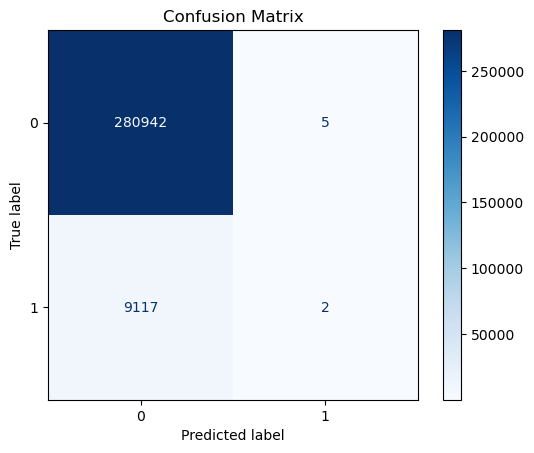

Confusion Matrix for the fold:
[[280943      4]
 [  9116      2]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98    280947
           1       0.33      0.00      0.00      9118

    accuracy                           0.97    290065
   macro avg       0.65      0.50      0.49    290065
weighted avg       0.95      0.97      0.95    290065


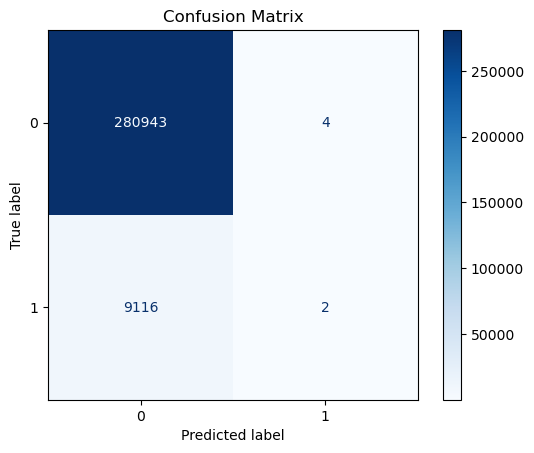

Confusion Matrix for the fold:
[[280942      4]
 [  9118      1]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98    280946
           1       0.20      0.00      0.00      9119

    accuracy                           0.97    290065
   macro avg       0.58      0.50      0.49    290065
weighted avg       0.94      0.97      0.95    290065


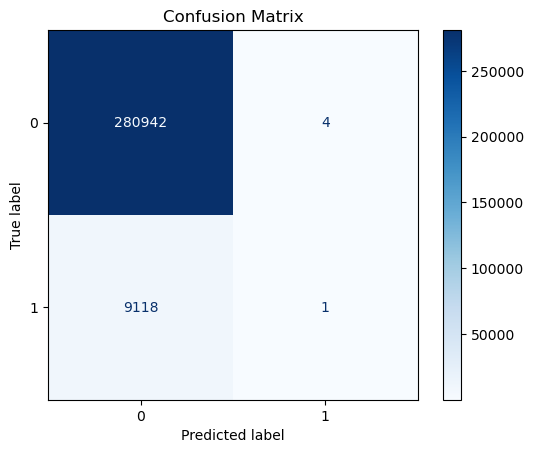

Confusion Matrix for the fold:
[[280945      1]
 [  9119      0]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98    280946
           1       0.00      0.00      0.00      9119

    accuracy                           0.97    290065
   macro avg       0.48      0.50      0.49    290065
weighted avg       0.94      0.97      0.95    290065


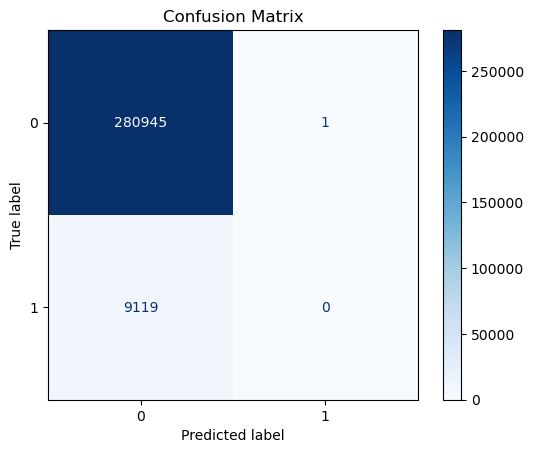

Confusion Matrix for the fold:
[[280946      0]
 [  9118      1]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98    280946
           1       1.00      0.00      0.00      9119

    accuracy                           0.97    290065
   macro avg       0.98      0.50      0.49    290065
weighted avg       0.97      0.97      0.95    290065


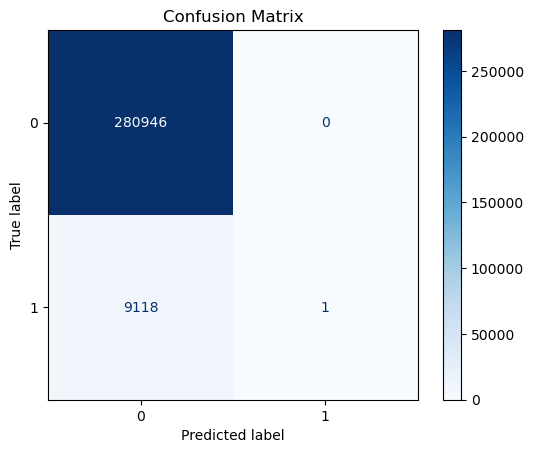

Final Test Set Results:
[[73933     0]
 [ 2397     3]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98     73933
           1       1.00      0.00      0.00      2400

    accuracy                           0.97     76333
   macro avg       0.98      0.50      0.49     76333
weighted avg       0.97      0.97      0.95     76333

Mean ROC AUC: 0.7590316351756249
Mean Accuracy: 0.9685574139920468


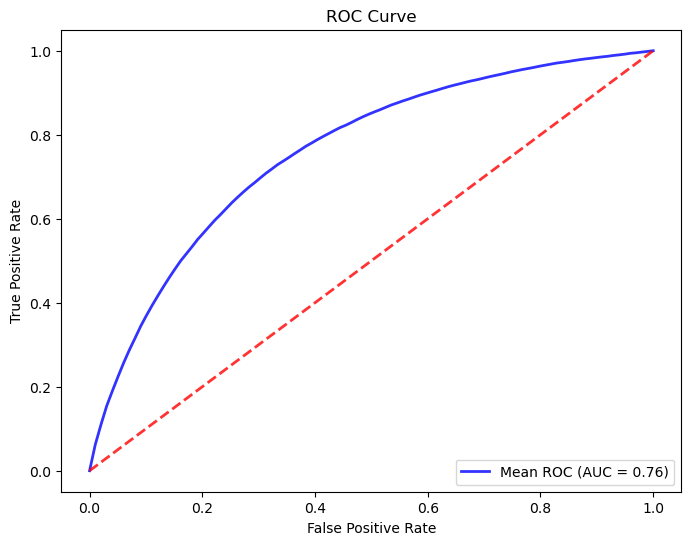

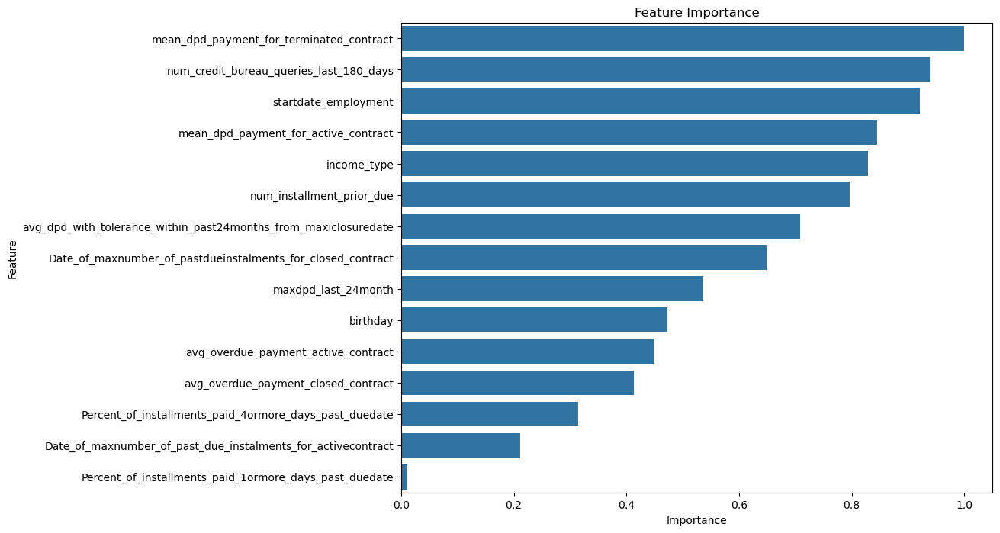

In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, roc_curve, accuracy_score, ConfusionMatrixDisplay, auc
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import RandomOverSampler
from imblearn.pipeline import Pipeline as ImbPipeline

# Configuration for the logistic regression
logistic_params = {
    "random_state": 42,
    "max_iter": 100,
    "solver": 'liblinear'
}

# Function to create a logistic regression model pipeline
def create_oversample_model(df, strategy='median', logistic_params=logistic_params):
    simple_imputer = SimpleImputer(strategy=strategy)
    num_pipeline = Pipeline([
        ('imputer', simple_imputer),
        ('scaler', StandardScaler())
    ])
    # Apply preprocessing to all columns in the dataframe
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', num_pipeline, df.columns),
        ])
    model = ImbPipeline(steps=[
        ('preprocessor', preprocessor),
        ('classifier', LogisticRegression(**logistic_params))
    ])
    return model

# Function to perform training using cross-validation and evaluate on a test set
def train_and_evaluate_model(df, target, test_size=0.05, random_state=42):
    X = df.drop(columns=[target])
    y = df[target]
    X = X.rename(columns={'avgdpdtolclosure24_3658938P_woe': 'avg_dpd_with_tolerance_within_past24months_from_maxiclosuredate'
,'days180_256L_woe': 'num_credit_bureau_queries_last_180_days'
,'mean_pmts_overdue_1140A_woe': 'avg_overdue_payment_active_contract'
, 'mean_numberofoverdueinstlmaxdat_148D_woe': 'Date_of_maxnumber_of_pastdueinstalments_for_closed_contract'
, 'mean_pmts_dpd_303P_woe': 'mean_dpd_payment_for_terminated_contract'
, 'mean_pmts_dpd_1073P_woe': 'mean_dpd_payment_for_active_contract'
,'max_incometype_1044T_cnt_woe': 'income_type'
,'max_empl_employedfrom_271D_woe': 'startdate_employment'
,'mean_numberofoverdueinstlmaxdat_641D_woe': 'Date_of_maxnumber_of_past_due_instalments_for_activecontract'
,'max_birth_259D_woe': 'birthday'
,'numinstpaidearly_338L_woe': 'num_installment_prior_due'
, 'maxdpdlast24m_143P_woe': 'maxdpd_last_24month'
,'mean_pmts_overdue_1152A_woe': 'avg_overdue_payment_closed_contract'
,'pctinstlsallpaidlate1d_3546856L_woe': 'Percent_of_installments_paid_1ormore_days_past_duedate'
,'pctinstlsallpaidlate4d_3546849L_woe': 'Percent_of_installments_paid_4ormore_days_past_duedate'})
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state, stratify=y)
    
    model = create_oversample_model(X_train)
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=random_state)

    cv_scores_auc = []
    cv_scores_accuracy = []
    mean_fpr = np.linspace(0, 1, 100)
    tprs = []
   
    for train_index, test_index in cv.split(X_train, y_train):
        X_fold_train, X_fold_test = X_train.iloc[train_index], X_train.iloc[test_index]
        y_fold_train, y_fold_test = y_train.iloc[train_index], y_train.iloc[test_index]
        
        model.fit(X_fold_train, y_fold_train)
        y_pred_proba = model.predict_proba(X_fold_test)[:, 1]
        y_pred = model.predict(X_fold_test)

        # Evaluate the model on the fold
        y_pred = model.predict(X_fold_test)
        print("Confusion Matrix for the fold:")
        print(confusion_matrix(y_fold_test, y_pred))
        print(classification_report(y_fold_test, y_pred))

        # CM heatmap
        y_pred_labels = (y_pred > 0.5).astype(int)
        cm = confusion_matrix(y_fold_test, y_pred_labels)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm)
        disp.plot(cmap=plt.cm.Blues)
        plt.title('Confusion Matrix')
        plt.show()

        fpr, tpr, _ = roc_curve(y_fold_test, y_pred_proba)
        tprs.append(np.interp(mean_fpr, fpr, tpr))
        tprs[-1][0] = 0.0
        roc_auc = roc_auc_score(y_fold_test, y_pred_proba)
        cv_scores_auc.append(roc_auc)

        accuracy = accuracy_score(y_fold_test, y_pred)
        cv_scores_accuracy.append(accuracy)

    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    mean_accuracy = np.mean(cv_scores_accuracy)

    # Final test on the holdout test set
    y_pred_test = model.predict(X_test)
    print("Final Test Set Results:")
    print(confusion_matrix(y_test, y_pred_test))
    print(classification_report(y_test, y_pred_test))

    print(f"Mean ROC AUC: {mean_auc}")
    print(f"Mean Accuracy: {mean_accuracy}")

    # Plot ROC Curve
    plt.figure(figsize=(8, 6))
    plt.plot(mean_fpr, mean_tpr, color='blue', label=f'Mean ROC (AUC = {mean_auc:.2f})', lw=2, alpha=0.8)
    plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='red', alpha=0.8)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()
    
    # Visualize variable importance
    coefficients = model.named_steps['classifier'].coef_[0]
    df_list = [col for col in X.columns]

    feature_importance = abs(coefficients)
    max_importance = np.max(feature_importance)
    normalized_importance = feature_importance / max_importance
    features_df = pd.DataFrame({'Feature': df_list, 'Importance': normalized_importance})
    features_df = features_df.sort_values(by='Importance', ascending=False)
    
    plt.figure(figsize=(10, 8))
    sns.barplot(x='Importance', y='Feature', data=features_df)
    plt.title('Feature Importance')
    plt.show()

    return model

# Example usage:
lr_model = train_and_evaluate_model(df_smote_wOsex_walter, 'target')

Logistic Regression-No Oversampling no sex data and without alternative data

Confusion Matrix for the fold:
[[280947      0]
 [  9119      0]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98    280947
           1       0.00      0.00      0.00      9119

    accuracy                           0.97    290066
   macro avg       0.48      0.50      0.49    290066
weighted avg       0.94      0.97      0.95    290066


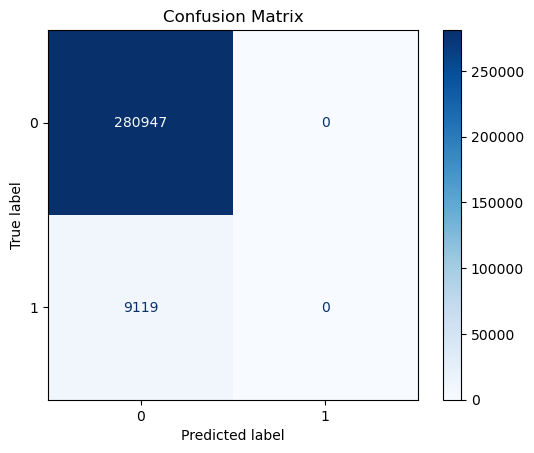

Confusion Matrix for the fold:
[[280947      0]
 [  9118      0]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98    280947
           1       0.00      0.00      0.00      9118

    accuracy                           0.97    290065
   macro avg       0.48      0.50      0.49    290065
weighted avg       0.94      0.97      0.95    290065


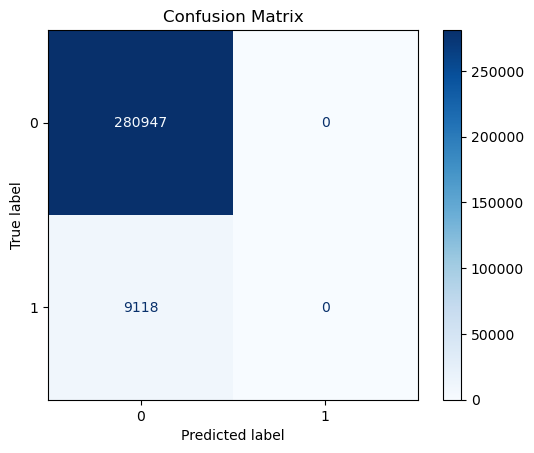

Confusion Matrix for the fold:
[[280946      0]
 [  9119      0]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98    280946
           1       0.00      0.00      0.00      9119

    accuracy                           0.97    290065
   macro avg       0.48      0.50      0.49    290065
weighted avg       0.94      0.97      0.95    290065


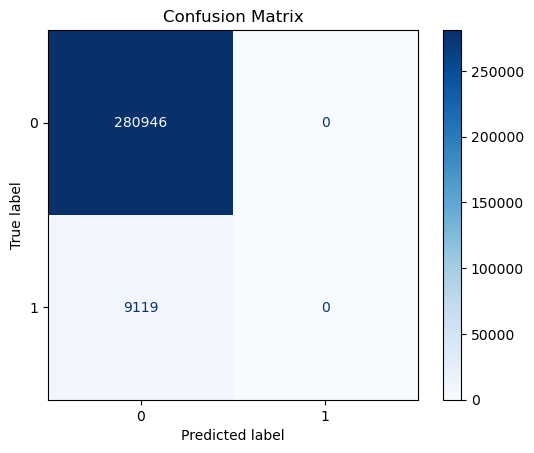

Confusion Matrix for the fold:
[[280946      0]
 [  9119      0]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98    280946
           1       0.00      0.00      0.00      9119

    accuracy                           0.97    290065
   macro avg       0.48      0.50      0.49    290065
weighted avg       0.94      0.97      0.95    290065


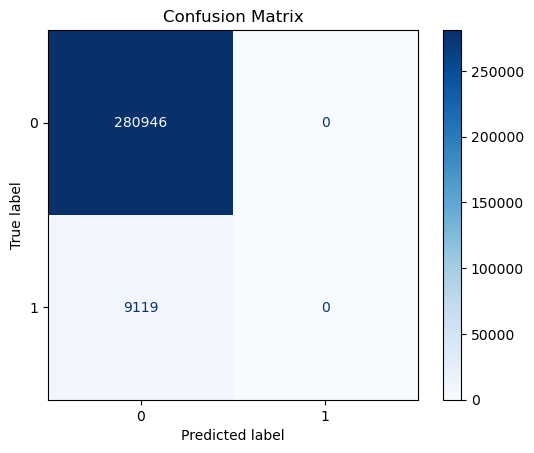

Confusion Matrix for the fold:
[[280946      0]
 [  9119      0]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98    280946
           1       0.00      0.00      0.00      9119

    accuracy                           0.97    290065
   macro avg       0.48      0.50      0.49    290065
weighted avg       0.94      0.97      0.95    290065


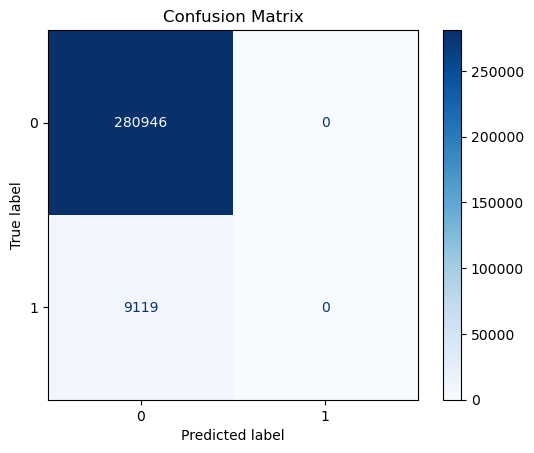

Final Test Set Results:
[[73933     0]
 [ 2400     0]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98     73933
           1       0.00      0.00      0.00      2400

    accuracy                           0.97     76333
   macro avg       0.48      0.50      0.49     76333
weighted avg       0.94      0.97      0.95     76333

Mean ROC AUC: 0.7526952565030516
Mean Accuracy: 0.9685629299899489


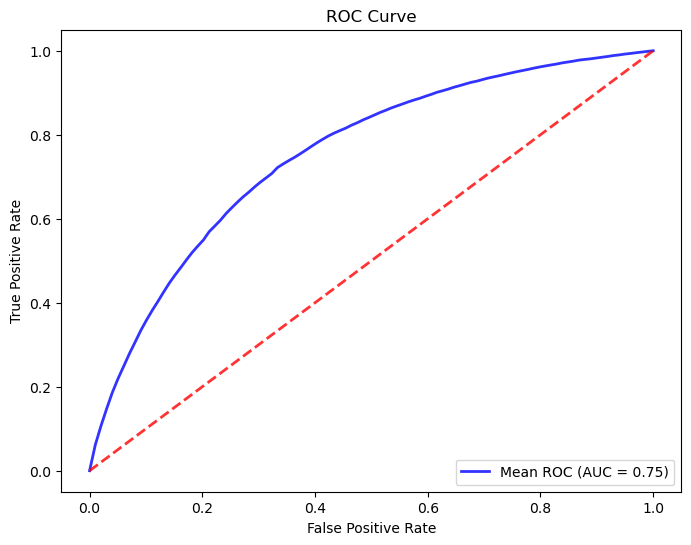

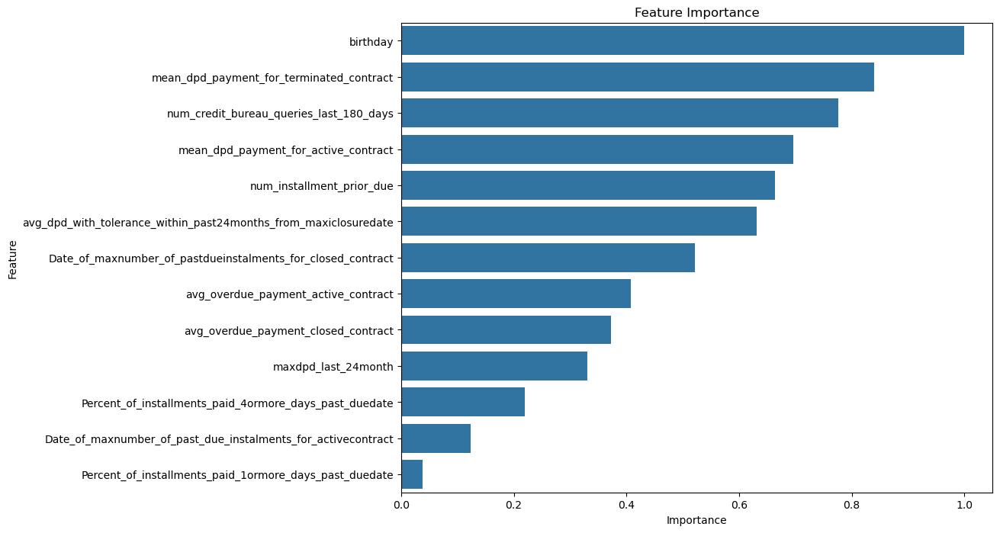

In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, roc_curve, accuracy_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import RandomOverSampler
from imblearn.pipeline import Pipeline as ImbPipeline

# Configuration for the logistic regression
logistic_params = {
    "random_state": 42,
    "max_iter": 100,
    "solver": 'liblinear'
}

# Function to create a logistic regression model pipeline
def create_oversample_model(df, strategy='median', logistic_params=logistic_params):
    simple_imputer = SimpleImputer(strategy=strategy)
    num_pipeline = Pipeline([
        ('imputer', simple_imputer),
        ('scaler', StandardScaler())
    ])
    # Apply preprocessing to all columns in the dataframe
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', num_pipeline, df.columns),
        ])
    model = ImbPipeline(steps=[
        ('preprocessor', preprocessor),
        ('classifier', LogisticRegression(**logistic_params))
    ])
    return model

# Function to perform training using cross-validation and evaluate on a test set
def train_and_evaluate_model(df, target, test_size=0.05, random_state=42):
    X = df.drop(columns=[target])
    y = df[target]
    X = X.rename(columns={'avgdpdtolclosure24_3658938P_woe': 'avg_dpd_with_tolerance_within_past24months_from_maxiclosuredate'
,'days180_256L_woe': 'num_credit_bureau_queries_last_180_days'
,'mean_pmts_overdue_1140A_woe': 'avg_overdue_payment_active_contract'
, 'mean_numberofoverdueinstlmaxdat_148D_woe': 'Date_of_maxnumber_of_pastdueinstalments_for_closed_contract'
, 'mean_pmts_dpd_303P_woe': 'mean_dpd_payment_for_terminated_contract'
, 'mean_pmts_dpd_1073P_woe': 'mean_dpd_payment_for_active_contract'
,'max_incometype_1044T_cnt_woe': 'income_type'
,'max_empl_employedfrom_271D_woe': 'startdate_employment'
,'mean_numberofoverdueinstlmaxdat_641D_woe': 'Date_of_maxnumber_of_past_due_instalments_for_activecontract'
,'max_birth_259D_woe': 'birthday'
,'numinstpaidearly_338L_woe': 'num_installment_prior_due'
, 'maxdpdlast24m_143P_woe': 'maxdpd_last_24month'
,'mean_pmts_overdue_1152A_woe': 'avg_overdue_payment_closed_contract'
,'pctinstlsallpaidlate1d_3546856L_woe': 'Percent_of_installments_paid_1ormore_days_past_duedate'
,'pctinstlsallpaidlate4d_3546849L_woe': 'Percent_of_installments_paid_4ormore_days_past_duedate'})
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state, stratify=y)
    
    model = create_oversample_model(X_train)
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=random_state)

    cv_scores_auc = []
    cv_scores_accuracy = []
    mean_fpr = np.linspace(0, 1, 100)
    tprs = []

    for train_index, test_index in cv.split(X_train, y_train):
        X_fold_train, X_fold_test = X_train.iloc[train_index], X_train.iloc[test_index]
        y_fold_train, y_fold_test = y_train.iloc[train_index], y_train.iloc[test_index]
        
        model.fit(X_fold_train, y_fold_train)
        y_pred_proba = model.predict_proba(X_fold_test)[:, 1]
        y_pred = model.predict(X_fold_test)

        # Evaluate the model on the fold
        y_pred = model.predict(X_fold_test)
        print("Confusion Matrix for the fold:")
        print(confusion_matrix(y_fold_test, y_pred))
        print(classification_report(y_fold_test, y_pred))

        # CM heatmap
        y_pred_labels = (y_pred > 0.5).astype(int)
        cm = confusion_matrix(y_fold_test, y_pred_labels)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm)
        disp.plot(cmap=plt.cm.Blues)
        plt.title('Confusion Matrix')
        plt.show()

        fpr, tpr, _ = roc_curve(y_fold_test, y_pred_proba)
        tprs.append(np.interp(mean_fpr, fpr, tpr))
        tprs[-1][0] = 0.0
        roc_auc = roc_auc_score(y_fold_test, y_pred_proba)
        cv_scores_auc.append(roc_auc)

        accuracy = accuracy_score(y_fold_test, y_pred)
        cv_scores_accuracy.append(accuracy)

    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    mean_accuracy = np.mean(cv_scores_accuracy)

    # Final test on the holdout test set
    y_pred_test = model.predict(X_test)
    print("Final Test Set Results:")
    print(confusion_matrix(y_test, y_pred_test))
    print(classification_report(y_test, y_pred_test))

    print(f"Mean ROC AUC: {mean_auc}")
    print(f"Mean Accuracy: {mean_accuracy}")

    # Plot ROC Curve
    plt.figure(figsize=(8, 6))
    plt.plot(mean_fpr, mean_tpr, color='blue', label=f'Mean ROC (AUC = {mean_auc:.2f})', lw=2, alpha=0.8)
    plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='red', alpha=0.8)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()
    
    # Visualize variable importance
    coefficients = model.named_steps['classifier'].coef_[0]
    df_list = [col for col in X.columns]

    feature_importance = abs(coefficients)
    max_importance = np.max(feature_importance)
    normalized_importance = feature_importance / max_importance
    features_df = pd.DataFrame({'Feature': df_list, 'Importance': normalized_importance})
    features_df = features_df.sort_values(by='Importance', ascending=False)
    
    plt.figure(figsize=(10, 8))
    sns.barplot(x='Importance', y='Feature', data=features_df)
    plt.title('Feature Importance')
    plt.show()

    return model

# Example usage:
lr_model = train_and_evaluate_model(df_smote_wOsex_wOalter, 'target')

Logistic Regression-Oversampling no sex data and with alternative data

Confusion Matrix for the fold:
[[197240  83707]
 [  2810   6309]]
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    280947
           1       0.07      0.69      0.13      9119

    accuracy                           0.70    290066
   macro avg       0.53      0.70      0.47    290066
weighted avg       0.96      0.70      0.80    290066


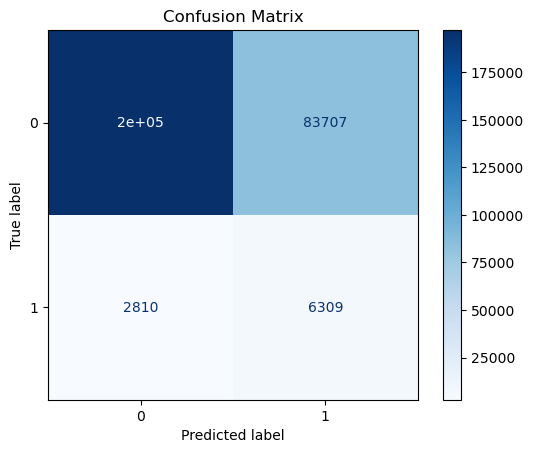

Confusion Matrix for the fold:
[[197348  83599]
 [  2758   6360]]
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    280947
           1       0.07      0.70      0.13      9118

    accuracy                           0.70    290065
   macro avg       0.53      0.70      0.47    290065
weighted avg       0.96      0.70      0.80    290065


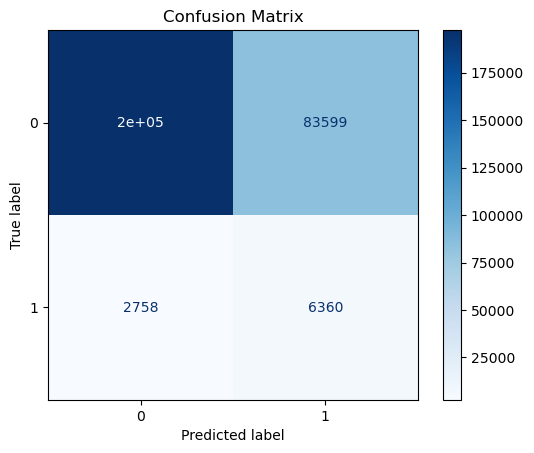

Confusion Matrix for the fold:
[[197480  83466]
 [  2829   6290]]
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    280946
           1       0.07      0.69      0.13      9119

    accuracy                           0.70    290065
   macro avg       0.53      0.70      0.47    290065
weighted avg       0.96      0.70      0.80    290065


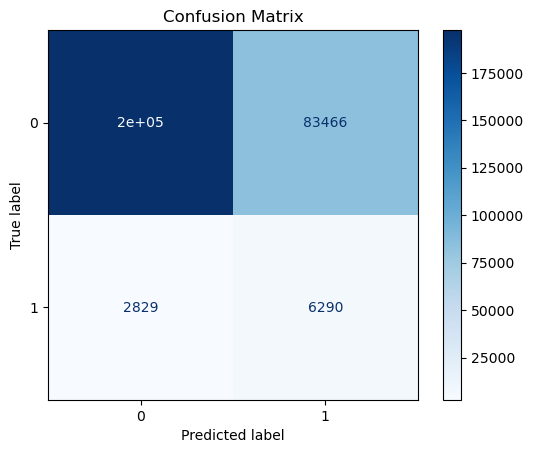

Confusion Matrix for the fold:
[[196810  84136]
 [  2783   6336]]
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    280946
           1       0.07      0.69      0.13      9119

    accuracy                           0.70    290065
   macro avg       0.53      0.70      0.47    290065
weighted avg       0.96      0.70      0.80    290065


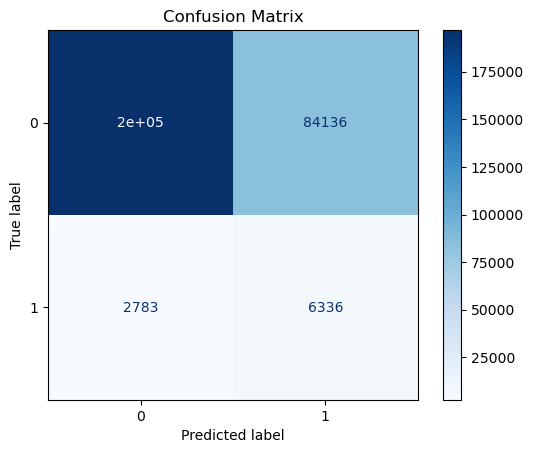

Confusion Matrix for the fold:
[[197369  83577]
 [  2822   6297]]
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    280946
           1       0.07      0.69      0.13      9119

    accuracy                           0.70    290065
   macro avg       0.53      0.70      0.47    290065
weighted avg       0.96      0.70      0.80    290065


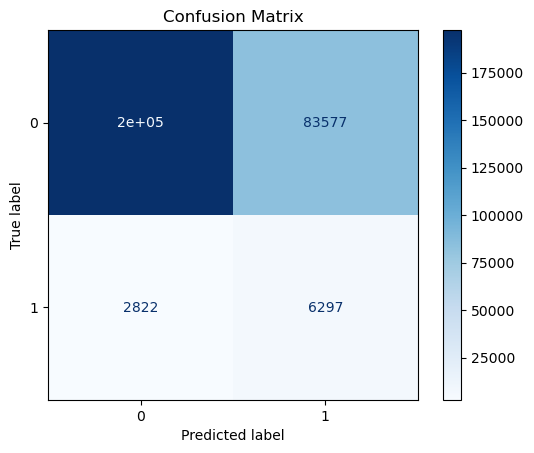

Final Test Set Results:
[[51822 22111]
 [  762  1638]]
              precision    recall  f1-score   support

           0       0.99      0.70      0.82     73933
           1       0.07      0.68      0.13      2400

    accuracy                           0.70     76333
   macro avg       0.53      0.69      0.47     76333
weighted avg       0.96      0.70      0.80     76333

Mean ROC AUC: 0.759814158737665
Mean Accuracy: 0.7018001470474557


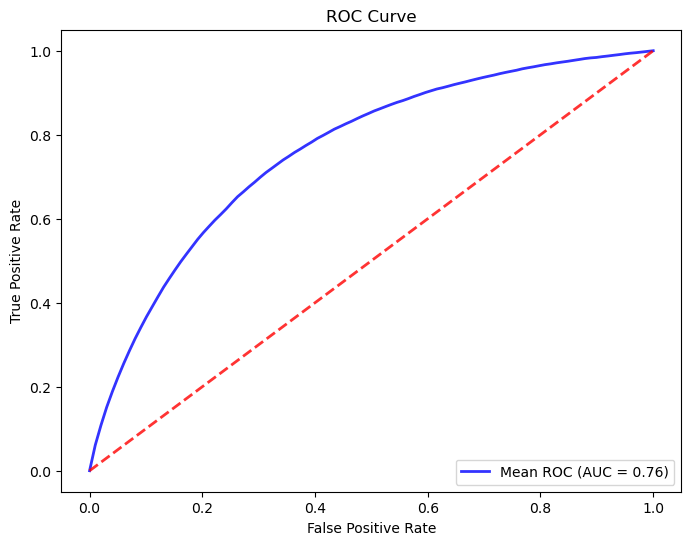

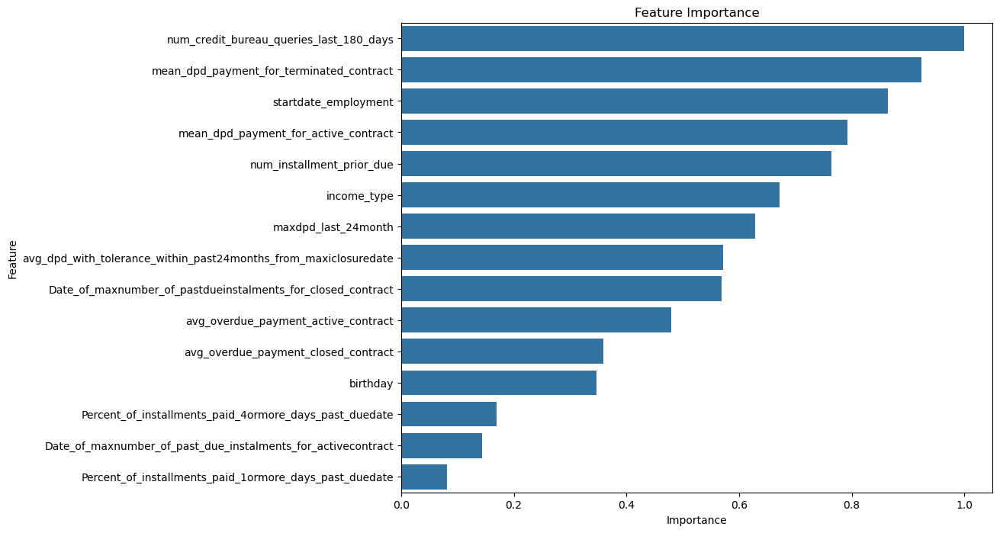

In [63]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, roc_curve, accuracy_score, auc
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import RandomOverSampler
from imblearn.pipeline import Pipeline as ImbPipeline

# Configuration for the logistic regression
logistic_params = {
    "random_state": 42,
    "max_iter": 100,
    "solver": 'liblinear'
}

# Function to create a logistic regression model pipeline
def create_oversample_model(df, strategy='median', logistic_params=logistic_params):
    simple_imputer = SimpleImputer(strategy=strategy)
    num_pipeline = Pipeline([
        ('imputer', simple_imputer),
        ('scaler', StandardScaler())
    ])
    # Apply preprocessing to all columns in the dataframe
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', num_pipeline, df.columns),
        ])
    model = ImbPipeline(steps=[
        ('preprocessor', preprocessor),
        ('oversample', RandomOverSampler(random_state=42)),
        ('classifier', LogisticRegression(**logistic_params))
    ])
    return model

# Function to perform training using cross-validation and evaluate on a test set
def train_and_evaluate_model(df, target, test_size=0.05, random_state=42):
    X = df.drop(columns=[target])
    y = df[target]

    X = X.rename(columns={'avgdpdtolclosure24_3658938P_woe': 'avg_dpd_with_tolerance_within_past24months_from_maxiclosuredate'
,'days180_256L_woe': 'num_credit_bureau_queries_last_180_days'
,'mean_pmts_overdue_1140A_woe': 'avg_overdue_payment_active_contract'
, 'mean_numberofoverdueinstlmaxdat_148D_woe': 'Date_of_maxnumber_of_pastdueinstalments_for_closed_contract'
, 'mean_pmts_dpd_303P_woe': 'mean_dpd_payment_for_terminated_contract'
, 'mean_pmts_dpd_1073P_woe': 'mean_dpd_payment_for_active_contract'
,'max_incometype_1044T_cnt_woe': 'income_type'
,'max_empl_employedfrom_271D_woe': 'startdate_employment'
,'mean_numberofoverdueinstlmaxdat_641D_woe': 'Date_of_maxnumber_of_past_due_instalments_for_activecontract'
,'max_birth_259D_woe': 'birthday'
,'numinstpaidearly_338L_woe': 'num_installment_prior_due'
, 'maxdpdlast24m_143P_woe': 'maxdpd_last_24month'
,'mean_pmts_overdue_1152A_woe': 'avg_overdue_payment_closed_contract'
,'pctinstlsallpaidlate1d_3546856L_woe': 'Percent_of_installments_paid_1ormore_days_past_duedate'
,'pctinstlsallpaidlate4d_3546849L_woe': 'Percent_of_installments_paid_4ormore_days_past_duedate'})
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state, stratify=y)
    
    model = create_oversample_model(X_train)
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=random_state)

    cv_scores_auc = []
    cv_scores_accuracy = []
    mean_fpr = np.linspace(0, 1, 100)
    tprs = []

    for train_index, test_index in cv.split(X_train, y_train):
        X_fold_train, X_fold_test = X_train.iloc[train_index], X_train.iloc[test_index]
        y_fold_train, y_fold_test = y_train.iloc[train_index], y_train.iloc[test_index]
        
        model.fit(X_fold_train, y_fold_train)
        y_pred_proba = model.predict_proba(X_fold_test)[:, 1]
        y_pred = model.predict(X_fold_test)

        # Evaluate the model on the fold
        y_pred = model.predict(X_fold_test)
        print("Confusion Matrix for the fold:")
        print(confusion_matrix(y_fold_test, y_pred))
        print(classification_report(y_fold_test, y_pred))

        # CM heatmap
        y_pred_labels = (y_pred > 0.5).astype(int)
        cm = confusion_matrix(y_fold_test, y_pred_labels)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm)
        disp.plot(cmap=plt.cm.Blues)
        plt.title('Confusion Matrix')
        plt.show()

        fpr, tpr, _ = roc_curve(y_fold_test, y_pred_proba)
        tprs.append(np.interp(mean_fpr, fpr, tpr))
        tprs[-1][0] = 0.0
        roc_auc = roc_auc_score(y_fold_test, y_pred_proba)
        cv_scores_auc.append(roc_auc)

        accuracy = accuracy_score(y_fold_test, y_pred)
        cv_scores_accuracy.append(accuracy)

    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    mean_accuracy = np.mean(cv_scores_accuracy)

    # Final test on the holdout test set
    y_pred_test = model.predict(X_test)
    print("Final Test Set Results:")
    print(confusion_matrix(y_test, y_pred_test))
    print(classification_report(y_test, y_pred_test))

    print(f"Mean ROC AUC: {mean_auc}")
    print(f"Mean Accuracy: {mean_accuracy}")

    # Plot ROC Curve
    plt.figure(figsize=(8, 6))
    plt.plot(mean_fpr, mean_tpr, color='blue', label=f'Mean ROC (AUC = {mean_auc:.2f})', lw=2, alpha=0.8)
    plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='red', alpha=0.8)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()
    
    # Visualize variable importance
    coefficients = model.named_steps['classifier'].coef_[0]
    df_list = [col for col in X.columns]

    feature_importance = abs(coefficients)
    max_importance = np.max(feature_importance)
    normalized_importance = feature_importance / max_importance
    features_df = pd.DataFrame({'Feature': df_list, 'Importance': normalized_importance})
    features_df = features_df.sort_values(by='Importance', ascending=False)
    
    plt.figure(figsize=(10, 8))
    sns.barplot(x='Importance', y='Feature', data=features_df)
    plt.title('Feature Importance')
    plt.show()

    return model

# Example usage:
lr_model = train_and_evaluate_model(df_smote_wOsex_walter, 'target')

Logistic Regression-Oversampling no sex data and without alternative data

Confusion Matrix for the fold:
[[199756  81191]
 [  2956   6163]]
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    280947
           1       0.07      0.68      0.13      9119

    accuracy                           0.71    290066
   macro avg       0.53      0.69      0.48    290066
weighted avg       0.96      0.71      0.80    290066


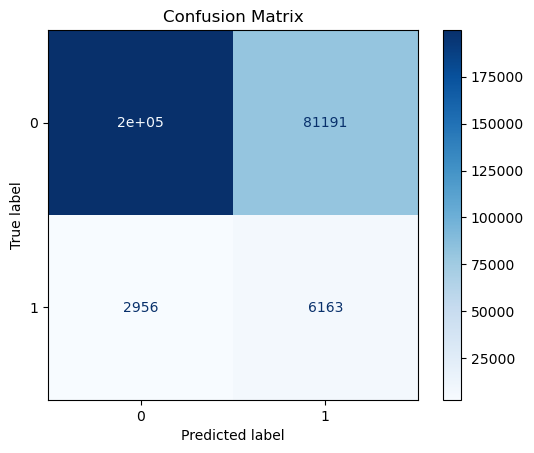

Confusion Matrix for the fold:
[[199408  81539]
 [  2932   6186]]
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    280947
           1       0.07      0.68      0.13      9118

    accuracy                           0.71    290065
   macro avg       0.53      0.69      0.48    290065
weighted avg       0.96      0.71      0.80    290065


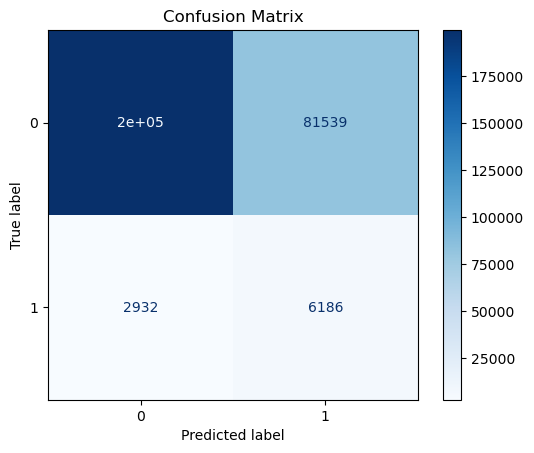

Confusion Matrix for the fold:
[[199578  81368]
 [  3028   6091]]
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    280946
           1       0.07      0.67      0.13      9119

    accuracy                           0.71    290065
   macro avg       0.53      0.69      0.48    290065
weighted avg       0.96      0.71      0.80    290065


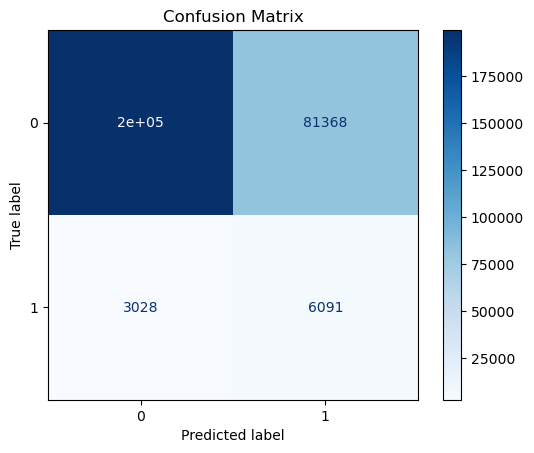

Confusion Matrix for the fold:
[[199047  81899]
 [  2978   6141]]
              precision    recall  f1-score   support

           0       0.99      0.71      0.82    280946
           1       0.07      0.67      0.13      9119

    accuracy                           0.71    290065
   macro avg       0.53      0.69      0.48    290065
weighted avg       0.96      0.71      0.80    290065


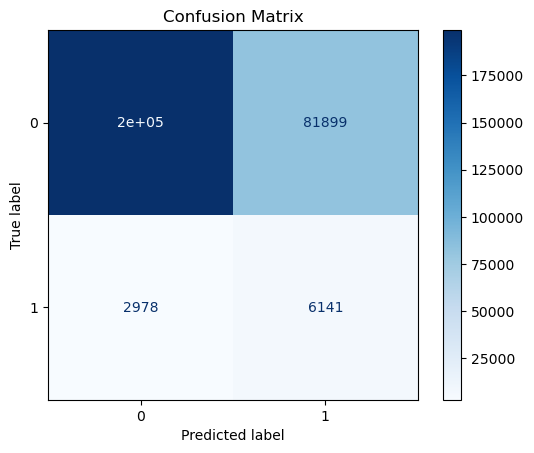

Confusion Matrix for the fold:
[[199524  81422]
 [  2967   6152]]
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    280946
           1       0.07      0.67      0.13      9119

    accuracy                           0.71    290065
   macro avg       0.53      0.69      0.48    290065
weighted avg       0.96      0.71      0.80    290065


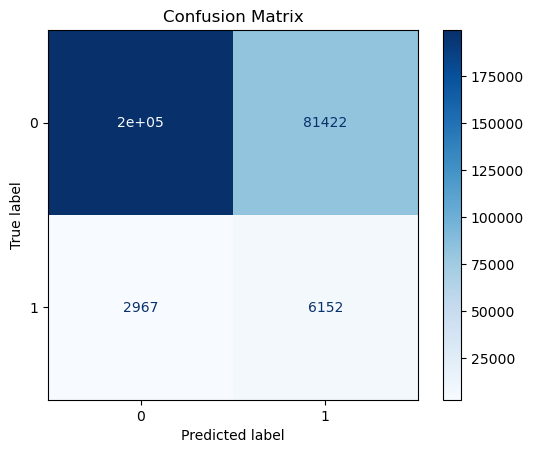

Final Test Set Results:
[[52384 21549]
 [  787  1613]]
              precision    recall  f1-score   support

           0       0.99      0.71      0.82     73933
           1       0.07      0.67      0.13      2400

    accuracy                           0.71     76333
   macro avg       0.53      0.69      0.48     76333
weighted avg       0.96      0.71      0.80     76333

Mean ROC AUC: 0.7533167241131871
Mean Accuracy: 0.7088378743357848


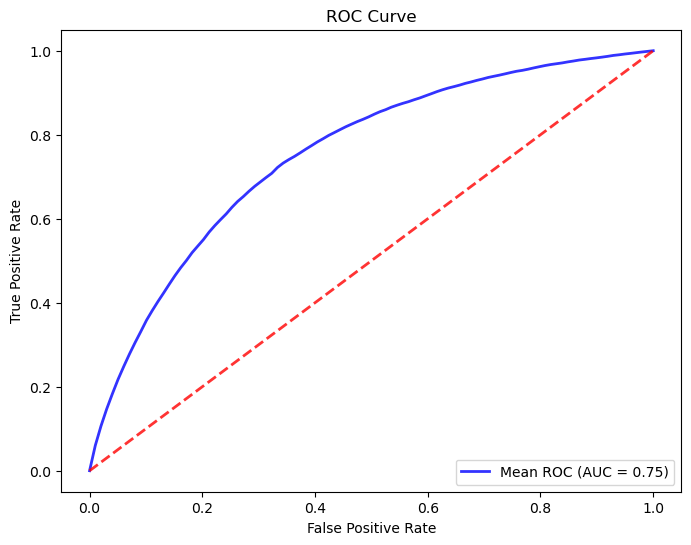

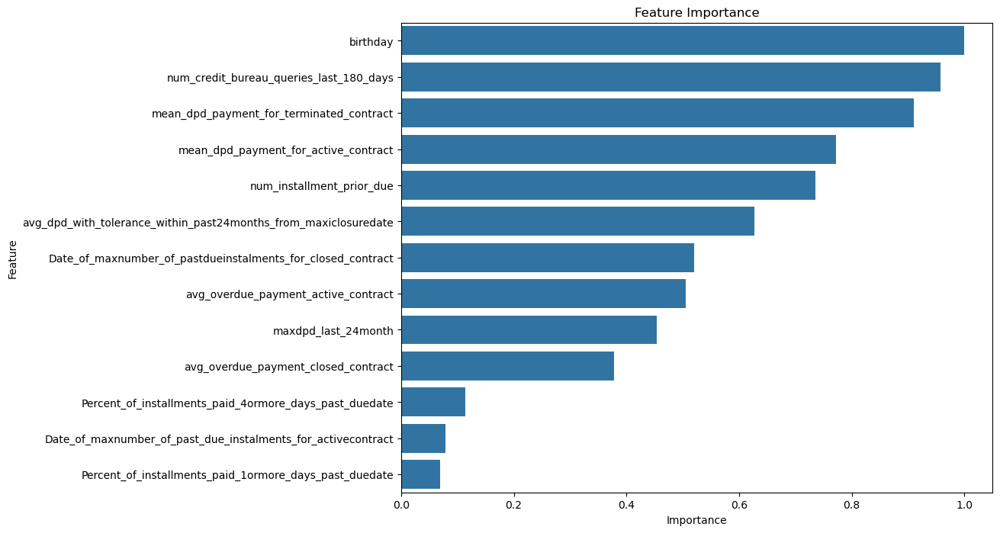

In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, roc_curve, accuracy_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import RandomOverSampler
from imblearn.pipeline import Pipeline as ImbPipeline

# Configuration for the logistic regression
logistic_params = {
    "random_state": 42,
    "max_iter": 100,
    "solver": 'liblinear'
}

# Function to create a logistic regression model pipeline
def create_oversample_model(df, strategy='median', logistic_params=logistic_params):
    simple_imputer = SimpleImputer(strategy=strategy)
    num_pipeline = Pipeline([
        ('imputer', simple_imputer),
        ('scaler', StandardScaler())
    ])
    # Apply preprocessing to all columns in the dataframe
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', num_pipeline, df.columns),
        ])
    model = ImbPipeline(steps=[
        ('preprocessor', preprocessor),
        ('oversample', RandomOverSampler(random_state=42)),
        ('classifier', LogisticRegression(**logistic_params))
    ])
    return model

# Function to perform training using cross-validation and evaluate on a test set
def train_and_evaluate_model(df, target, test_size=0.05, random_state=42):
    X = df.drop(columns=[target])
    y = df[target]
    X = X.rename(columns={'avgdpdtolclosure24_3658938P_woe': 'avg_dpd_with_tolerance_within_past24months_from_maxiclosuredate'
,'days180_256L_woe': 'num_credit_bureau_queries_last_180_days'
,'mean_pmts_overdue_1140A_woe': 'avg_overdue_payment_active_contract'
, 'mean_numberofoverdueinstlmaxdat_148D_woe': 'Date_of_maxnumber_of_pastdueinstalments_for_closed_contract'
, 'mean_pmts_dpd_303P_woe': 'mean_dpd_payment_for_terminated_contract'
, 'mean_pmts_dpd_1073P_woe': 'mean_dpd_payment_for_active_contract'
,'max_incometype_1044T_cnt_woe': 'income_type'
,'max_empl_employedfrom_271D_woe': 'startdate_employment'
,'mean_numberofoverdueinstlmaxdat_641D_woe': 'Date_of_maxnumber_of_past_due_instalments_for_activecontract'
,'max_birth_259D_woe': 'birthday'
,'numinstpaidearly_338L_woe': 'num_installment_prior_due'
, 'maxdpdlast24m_143P_woe': 'maxdpd_last_24month'
,'mean_pmts_overdue_1152A_woe': 'avg_overdue_payment_closed_contract'
,'pctinstlsallpaidlate1d_3546856L_woe': 'Percent_of_installments_paid_1ormore_days_past_duedate'
,'pctinstlsallpaidlate4d_3546849L_woe': 'Percent_of_installments_paid_4ormore_days_past_duedate'})
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state, stratify=y)
    
    model = create_oversample_model(X_train)
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=random_state)

    cv_scores_auc = []
    cv_scores_accuracy = []
    mean_fpr = np.linspace(0, 1, 100)
    tprs = []

    for train_index, test_index in cv.split(X_train, y_train):
        X_fold_train, X_fold_test = X_train.iloc[train_index], X_train.iloc[test_index]
        y_fold_train, y_fold_test = y_train.iloc[train_index], y_train.iloc[test_index]
        
        model.fit(X_fold_train, y_fold_train)
        y_pred_proba = model.predict_proba(X_fold_test)[:, 1]
        y_pred = model.predict(X_fold_test)

        # Evaluate the model on the fold
        y_pred = model.predict(X_fold_test)
        print("Confusion Matrix for the fold:")
        print(confusion_matrix(y_fold_test, y_pred))
        print(classification_report(y_fold_test, y_pred))

        # CM heatmap
        y_pred_labels = (y_pred > 0.5).astype(int)
        cm = confusion_matrix(y_fold_test, y_pred_labels)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm)
        disp.plot(cmap=plt.cm.Blues)
        plt.title('Confusion Matrix')
        plt.show()

        fpr, tpr, _ = roc_curve(y_fold_test, y_pred_proba)
        tprs.append(np.interp(mean_fpr, fpr, tpr))
        tprs[-1][0] = 0.0
        roc_auc = roc_auc_score(y_fold_test, y_pred_proba)
        cv_scores_auc.append(roc_auc)

        accuracy = accuracy_score(y_fold_test, y_pred)
        cv_scores_accuracy.append(accuracy)

    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    mean_accuracy = np.mean(cv_scores_accuracy)

    # Final test on the holdout test set
    y_pred_test = model.predict(X_test)
    print("Final Test Set Results:")
    print(confusion_matrix(y_test, y_pred_test))
    print(classification_report(y_test, y_pred_test))

    print(f"Mean ROC AUC: {mean_auc}")
    print(f"Mean Accuracy: {mean_accuracy}")

    # Plot ROC Curve
    plt.figure(figsize=(8, 6))
    plt.plot(mean_fpr, mean_tpr, color='blue', label=f'Mean ROC (AUC = {mean_auc:.2f})', lw=2, alpha=0.8)
    plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='red', alpha=0.8)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()
    
    # Visualize variable importance
    coefficients = model.named_steps['classifier'].coef_[0]
    df_list = [col for col in X.columns]

    feature_importance = abs(coefficients)
    max_importance = np.max(feature_importance)
    normalized_importance = feature_importance / max_importance
    features_df = pd.DataFrame({'Feature': df_list, 'Importance': normalized_importance})
    features_df = features_df.sort_values(by='Importance', ascending=False)
    
    plt.figure(figsize=(10, 8))
    sns.barplot(x='Importance', y='Feature', data=features_df)
    plt.title('Feature Importance')
    plt.show()

    return model

# Example usage:
lr_model = train_and_evaluate_model(df_smote_wOsex_wOalter, 'target')

Random Forest -Lingxiao 4.22 Version

Random Forest - Oversampling with no sex data and with alternative data

Confusion Matrix for the fold:
[[196556  84391]
 [  2631   6488]]
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    280947
           1       0.07      0.71      0.13      9119

    accuracy                           0.70    290066
   macro avg       0.53      0.71      0.47    290066
weighted avg       0.96      0.70      0.80    290066


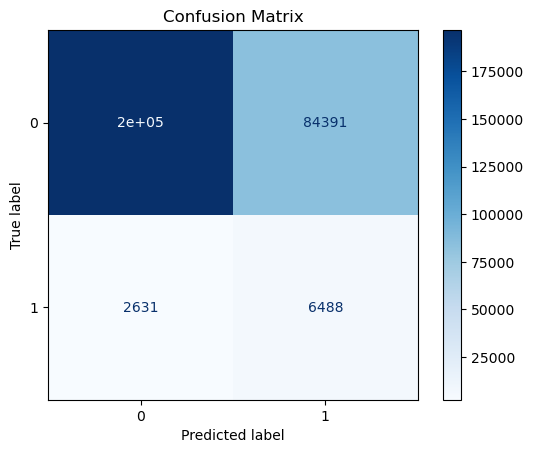

Confusion Matrix for the fold:
[[196435  84512]
 [  2547   6571]]
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    280947
           1       0.07      0.72      0.13      9118

    accuracy                           0.70    290065
   macro avg       0.53      0.71      0.47    290065
weighted avg       0.96      0.70      0.80    290065


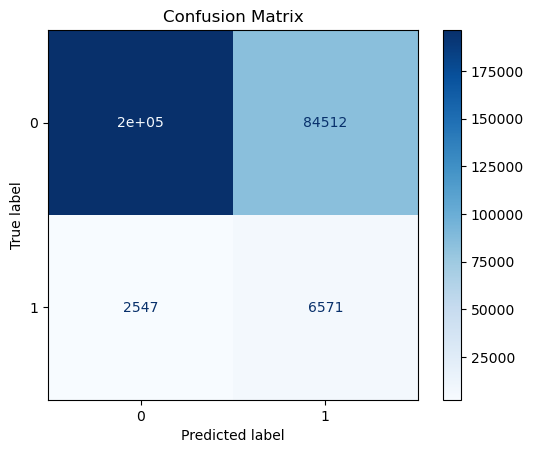

Confusion Matrix for the fold:
[[198103  82843]
 [  2713   6406]]
              precision    recall  f1-score   support

           0       0.99      0.71      0.82    280946
           1       0.07      0.70      0.13      9119

    accuracy                           0.71    290065
   macro avg       0.53      0.70      0.48    290065
weighted avg       0.96      0.71      0.80    290065


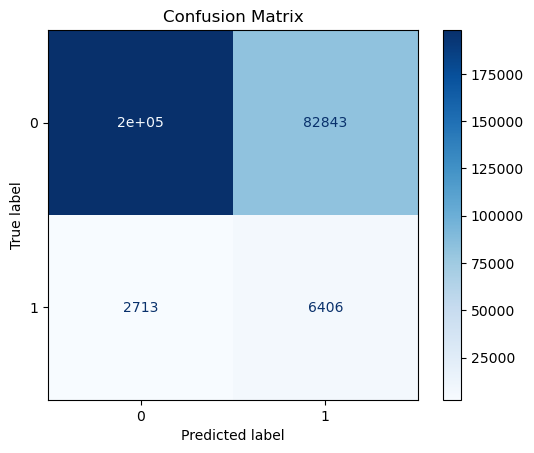

Confusion Matrix for the fold:
[[196997  83949]
 [  2654   6465]]
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    280946
           1       0.07      0.71      0.13      9119

    accuracy                           0.70    290065
   macro avg       0.53      0.71      0.47    290065
weighted avg       0.96      0.70      0.80    290065


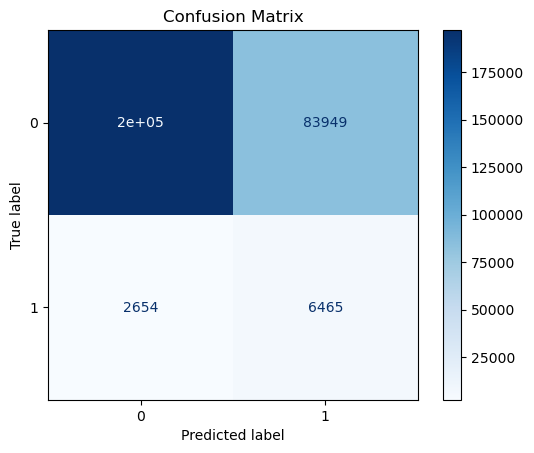

Confusion Matrix for the fold:
[[196969  83977]
 [  2659   6460]]
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    280946
           1       0.07      0.71      0.13      9119

    accuracy                           0.70    290065
   macro avg       0.53      0.70      0.47    290065
weighted avg       0.96      0.70      0.80    290065


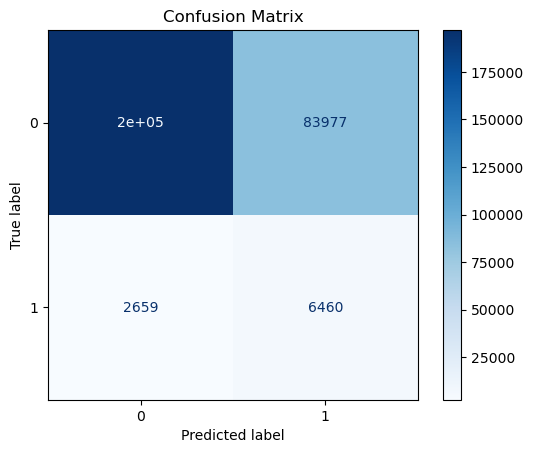

Final Test Set Results:
[[51825 22108]
 [  702  1698]]
              precision    recall  f1-score   support

           0       0.99      0.70      0.82     73933
           1       0.07      0.71      0.13      2400

    accuracy                           0.70     76333
   macro avg       0.53      0.70      0.47     76333
weighted avg       0.96      0.70      0.80     76333

Mean ROC AUC: 0.7712392667032655
Mean Accuracy: 0.7015319325031178


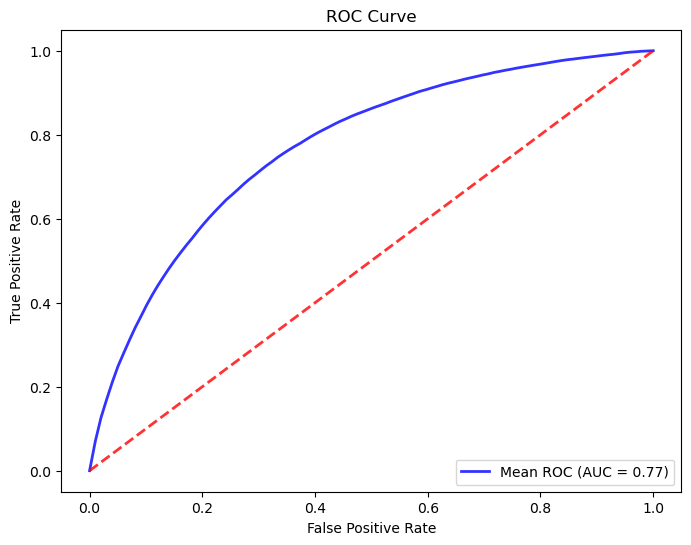

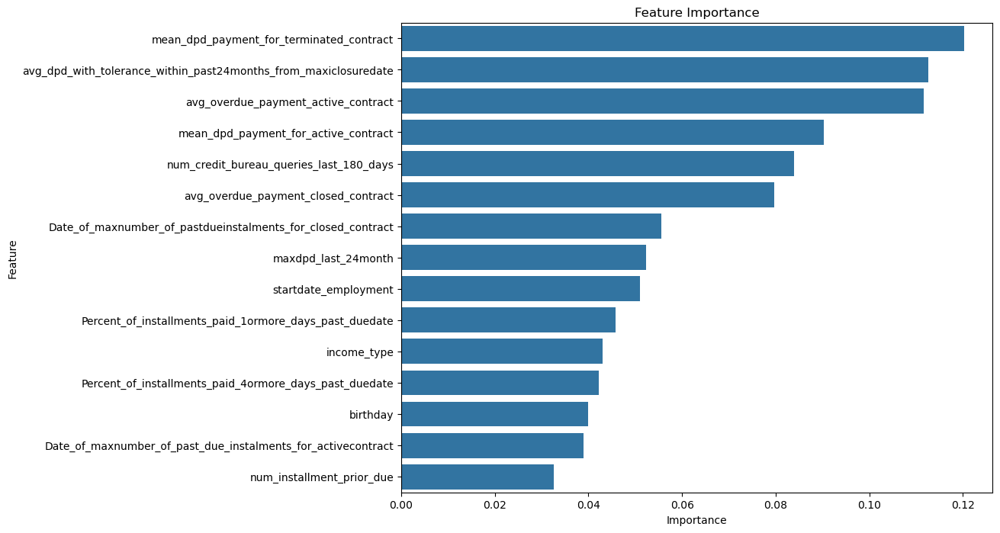

In [32]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, roc_curve, accuracy_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import RandomOverSampler
from imblearn.pipeline import Pipeline as ImbPipeline

# Configuration for the logistic regression
rf_params = {
        "n_estimators": 500,
        "max_depth": 10,
        "min_samples_split": 2,
        "min_samples_leaf": 1,
        "bootstrap": True,
        "random_state": 42,
        "n_jobs": -1
    }

# Function to create a logistic regression model pipeline
def create_oversample_model(df, strategy='median', logistic_params=logistic_params):
    simple_imputer = SimpleImputer(strategy=strategy)
    num_pipeline = Pipeline([
        ('imputer', simple_imputer),
        ('scaler', StandardScaler())
    ])
    # Apply preprocessing to all columns in the dataframe
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', num_pipeline, df.columns),
        ])
    model = ImbPipeline(steps=[
        ('preprocessor', preprocessor),
        ('oversample', RandomOverSampler(random_state=42)),
        ('classifier', RandomForestClassifier(**rf_params))
    ])
    return model

# Function to perform training using cross-validation and evaluate on a test set
def train_and_evaluate_model(df, target, test_size=0.05, random_state=42):
    X = df.drop(columns=[target])
    y = df[target]
    X = X.rename(columns={'avgdpdtolclosure24_3658938P_woe': 'avg_dpd_with_tolerance_within_past24months_from_maxiclosuredate'
,'days180_256L_woe': 'num_credit_bureau_queries_last_180_days'
,'mean_pmts_overdue_1140A_woe': 'avg_overdue_payment_active_contract'
, 'mean_numberofoverdueinstlmaxdat_148D_woe': 'Date_of_maxnumber_of_pastdueinstalments_for_closed_contract'
, 'mean_pmts_dpd_303P_woe': 'mean_dpd_payment_for_terminated_contract'
, 'mean_pmts_dpd_1073P_woe': 'mean_dpd_payment_for_active_contract'
,'max_incometype_1044T_cnt_woe': 'income_type'
,'max_empl_employedfrom_271D_woe': 'startdate_employment'
,'mean_numberofoverdueinstlmaxdat_641D_woe': 'Date_of_maxnumber_of_past_due_instalments_for_activecontract'
,'max_birth_259D_woe': 'birthday'
,'numinstpaidearly_338L_woe': 'num_installment_prior_due'
, 'maxdpdlast24m_143P_woe': 'maxdpd_last_24month'
,'mean_pmts_overdue_1152A_woe': 'avg_overdue_payment_closed_contract'
,'pctinstlsallpaidlate1d_3546856L_woe': 'Percent_of_installments_paid_1ormore_days_past_duedate'
,'pctinstlsallpaidlate4d_3546849L_woe': 'Percent_of_installments_paid_4ormore_days_past_duedate'})
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state, stratify=y)
    
    model = create_oversample_model(X_train)
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=random_state)

    cv_scores_auc = []
    cv_scores_accuracy = []
    mean_fpr = np.linspace(0, 1, 100)
    tprs = []

    for train_index, test_index in cv.split(X_train, y_train):
        X_fold_train, X_fold_test = X_train.iloc[train_index], X_train.iloc[test_index]
        y_fold_train, y_fold_test = y_train.iloc[train_index], y_train.iloc[test_index]
        
        model.fit(X_fold_train, y_fold_train)
        y_pred_proba = model.predict_proba(X_fold_test)[:, 1]
        y_pred = model.predict(X_fold_test)

        # Evaluate the model on the fold
        y_pred = model.predict(X_fold_test)
        print("Confusion Matrix for the fold:")
        print(confusion_matrix(y_fold_test, y_pred))
        print(classification_report(y_fold_test, y_pred))

        # CM heatmap
        y_pred_labels = (y_pred > 0.5).astype(int)
        cm = confusion_matrix(y_fold_test, y_pred_labels)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm)
        disp.plot(cmap=plt.cm.Blues)
        plt.title('Confusion Matrix')
        plt.show()

        fpr, tpr, _ = roc_curve(y_fold_test, y_pred_proba)
        tprs.append(np.interp(mean_fpr, fpr, tpr))
        tprs[-1][0] = 0.0
        roc_auc = roc_auc_score(y_fold_test, y_pred_proba)
        cv_scores_auc.append(roc_auc)

        accuracy = accuracy_score(y_fold_test, y_pred)
        cv_scores_accuracy.append(accuracy)

    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    mean_accuracy = np.mean(cv_scores_accuracy)

    # Final test on the holdout test set
    y_pred_test = model.predict(X_test)
    print("Final Test Set Results:")
    print(confusion_matrix(y_test, y_pred_test))
    print(classification_report(y_test, y_pred_test))

    print(f"Mean ROC AUC: {mean_auc}")
    print(f"Mean Accuracy: {mean_accuracy}")

    # Plot ROC Curve
    plt.figure(figsize=(8, 6))
    plt.plot(mean_fpr, mean_tpr, color='blue', label=f'Mean ROC (AUC = {mean_auc:.2f})', lw=2, alpha=0.8)
    plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='red', alpha=0.8)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()
    
    # Visualize variable importance
    df_list = [col for col in X.columns]
    feature_importances = model.named_steps['classifier'].feature_importances_
    features_df = pd.DataFrame({'Feature': df_list, 'Importance': feature_importances})
    features_df = features_df.sort_values(by='Importance', ascending=False)
    
    # 可视化特征的重要性
    plt.figure(figsize=(10, 8))
    sns.barplot(x='Importance', y='Feature', data=features_df, orient='h')
    plt.title('Feature Importance')
    plt.show()

    return model

# Example usage:
rf_model = train_and_evaluate_model(df_smote_wOsex_walter, 'target')

Random Forest- Oversampling no sex data and without alternative data

Confusion Matrix for the fold:
[[196784  84163]
 [  2701   6418]]
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    280947
           1       0.07      0.70      0.13      9119

    accuracy                           0.70    290066
   macro avg       0.53      0.70      0.47    290066
weighted avg       0.96      0.70      0.80    290066


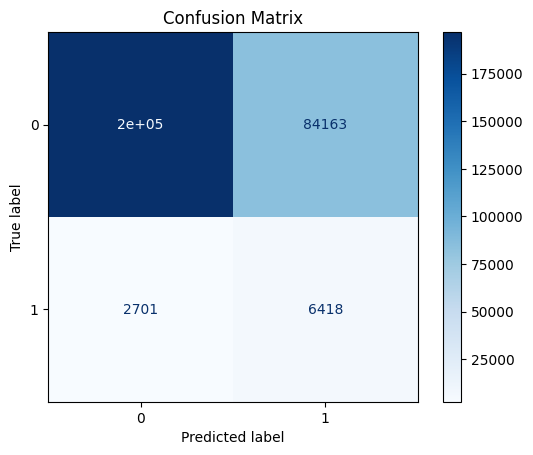

Confusion Matrix for the fold:
[[196643  84304]
 [  2654   6464]]
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    280947
           1       0.07      0.71      0.13      9118

    accuracy                           0.70    290065
   macro avg       0.53      0.70      0.47    290065
weighted avg       0.96      0.70      0.80    290065


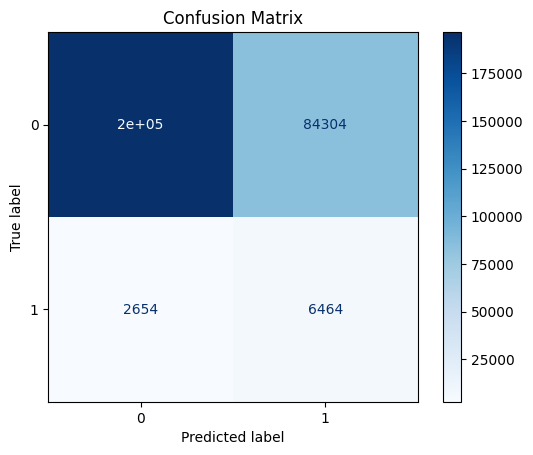

Confusion Matrix for the fold:
[[197495  83451]
 [  2816   6303]]
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    280946
           1       0.07      0.69      0.13      9119

    accuracy                           0.70    290065
   macro avg       0.53      0.70      0.47    290065
weighted avg       0.96      0.70      0.80    290065


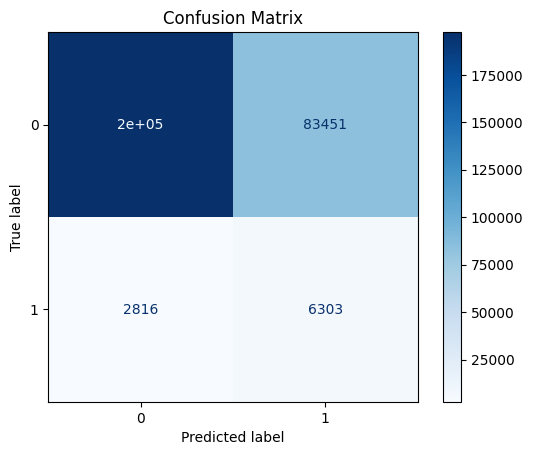

Confusion Matrix for the fold:
[[196357  84589]
 [  2696   6423]]
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    280946
           1       0.07      0.70      0.13      9119

    accuracy                           0.70    290065
   macro avg       0.53      0.70      0.47    290065
weighted avg       0.96      0.70      0.80    290065


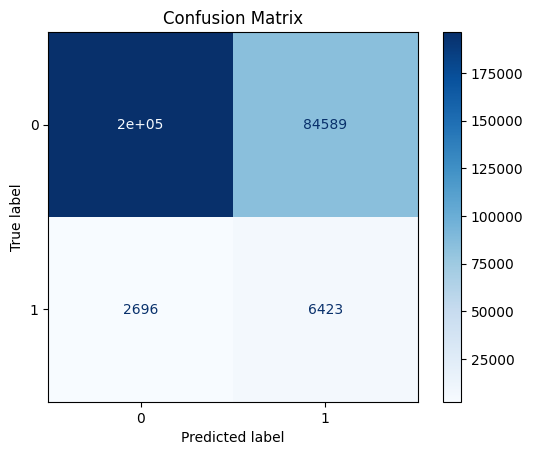

Confusion Matrix for the fold:
[[197539  83407]
 [  2789   6330]]
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    280946
           1       0.07      0.69      0.13      9119

    accuracy                           0.70    290065
   macro avg       0.53      0.70      0.47    290065
weighted avg       0.96      0.70      0.80    290065


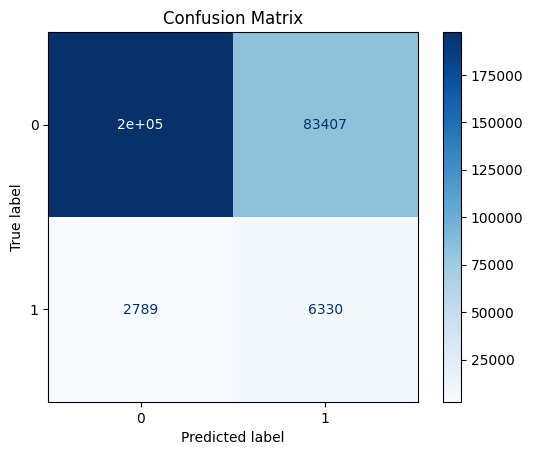

Final Test Set Results:
[[52009 21924]
 [  734  1666]]
              precision    recall  f1-score   support

           0       0.99      0.70      0.82     73933
           1       0.07      0.69      0.13      2400

    accuracy                           0.70     76333
   macro avg       0.53      0.70      0.47     76333
weighted avg       0.96      0.70      0.80     76333

Mean ROC AUC: 0.7648959862384076
Mean Accuracy: 0.7010534186909009


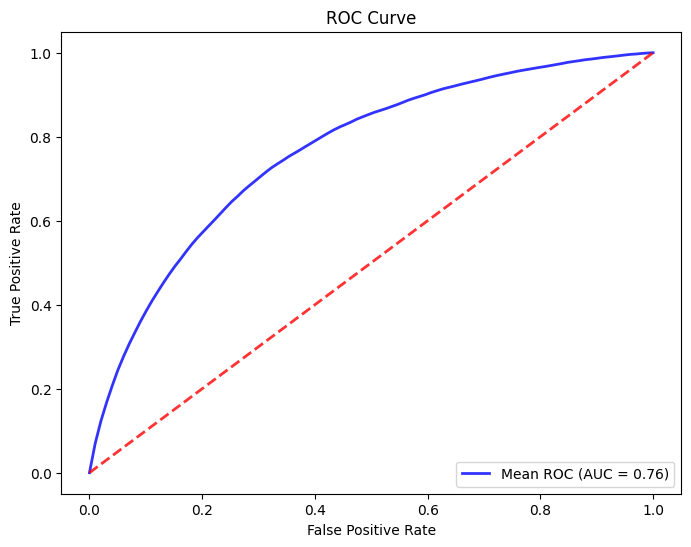

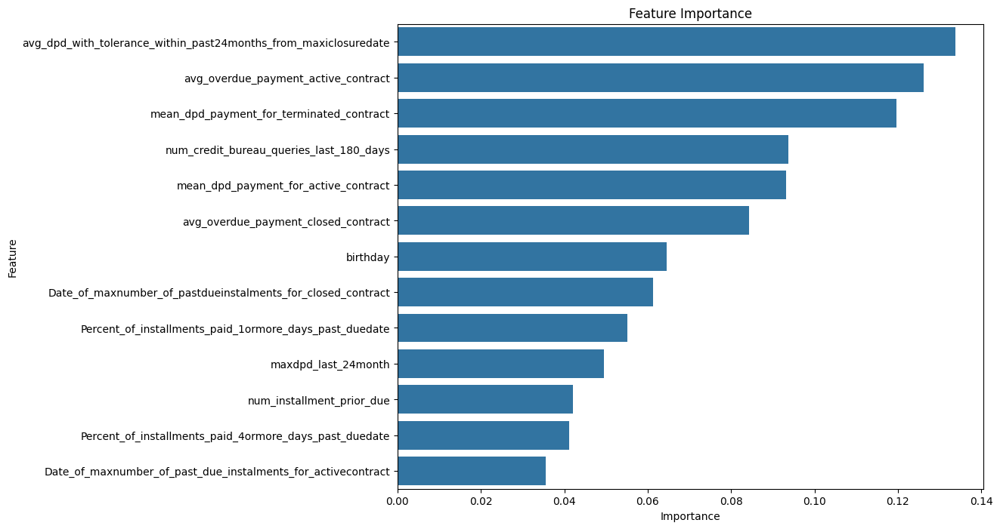

In [156]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, roc_curve, accuracy_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import RandomOverSampler
from imblearn.pipeline import Pipeline as ImbPipeline

# Configuration for the logistic regression
rf_params = {
        "n_estimators": 500,
        "max_depth": 10,
        "min_samples_split": 2,
        "min_samples_leaf": 1,
        "bootstrap": True,
        "random_state": 42,
        "n_jobs": -1
    }

# Function to create a logistic regression model pipeline
def create_oversample_model(df, strategy='median', logistic_params=logistic_params):
    simple_imputer = SimpleImputer(strategy=strategy)
    num_pipeline = Pipeline([
        ('imputer', simple_imputer),
        ('scaler', StandardScaler())
    ])
    # Apply preprocessing to all columns in the dataframe
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', num_pipeline, df.columns),
        ])
    model = ImbPipeline(steps=[
        ('preprocessor', preprocessor),
        ('oversample', RandomOverSampler(random_state=42)),
        ('classifier', RandomForestClassifier(**rf_params))
    ])
    return model

# Function to perform training using cross-validation and evaluate on a test set
def train_and_evaluate_model(df, target, test_size=0.05, random_state=42):
    X = df.drop(columns=[target])
    y = df[target]
    X = X.rename(columns={'avgdpdtolclosure24_3658938P_woe': 'avg_dpd_with_tolerance_within_past24months_from_maxiclosuredate'
,'days180_256L_woe': 'num_credit_bureau_queries_last_180_days'
,'mean_pmts_overdue_1140A_woe': 'avg_overdue_payment_active_contract'
, 'mean_numberofoverdueinstlmaxdat_148D_woe': 'Date_of_maxnumber_of_pastdueinstalments_for_closed_contract'
, 'mean_pmts_dpd_303P_woe': 'mean_dpd_payment_for_terminated_contract'
, 'mean_pmts_dpd_1073P_woe': 'mean_dpd_payment_for_active_contract'
,'max_incometype_1044T_cnt_woe': 'income_type'
,'max_empl_employedfrom_271D_woe': 'startdate_employment'
,'mean_numberofoverdueinstlmaxdat_641D_woe': 'Date_of_maxnumber_of_past_due_instalments_for_activecontract'
,'max_birth_259D_woe': 'birthday'
,'numinstpaidearly_338L_woe': 'num_installment_prior_due'
, 'maxdpdlast24m_143P_woe': 'maxdpd_last_24month'
,'mean_pmts_overdue_1152A_woe': 'avg_overdue_payment_closed_contract'
,'pctinstlsallpaidlate1d_3546856L_woe': 'Percent_of_installments_paid_1ormore_days_past_duedate'
,'pctinstlsallpaidlate4d_3546849L_woe': 'Percent_of_installments_paid_4ormore_days_past_duedate'})
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state, stratify=y)
    
    model = create_oversample_model(X_train)
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=random_state)

    cv_scores_auc = []
    cv_scores_accuracy = []
    mean_fpr = np.linspace(0, 1, 100)
    tprs = []

    for train_index, test_index in cv.split(X_train, y_train):
        X_fold_train, X_fold_test = X_train.iloc[train_index], X_train.iloc[test_index]
        y_fold_train, y_fold_test = y_train.iloc[train_index], y_train.iloc[test_index]
        
        model.fit(X_fold_train, y_fold_train)
        y_pred_proba = model.predict_proba(X_fold_test)[:, 1]
        y_pred = model.predict(X_fold_test)

        # Evaluate the model on the fold
        y_pred = model.predict(X_fold_test)
        print("Confusion Matrix for the fold:")
        print(confusion_matrix(y_fold_test, y_pred))
        print(classification_report(y_fold_test, y_pred))

        # CM heatmap
        y_pred_labels = (y_pred > 0.5).astype(int)
        cm = confusion_matrix(y_fold_test, y_pred_labels)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm)
        disp.plot(cmap=plt.cm.Blues)
        plt.title('Confusion Matrix')
        plt.show()

        fpr, tpr, _ = roc_curve(y_fold_test, y_pred_proba)
        tprs.append(np.interp(mean_fpr, fpr, tpr))
        tprs[-1][0] = 0.0
        roc_auc = roc_auc_score(y_fold_test, y_pred_proba)
        cv_scores_auc.append(roc_auc)

        accuracy = accuracy_score(y_fold_test, y_pred)
        cv_scores_accuracy.append(accuracy)

    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    mean_accuracy = np.mean(cv_scores_accuracy)

    # Final test on the holdout test set
    y_pred_test = model.predict(X_test)
    print("Final Test Set Results:")
    print(confusion_matrix(y_test, y_pred_test))
    print(classification_report(y_test, y_pred_test))

    print(f"Mean ROC AUC: {mean_auc}")
    print(f"Mean Accuracy: {mean_accuracy}")

    # Plot ROC Curve
    plt.figure(figsize=(8, 6))
    plt.plot(mean_fpr, mean_tpr, color='blue', label=f'Mean ROC (AUC = {mean_auc:.2f})', lw=2, alpha=0.8)
    plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='red', alpha=0.8)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()
    
    # Visualize variable importance
    df_list = [col for col in X.columns]
    feature_importances = model.named_steps['classifier'].feature_importances_
    features_df = pd.DataFrame({'Feature': df_list, 'Importance': feature_importances})
    features_df = features_df.sort_values(by='Importance', ascending=False)
    
    # 可视化特征的重要性
    plt.figure(figsize=(10, 8))
    sns.barplot(x='Importance', y='Feature', data=features_df, orient='h')
    plt.title('Feature Importance')
    plt.show()

    return model

# Example usage:
rf_model = train_and_evaluate_model(df_smote_wOsex_wOalter, 'target')

catboost

CatBoost without oversampling- Accuracy+AUC

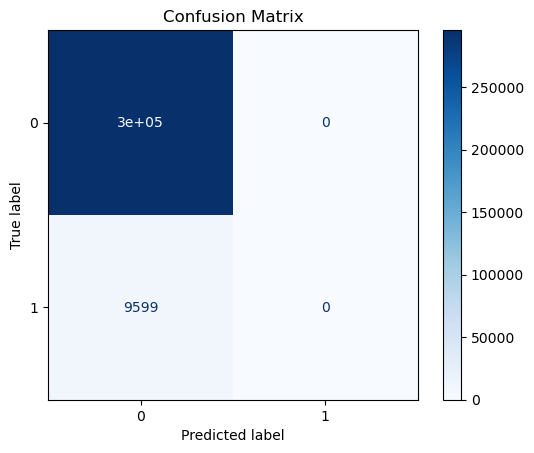

AUC Score for this fold: 0.7714190501405109
Accuracy for this fold: 0.9685620897907851


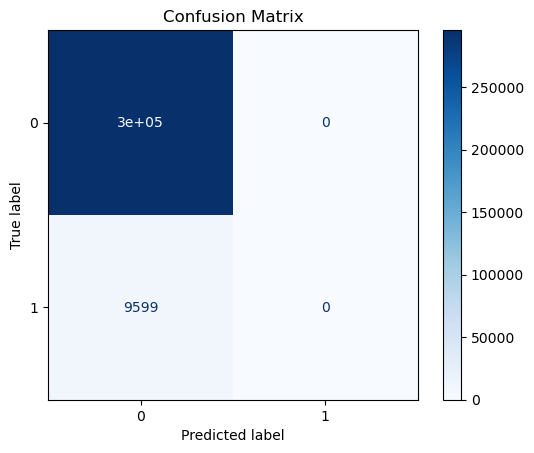

AUC Score for this fold: 0.7767372914466665
Accuracy for this fold: 0.9685620897907851


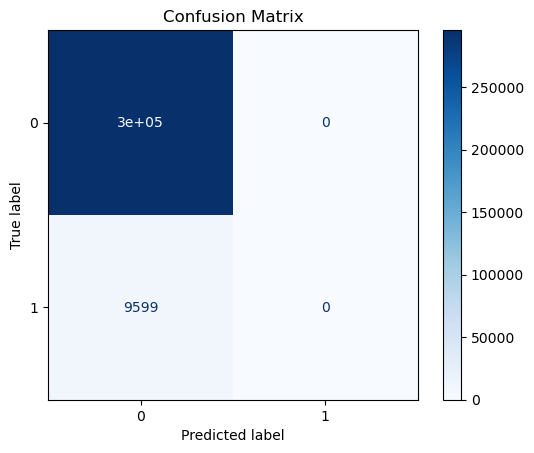

AUC Score for this fold: 0.7747110668406729
Accuracy for this fold: 0.9685620897907851


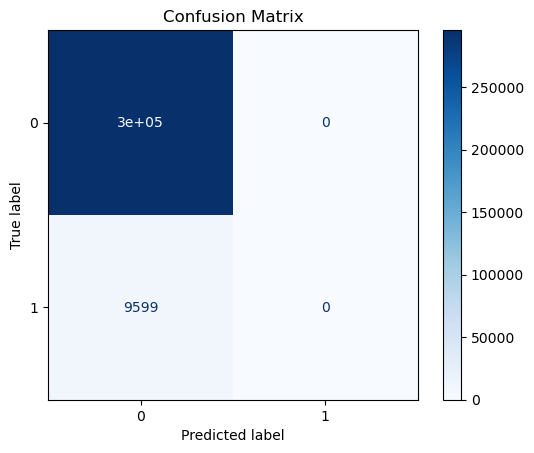

AUC Score for this fold: 0.7717597125951609
Accuracy for this fold: 0.9685620897907851


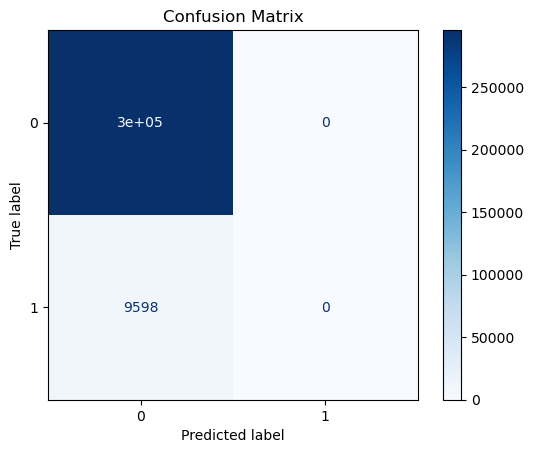

AUC Score for this fold: 0.7740107918174901
Accuracy for this fold: 0.9685652619616089
Average CV AUC Score: 0.7737275825681003
Average CV Accuracy Score: 0.9685627242249499


In [35]:
#catboost without oversampling
from catboost import CatBoostClassifier, Pool, cv
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score
df_smote_wOsex_walter
y = df_smote_wOsex_walter['target']
X = df_smote_wOsex_walter.drop(columns=['target'])
# Example data setup
# X_train: feature set, y_train: target set
# Assume X_train and y_train are already defined and properly preprocessed

# Define the CatBoost classifier
cb_model = CatBoostClassifier(
    iterations=100, 
    learning_rate=0.1, 
    depth=6,
    loss_function='Logloss',
    verbose=False,
    random_seed=42
)

# Setup for cross-validation
n_splits = 5
cv_scores = []
kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)


# Perform cross-validation
cv_scores_auc = []
cv_scores_accuracy = []  # List to store each fold's accuracy

for train_index, test_index in kf.split(X, y):
    X_train_fold, X_valid_fold = X.iloc[train_index], X.iloc[test_index]
    y_train_fold, y_valid_fold = y.iloc[train_index], y.iloc[test_index]
    
    # Fit the model
    cb_model.fit(X_train_fold, y_train_fold, eval_set=(X_valid_fold, y_valid_fold), use_best_model=True)
    
    # Predict probabilities and convert to class labels
    y_pred_proba = cb_model.predict_proba(X_valid_fold)[:, 1]
    y_pred_labels = (y_pred_proba > 0.5).astype(int)
    
    # Calculate AUC score
    auc = roc_auc_score(y_valid_fold, y_pred_proba)
    cv_scores_auc.append(auc)  # Store AUC score for this fold
    
    # Calculate accuracy
    accuracy = accuracy_score(y_valid_fold, y_pred_labels)
    cv_scores_accuracy.append(accuracy)  # Store accuracy for this fold
    
    # Generate and display the confusion matrix
    cm = confusion_matrix(y_valid_fold, y_pred_labels)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.show()

    print(f"AUC Score for this fold: {auc}")
    print(f"Accuracy for this fold: {accuracy}")

# Print average AUC score and average accuracy across all folds
print("Average CV AUC Score:", np.mean(cv_scores_auc))
print("Average CV Accuracy Score:", np.mean(cv_scores_accuracy))

Catboost without sampling - Accuracy+Recall+Precision+F1+AUC

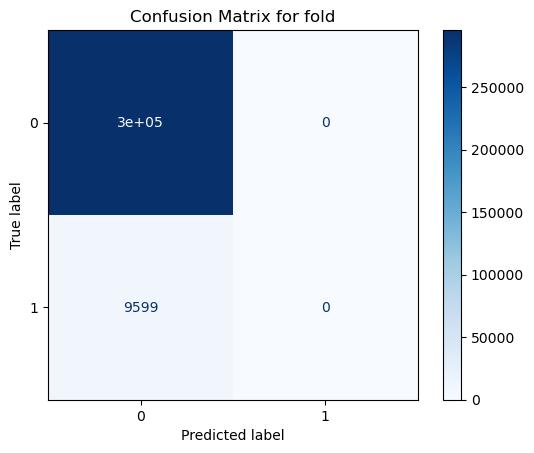

AUC Score for this fold: 0.7714190501405109
Accuracy for this fold: 0.9685620897907851
Precision for this fold: 0.0
Recall for this fold: 0.0
F1 Score for this fold: 0.0


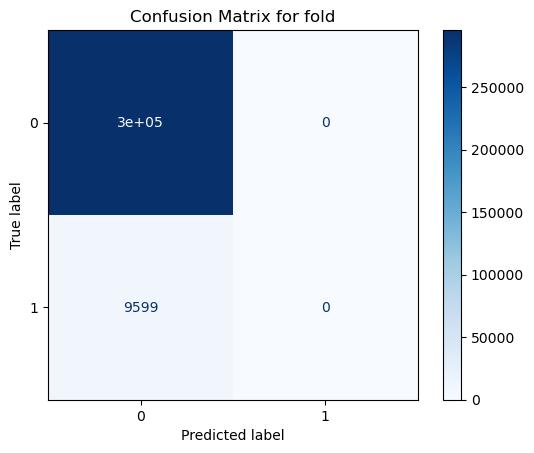

AUC Score for this fold: 0.7767372914466665
Accuracy for this fold: 0.9685620897907851
Precision for this fold: 0.0
Recall for this fold: 0.0
F1 Score for this fold: 0.0


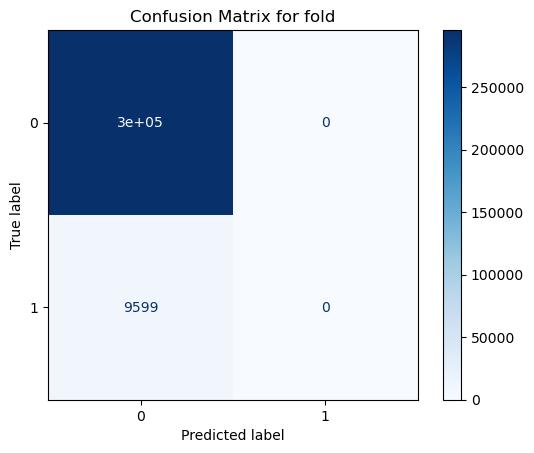

AUC Score for this fold: 0.7747110668406729
Accuracy for this fold: 0.9685620897907851
Precision for this fold: 0.0
Recall for this fold: 0.0
F1 Score for this fold: 0.0


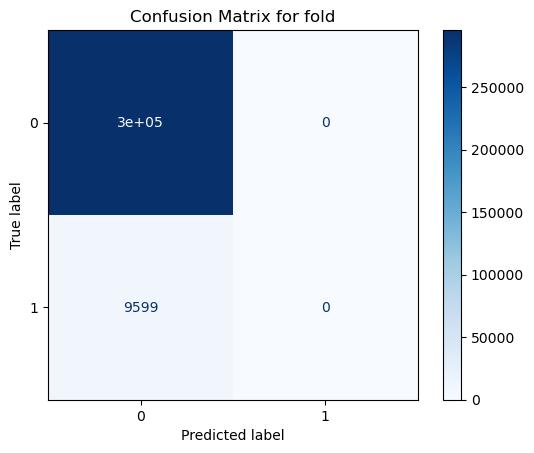

AUC Score for this fold: 0.7717597125951609
Accuracy for this fold: 0.9685620897907851
Precision for this fold: 0.0
Recall for this fold: 0.0
F1 Score for this fold: 0.0


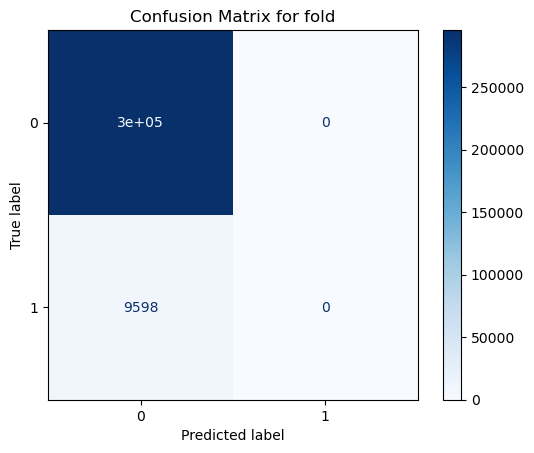

AUC Score for this fold: 0.7740107918174901
Accuracy for this fold: 0.9685652619616089
Precision for this fold: 0.0
Recall for this fold: 0.0
F1 Score for this fold: 0.0
Average CV AUC Score: 0.7737275825681003
Average CV Accuracy Score: 0.9685627242249499
Average CV Precision Score: 0.0
Average CV Recall Score: 0.0
Average CV F1 Score: 0.0


In [36]:
from catboost import CatBoostClassifier
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold
import matplotlib.pyplot as plt
import numpy as np

# Assuming df_smote_wOsex_walter is your DataFrame with the data
y = df_smote_wOsex_walter['target']
X = df_smote_wOsex_walter.drop(columns=['target'])

# Define the CatBoost classifier
cb_model = CatBoostClassifier(
    iterations=100, 
    learning_rate=0.1, 
    depth=6,
    loss_function='Logloss',
    verbose=False,
    random_seed=42
)

# Setup for cross-validation
n_splits = 5
kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Lists to store each fold's performance metrics
cv_scores_auc = []
cv_scores_accuracy = []
cv_scores_precision = []
cv_scores_recall = []
cv_scores_f1 = []

# Perform cross-validation
for train_index, test_index in kf.split(X, y):
    X_train_fold, X_valid_fold = X.iloc[train_index], X.iloc[test_index]
    y_train_fold, y_valid_fold = y.iloc[train_index], y.iloc[test_index]
    
    # Fit the model
    cb_model.fit(X_train_fold, y_train_fold, eval_set=(X_valid_fold, y_valid_fold), use_best_model=True)
    
    # Predict probabilities and convert to class labels
    y_pred_proba = cb_model.predict_proba(X_valid_fold)[:, 1]
    y_pred_labels = (y_pred_proba > 0.5).astype(int)
    
    # Calculate metrics
    auc = roc_auc_score(y_valid_fold, y_pred_proba)
    accuracy = accuracy_score(y_valid_fold, y_pred_labels)
    precision = precision_score(y_valid_fold, y_pred_labels)
    recall = recall_score(y_valid_fold, y_pred_labels)
    f1 = f1_score(y_valid_fold, y_pred_labels)
    
    # Store metrics for this fold
    cv_scores_auc.append(auc)
    cv_scores_accuracy.append(accuracy)
    cv_scores_precision.append(precision)
    cv_scores_recall.append(recall)
    cv_scores_f1.append(f1)
    
    # Generate and display the confusion matrix
    cm = confusion_matrix(y_valid_fold, y_pred_labels)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title('Confusion Matrix for fold')
    plt.show()

    # Print metrics for this fold
    print(f"AUC Score for this fold: {auc}")
    print(f"Accuracy for this fold: {accuracy}")
    print(f"Precision for this fold: {precision}")
    print(f"Recall for this fold: {recall}")
    print(f"F1 Score for this fold: {f1}")

# Print average scores across all folds
print("Average CV AUC Score:", np.mean(cv_scores_auc))
print("Average CV Accuracy Score:", np.mean(cv_scores_accuracy))
print("Average CV Precision Score:", np.mean(cv_scores_precision))
print("Average CV Recall Score:", np.mean(cv_scores_recall))
print("Average CV F1 Score:", np.mean(cv_scores_f1))


Catboost with oversampling- AUC+ Accuracy

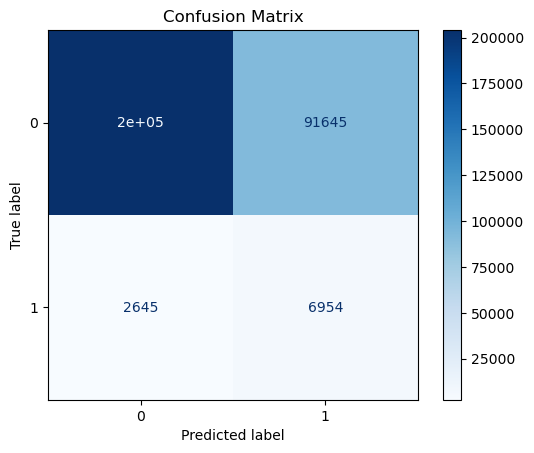

AUC Score for this fold: 0.7727472415503684
Accuracy for this fold: 0.6911886078105145


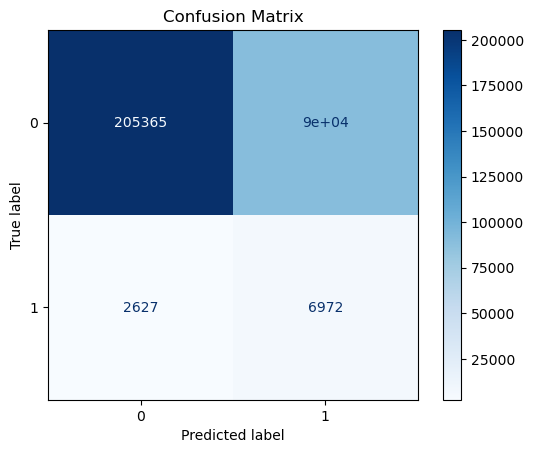

AUC Score for this fold: 0.7784529625434837
Accuracy for this fold: 0.6954298927069551


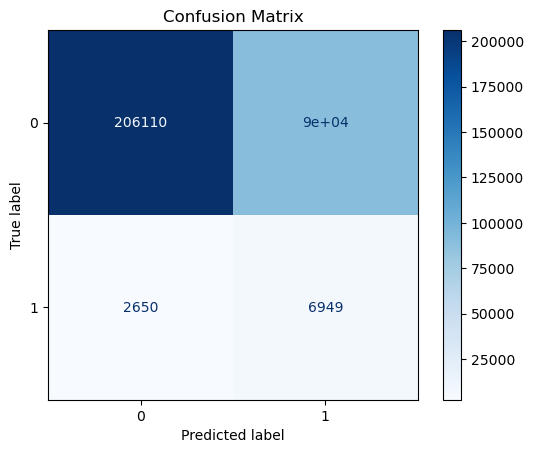

AUC Score for this fold: 0.7757250550601203
Accuracy for this fold: 0.6977945318538509


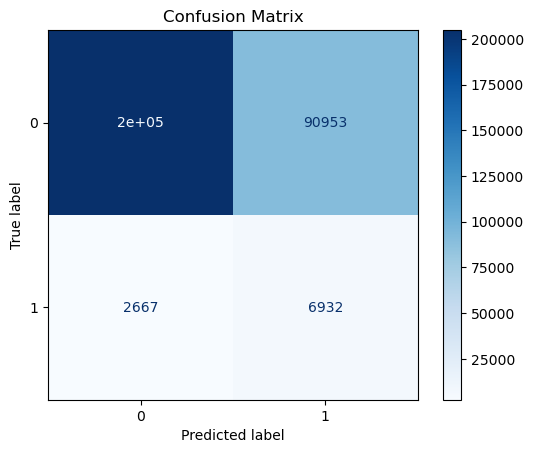

AUC Score for this fold: 0.7733322332635278
Accuracy for this fold: 0.6933829405368582


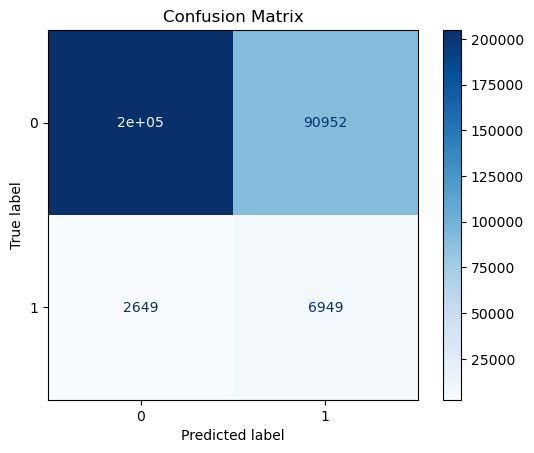

AUC Score for this fold: 0.7752524780524802
Accuracy for this fold: 0.6934441638746147
Average CV AUC Score: 0.7751019940939962
Average CV Accuracy Score: 0.6942480273565587


In [37]:
from catboost import CatBoostClassifier, Pool, cv
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, roc_auc_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import RandomOverSampler
import matplotlib.pyplot as plt
import numpy as np

# Assuming df_smote_wOsex_walter is your DataFrame with the data
X = df_smote_wOsex_walter
y = X['target']
X = X.drop(columns=['target'])

# Define the CatBoost classifier
cb_model = CatBoostClassifier(
    iterations=100, 
    learning_rate=0.1, 
    depth=6,
    loss_function='Logloss',
    verbose=False,
    random_seed=42
)

# Setup for cross-validation
n_splits = 5
cv_scores_auc = []
cv_scores_accuracy = []  # List to store each fold's accuracy
kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
ros = RandomOverSampler(random_state=42)  # Random oversampler for handling imbalance

for train_index, test_index in kf.split(X, y):
    X_train_fold, X_valid_fold = X.iloc[train_index], X.iloc[test_index]
    y_train_fold, y_valid_fold = y.iloc[train_index], y.iloc[test_index]

    # Apply RandomOverSampler to the training data
    X_train_ros, y_train_ros = ros.fit_resample(X_train_fold, y_train_fold)
    
    # Fit the model on oversampled data
    cb_model.fit(X_train_ros, y_train_ros, eval_set=(X_valid_fold, y_valid_fold), use_best_model=True)
    
    # Predict probabilities and convert to class labels
    y_pred_proba = cb_model.predict_proba(X_valid_fold)[:, 1]
    y_pred_labels = (y_pred_proba > 0.5).astype(int)
    
    # Calculate AUC score
    auc = roc_auc_score(y_valid_fold, y_pred_proba)
    cv_scores_auc.append(auc)
    
    # Calculate accuracy
    accuracy = accuracy_score(y_valid_fold, y_pred_labels)
    cv_scores_accuracy.append(accuracy)
    
    # Generate and display the confusion matrix
    cm = confusion_matrix(y_valid_fold, y_pred_labels)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.show()

    print(f"AUC Score for this fold: {auc}")
    print(f"Accuracy for this fold: {accuracy}")

# Print average AUC score and average accuracy across all folds
print("Average CV AUC Score:", np.mean(cv_scores_auc))
print("Average CV Accuracy Score:", np.mean(cv_scores_accuracy))


Catboost oversampling- Accuracy+recall+precision+F1+AUC

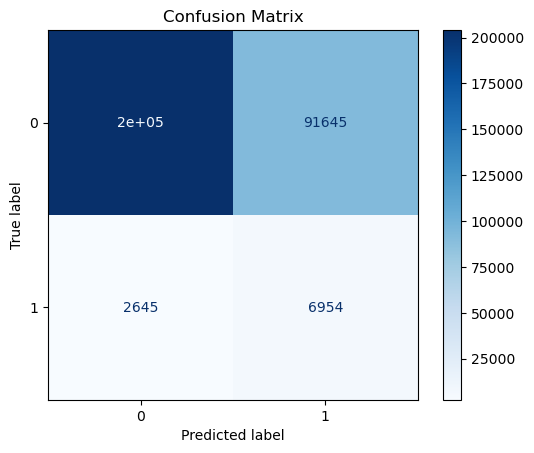

AUC Score for this fold: 0.7727472415503684
Accuracy for this fold: 0.6911886078105145
Precision for this fold: 0.07052809866225823
Recall for this fold: 0.7244504635899572
F1 Score for this fold: 0.12854211722952366


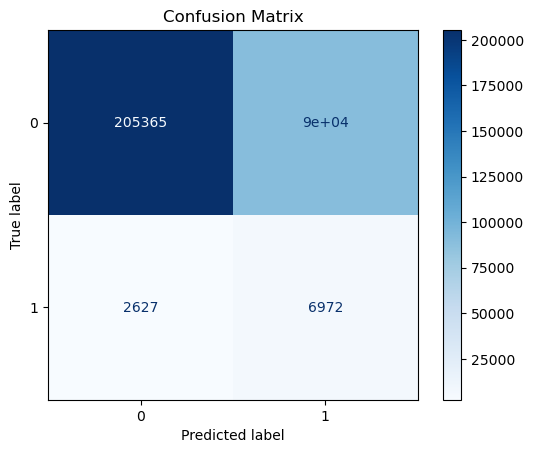

AUC Score for this fold: 0.7784529625434837
Accuracy for this fold: 0.6954298927069551
Precision for this fold: 0.07162523114855147
Recall for this fold: 0.7263256589228044
F1 Score for this fold: 0.13039209268835505


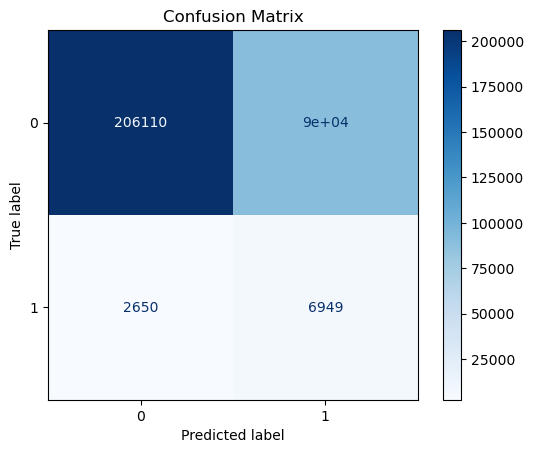

AUC Score for this fold: 0.7757250550601203
Accuracy for this fold: 0.6977945318538509
Precision for this fold: 0.07195667481257507
Recall for this fold: 0.7239295759974997
F1 Score for this fold: 0.13090203539572953


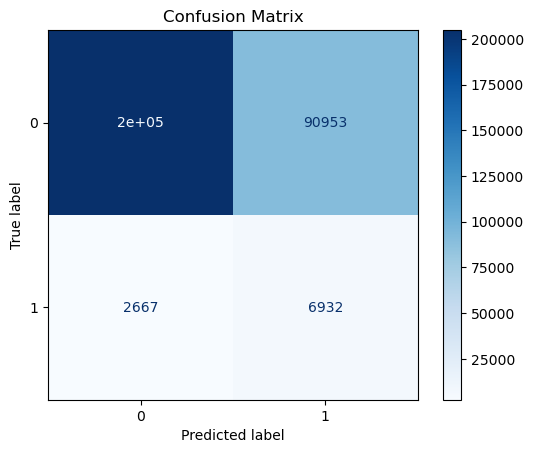

AUC Score for this fold: 0.7733322332635278
Accuracy for this fold: 0.6933829405368582
Precision for this fold: 0.07081779639372733
Recall for this fold: 0.7221585581831441
F1 Score for this fold: 0.12898663987198095


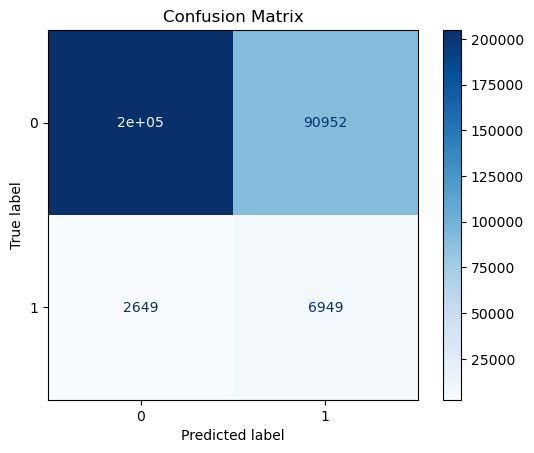

AUC Score for this fold: 0.7752524780524802
Accuracy for this fold: 0.6934441638746147
Precision for this fold: 0.0709798674170846
Recall for this fold: 0.7240050010418837
F1 Score for this fold: 0.12928492358068447
Average CV AUC Score: 0.7751019940939962
Average CV Accuracy Score: 0.6942480273565587
Average CV Precision Score: 0.07118153368683934
Average CV Recall Score: 0.7241738515470578
Average CV F1 Score: 0.12962156175325473


In [38]:
from catboost import CatBoostClassifier
from sklearn.metrics import (
    accuracy_score, roc_auc_score, confusion_matrix, 
    precision_score, recall_score, f1_score, ConfusionMatrixDisplay
)
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import RandomOverSampler
import matplotlib.pyplot as plt
import numpy as np

# 假设 df_smote_wOsex_walter 是包含数据的 DataFrame
y = df_smote_wOsex_walter['target']
X = df_smote_wOsex_walter.drop(columns=['target'])

# 定义 CatBoost 分类器
cb_model = CatBoostClassifier(
    iterations=100, 
    learning_rate=0.1, 
    depth=6,
    loss_function='Logloss',
    verbose=False,
    random_seed=42
)

# 为交叉验证设置参数
n_splits = 5
kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
ros = RandomOverSampler(random_state=42)  # 随机过采样器，用于处理数据不平衡

# 用于存储每一折的评估指标
cv_scores = {
    'auc': [],
    'accuracy': [],
    'precision': [],
    'recall': [],
    'f1': []
}

# 执行交叉验证
for train_index, test_index in kf.split(X, y):
    X_train_fold, X_valid_fold = X.iloc[train_index], X.iloc[test_index]
    y_train_fold, y_valid_fold = y.iloc[train_index], y.iloc[test_index]

    # 对训练数据应用 RandomOverSampler
    X_train_ros, y_train_ros = ros.fit_resample(X_train_fold, y_train_fold)
    
    # 在过采样数据上拟合模型
    cb_model.fit(X_train_ros, y_train_ros, eval_set=(X_valid_fold, y_valid_fold), use_best_model=True)
    
    # 预测概率并转换为类标签
    y_pred_proba = cb_model.predict_proba(X_valid_fold)[:, 1]
    y_pred_labels = (y_pred_proba > 0.5).astype(int)
    
    # 计算评估指标
    auc = roc_auc_score(y_valid_fold, y_pred_proba)
    accuracy = accuracy_score(y_valid_fold, y_pred_labels)
    precision = precision_score(y_valid_fold, y_pred_labels)
    recall = recall_score(y_valid_fold, y_pred_labels)
    f1 = f1_score(y_valid_fold, y_pred_labels)
    
    # 保存指标结果
    cv_scores['auc'].append(auc)
    cv_scores['accuracy'].append(accuracy)
    cv_scores['precision'].append(precision)
    cv_scores['recall'].append(recall)
    cv_scores['f1'].append(f1)
    
    # 显示混淆矩阵
    cm = confusion_matrix(y_valid_fold, y_pred_labels)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.show()

    # 打印这一折的指标结果
    print(f"AUC Score for this fold: {auc}")
    print(f"Accuracy for this fold: {accuracy}")
    print(f"Precision for this fold: {precision}")
    print(f"Recall for this fold: {recall}")
    print(f"F1 Score for this fold: {f1}")
    
# 打印所有折的平均指标分数
print("Average CV AUC Score:", np.mean(cv_scores['auc']))
print("Average CV Accuracy Score:", np.mean(cv_scores['accuracy']))
print("Average CV Precision Score:", np.mean(cv_scores['precision']))
print("Average CV Recall Score:", np.mean(cv_scores['recall']))
print("Average CV F1 Score:", np.mean(cv_scores['f1']))


Catboost Feature Importance - Feature names have been changed

In [39]:
catboost = cb_model.fit(X,y)

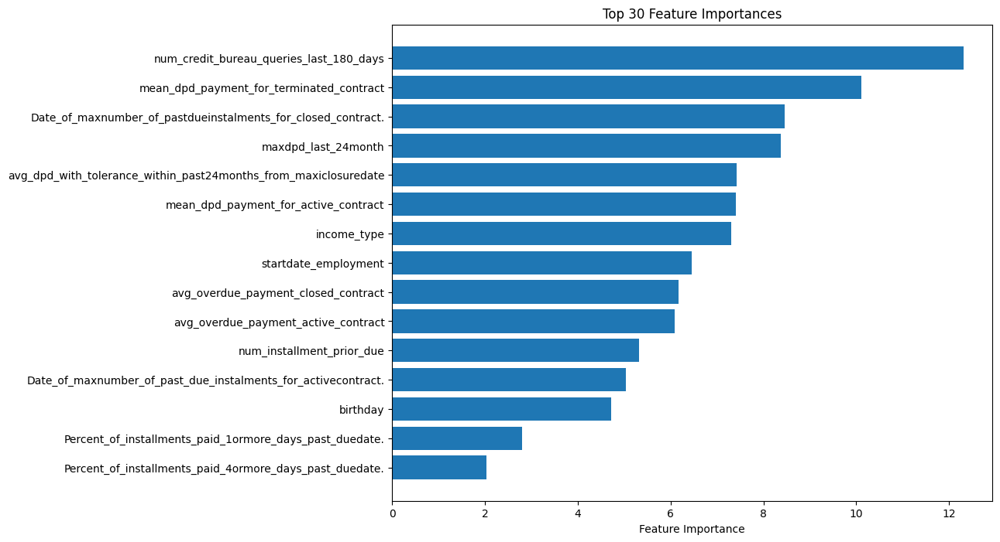

In [107]:
# Assuming 'catboost' is your trained CatBoost model
feature_importances = catboost.get_feature_importance(type='FeatureImportance')
feature_names = X.columns  # Assuming X is your feature DataFrame

# Creating a DataFrame to store and sort the feature importances
feature_importance_df = pd.DataFrame({
    'Feature Names': feature_names,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Optionally, if you want to limit to the top N features
top_features = feature_importance_df.head(30)  # Adjust N here


# 将列名从'A'和'B'改为'Column1'和'Column2'
new_names=['num_credit_bureau_queries_last_180_days'
                             , 'mean_dpd_payment_for_terminated_contract'
                             , 'Date_of_maxnumber_of_pastdueinstalments_for_closed_contract.'
                             , 'maxdpd_last_24month'
                             , 'avg_dpd_with_tolerance_within_past24months_from_maxiclosuredate'
                             , 'mean_dpd_payment_for_active_contract'
                             ,'income_type'
                             ,'startdate_employment'
                             ,'avg_overdue_payment_closed_contract'
                             ,'avg_overdue_payment_active_contract'
                             ,'num_installment_prior_due'
                             ,'Date_of_maxnumber_of_past_due_instalments_for_activecontract.'
                             ,'birthday'
                             ,'Percent_of_installments_paid_1ormore_days_past_duedate.'
                             ,'Percent_of_installments_paid_4ormore_days_past_duedate.'
]

assert len(new_names) == len(top_features)

# 将新名字列表赋值给 'Feature Names' 列
top_features['Feature Names'] = new_names


# Plotting feature importances
plt.figure(figsize=(10, 8))
plt.barh(top_features['Feature Names'], top_features['Importance'])
plt.xlabel('Feature Importance')
plt.title('Top 30 Feature Importances')  # You can adjust the title as per the number of features you're displaying
plt.gca().invert_yaxis()  # Invert y-axis to have the most important feature at the top
plt.show()


In [43]:
df_smote_pre['target'].value_counts()

0    1478665
1      47994
Name: target, dtype: int64

target:
0: 1478665;
1: 47994
rate: 0.03245765606137969

lgbm-light gbm 24 April Yansong Du

In [48]:
if df_smote_woe.items == df_smote_wOsex_walter.items:
    print('yes')
else:
    print("no")


yes


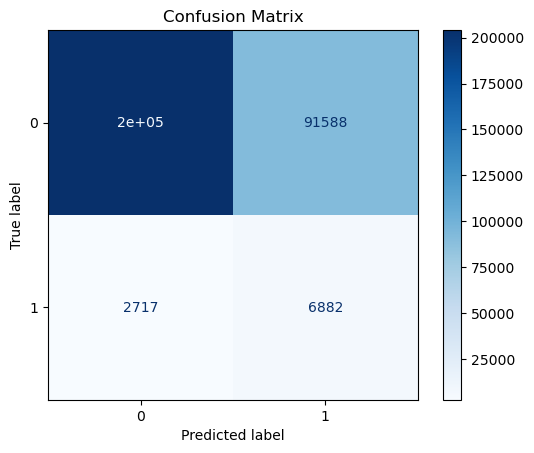

AUC Score for this fold: 0.7678627863736753
Accuracy for this fold: 0.6911394809584321
Precision for this fold: 0.0698893063877323
Recall for this fold: 0.7169496822585686
F1 Score for this fold: 0.12736307359187185


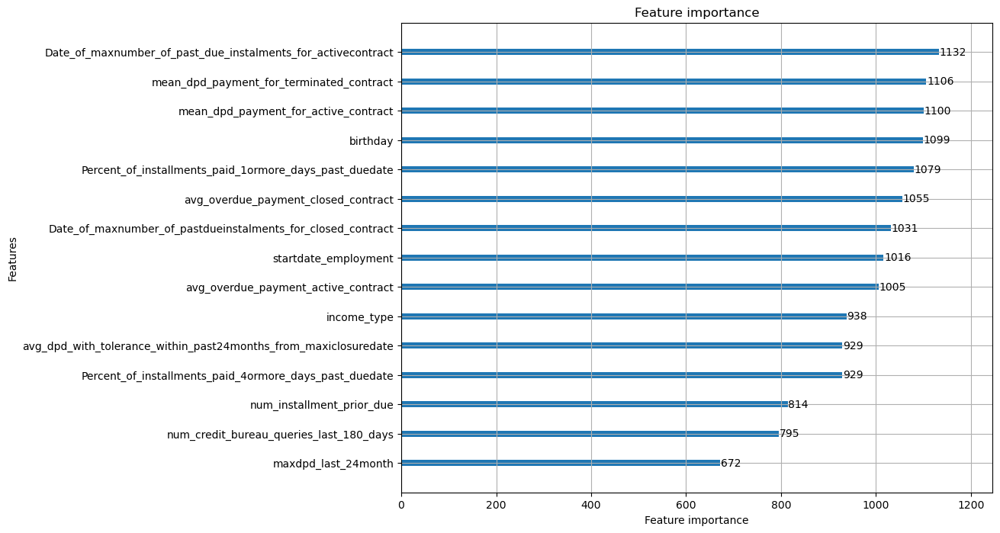

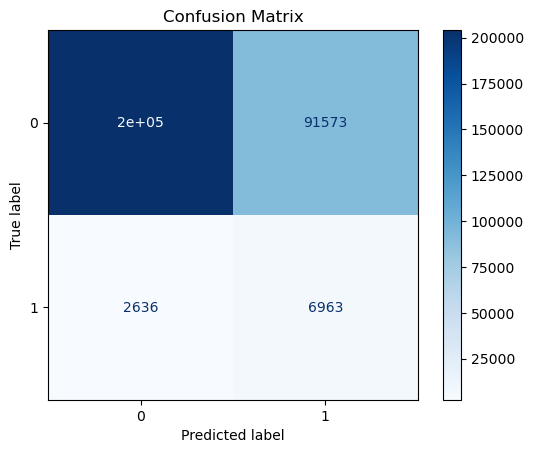

AUC Score for this fold: 0.7727310079457839
Accuracy for this fold: 0.691453892811759
Precision for this fold: 0.0706645287001705
Recall for this fold: 0.7253880612563809
F1 Score for this fold: 0.12878346511305314


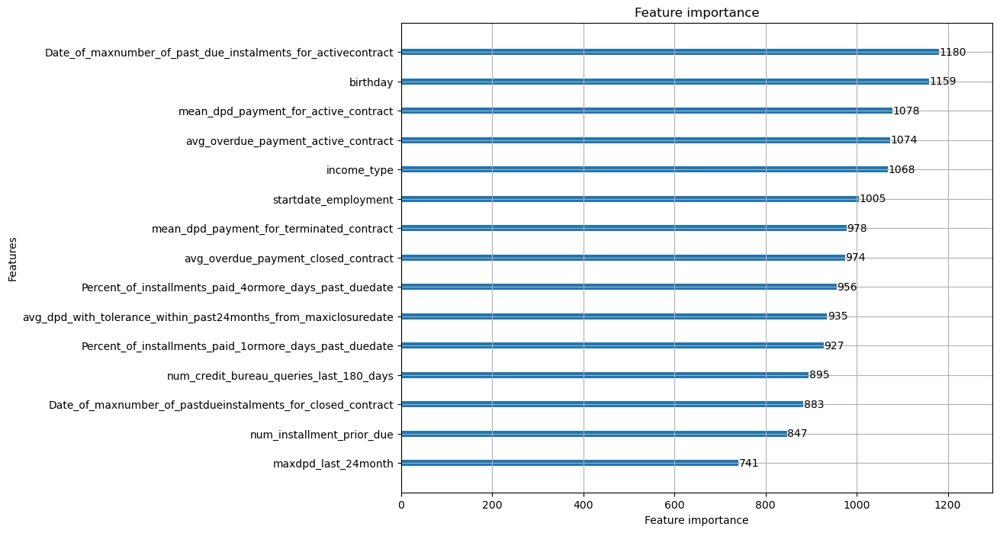

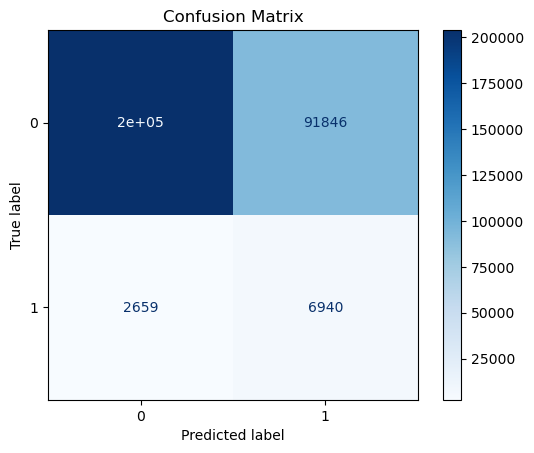

AUC Score for this fold: 0.7693259226379452
Accuracy for this fold: 0.6904844562640011
Precision for this fold: 0.07025286983985585
Recall for this fold: 0.7229919783310762
F1 Score for this fold: 0.12806200119942796


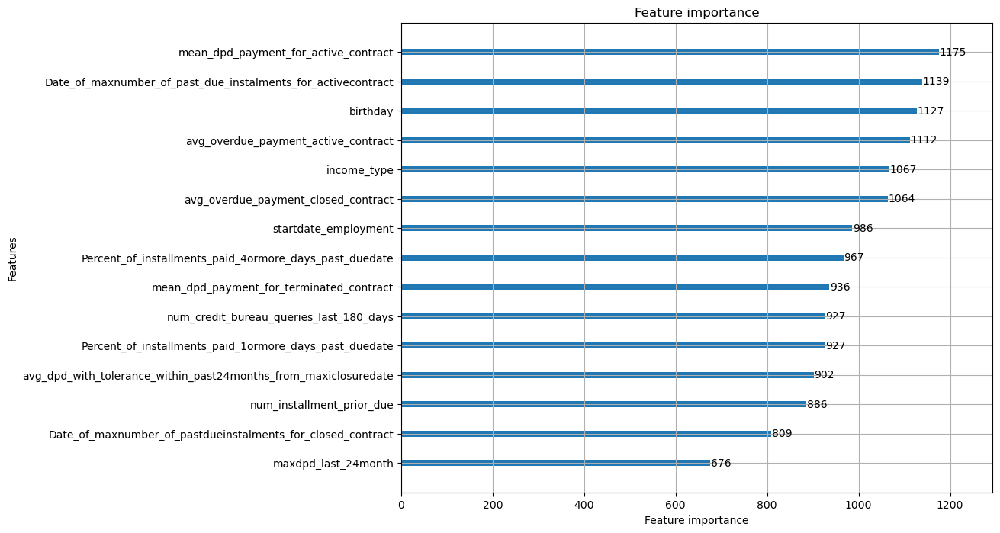

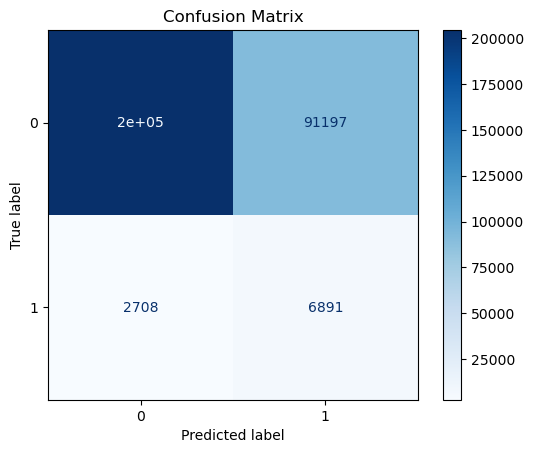

AUC Score for this fold: 0.7671912392142104
Accuracy for this fold: 0.6924495303472941
Precision for this fold: 0.07025324198678737
Recall for this fold: 0.7178872799249922
F1 Score for this fold: 0.12798202197108285


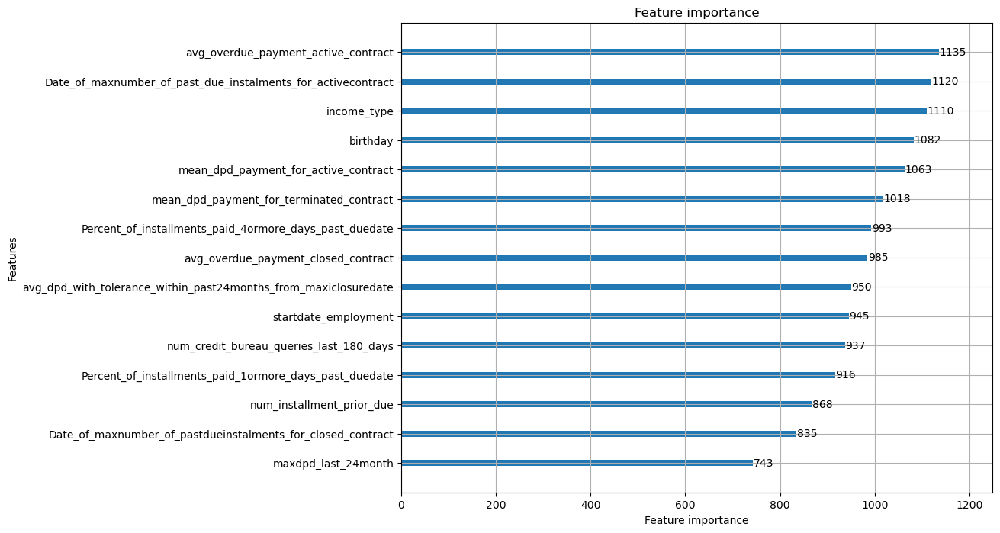

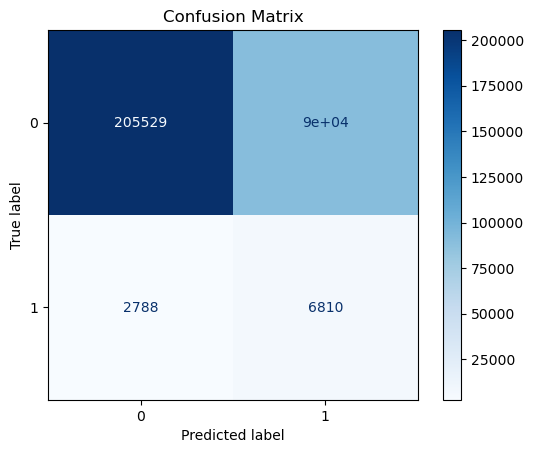

AUC Score for this fold: 0.7679711896822459
Accuracy for this fold: 0.6954387206015766
Precision for this fold: 0.07019605417774755
Recall for this fold: 0.7095228172535945
F1 Score for this fold: 0.12775297339886693


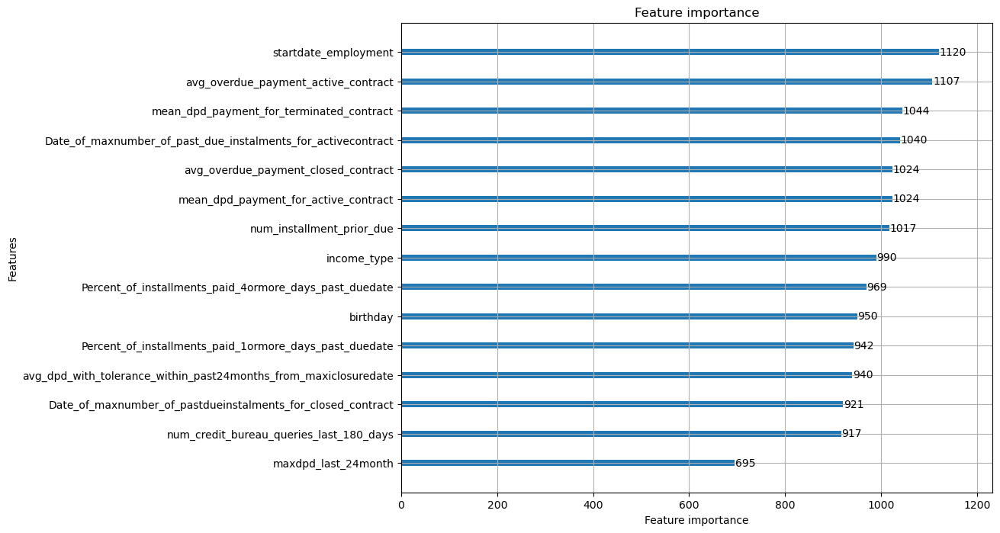

Average CV AUC Score: 0.7690164291707722
Average CV Accuracy Score: 0.6921932161966126
Average CV Precision Score: 0.07025120021845872
Average CV Recall Score: 0.7185479638049224
Average CV F1 Score: 0.12798870705486054


In [101]:
from sklearn.metrics import (
    accuracy_score, roc_auc_score, confusion_matrix, 
    precision_score, recall_score, f1_score, ConfusionMatrixDisplay
)
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import RandomOverSampler
import matplotlib.pyplot as plt
import numpy as np

# 假设 df_smote_wOsex_walter 是包含数据的 DataFrame
y = df_smote_wOsex_walter['target']
X = df_smote_wOsex_walter.drop(columns=['target'])
X = X.rename(columns={'avgdpdtolclosure24_3658938P_woe': 'avg_dpd_with_tolerance_within_past24months_from_maxiclosuredate'
,'days180_256L_woe': 'num_credit_bureau_queries_last_180_days'
,'mean_pmts_overdue_1140A_woe': 'avg_overdue_payment_active_contract'
, 'mean_numberofoverdueinstlmaxdat_148D_woe': 'Date_of_maxnumber_of_pastdueinstalments_for_closed_contract'
, 'mean_pmts_dpd_303P_woe': 'mean_dpd_payment_for_terminated_contract'
, 'mean_pmts_dpd_1073P_woe': 'mean_dpd_payment_for_active_contract'
,'max_incometype_1044T_cnt_woe': 'income_type'
,'max_empl_employedfrom_271D_woe': 'startdate_employment'
,'mean_numberofoverdueinstlmaxdat_641D_woe': 'Date_of_maxnumber_of_past_due_instalments_for_activecontract'
,'max_birth_259D_woe': 'birthday'
,'numinstpaidearly_338L_woe': 'num_installment_prior_due'
, 'maxdpdlast24m_143P_woe': 'maxdpd_last_24month'
,'mean_pmts_overdue_1152A_woe': 'avg_overdue_payment_closed_contract'
,'pctinstlsallpaidlate1d_3546856L_woe': 'Percent_of_installments_paid_1ormore_days_past_duedate'
,'pctinstlsallpaidlate4d_3546849L_woe': 'Percent_of_installments_paid_4ormore_days_past_duedate'})
params = {
    "boosting_type": "gbdt",
    "objective": "binary",
    "metric": "auc",
    "max_depth": 14,  
    "learning_rate": 0.09,
    "n_estimators": 300,  
    "colsample_bytree": 0.6,
    "colsample_bynode": 0.8,
    "verbose": -1,
    "random_state": 43,
    "reg_alpha": 0.1,
    "reg_lambda": 10,
    "extra_trees":True,
    'num_leaves':50, 
    "verbose": -1,
}
# 定义 CatBoost 分类器
lgb_model = lgb.LGBMClassifier(**params)

# 为交叉验证设置参数
n_splits = 5
kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
ros = RandomOverSampler(random_state=42)  # 随机过采样器，用于处理数据不平衡

# 用于存储每一折的评估指标
cv_scores = {
    'auc': [],
    'accuracy': [],
    'precision': [],
    'recall': [],
    'f1': []
}

# 执行交叉验证
for train_index, test_index in kf.split(X, y):
    X_train_fold, X_valid_fold = X.iloc[train_index], X.iloc[test_index]
    y_train_fold, y_valid_fold = y.iloc[train_index], y.iloc[test_index]

    # 对训练数据应用 RandomOverSampler
    X_train_ros, y_train_ros = ros.fit_resample(X_train_fold, y_train_fold)
    
    # 在过采样数据上拟合模型
    lgb_model.fit(X_train_ros, y_train_ros, eval_set=(X_valid_fold, y_valid_fold))
    
    # 预测概率并转换为类标签
    y_pred_proba = lgb_model.predict_proba(X_valid_fold)[:, 1]
    y_pred_labels = (y_pred_proba > 0.5).astype(int)
    
    # 计算评估指标
    auc = roc_auc_score(y_valid_fold, y_pred_proba)
    accuracy = accuracy_score(y_valid_fold, y_pred_labels)
    precision = precision_score(y_valid_fold, y_pred_labels)
    recall = recall_score(y_valid_fold, y_pred_labels)
    f1 = f1_score(y_valid_fold, y_pred_labels)
    
    # 保存指标结果
    cv_scores['auc'].append(auc)
    cv_scores['accuracy'].append(accuracy)
    cv_scores['precision'].append(precision)
    cv_scores['recall'].append(recall)
    cv_scores['f1'].append(f1)
    
    # 显示混淆矩阵
    cm = confusion_matrix(y_valid_fold, y_pred_labels)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.show()

    # 打印这一折的指标结果
    print(f"AUC Score for this fold: {auc}")
    print(f"Accuracy for this fold: {accuracy}")
    print(f"Precision for this fold: {precision}")
    print(f"Recall for this fold: {recall}")
    print(f"F1 Score for this fold: {f1}")
    lgb.plot_importance(lgb_model, importance_type="split", figsize=(10, 8))
    plt.show() 
# 打印所有折的平均指标分数
print("Average CV AUC Score:", np.mean(cv_scores['auc']))
print("Average CV Accuracy Score:", np.mean(cv_scores['accuracy']))
print("Average CV Precision Score:", np.mean(cv_scores['precision']))
print("Average CV Recall Score:", np.mean(cv_scores['recall']))
print("Average CV F1 Score:", np.mean(cv_scores['f1']))


In [103]:
lgb_model
X

,avg_overdue_payment_active_contract,Date_of_maxnumber_of_past_due_instalments_for_activecontract,birthday,startdate_employment,Percent_of_installments_paid_4ormore_days_past_duedate,Percent_of_installments_paid_1ormore_days_past_duedate,mean_dpd_payment_for_terminated_contract,Date_of_maxnumber_of_pastdueinstalments_for_closed_contract,income_type,maxdpd_last_24month,num_installment_prior_due,avg_dpd_with_tolerance_within_past24months_from_maxiclosuredate,mean_dpd_payment_for_active_contract,num_credit_bureau_queries_last_180_days,avg_overdue_payment_closed_contract
0,0.058145,-0.295824,0.050180,0.477829,-0.073906,-0.075837,-0.001084,-0.203059,-0.133298,-0.17792,-0.083777,-0.065876,0.057902,0.039417,-0.001109
1,0.058145,-0.295824,-0.540805,-0.477942,-0.073906,-0.075837,-0.001084,-0.203059,-0.133298,-0.17792,-0.083777,-0.065876,0.057902,0.039417,-0.001109
2,0.058145,-0.295824,0.050180,-0.054047,-0.073906,-0.075837,-0.001084,-0.203059,0.158360,-0.17792,-0.083777,-0.065876,0.057902,0.039417,-0.001109
3,0.058145,-0.295824,0.488725,0.477829,-0.073906,-0.075837,-0.001084,-0.203059,0.158360,-0.17792,-0.083777,-0.065876,0.057902,0.039417,-0.001109
4,0.058145,-0.295824,0.488725,0.260100,-0.073906,-0.075837,-0.001084,-0.203059,0.158360,-0.17792,-0.083777,-0.065876,0.057902,0.039417,-0.001109
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1526654,-0.440972,-0.295824,-0.540805,-0.102202,-0.487460,-0.609562,-0.212746,-0.672960,-0.556503,-0.17792,-0.580711,-0.496113,-0.444969,-0.290333,-0.782143
1526655,-0.440972,-0.295824,-0.540805,-0.102202,-0.487460,-0.609562,-0.759893,-0.203059,-0.556503,-0.17792,-0.580711,-0.496113,-0.444969,-0.290333,-0.782143
1526656,0.071878,0.532317,0.050180,-0.102202,-0.121172,0.420679,-0.759893,-0.203059,0.222649,0.28276,-0.152947,0.372260,0.803228,-0.141359,-0.782143
1526657,-0.440972,-0.295824,-0.540805,-0.102202,-0.121172,-0.080544,-0.759893,-0.151197,-0.556503,-0.17792,-0.580711,-0.496113,-0.444969,-0.141359,-0.235204


shap for lgbm model

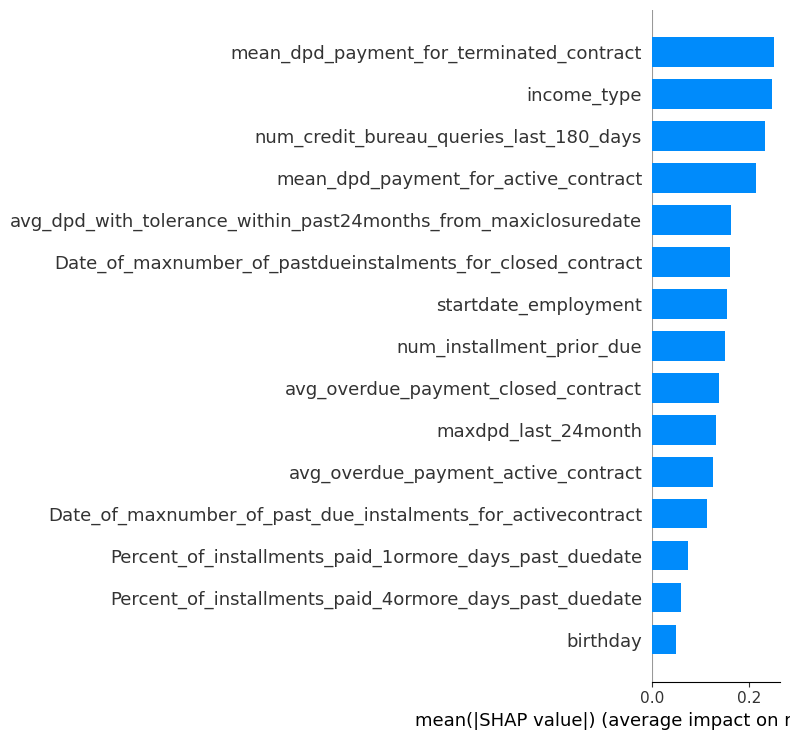

In [104]:
import shap
explainer = shap.TreeExplainer(lgb_model)
shap_values = explainer.shap_values(X)
shap.summary_plot(shap_values, X, plot_type="bar")

In [112]:

feature_names = ['avg_overdue_payment_active_contract',
       'Date_of_maxnumber_of_past_due_instalments_for_activecontract',
       'birthday', 'startdate_employment',
       'Percent_of_installments_paid_4ormore_days_past_duedate',
       'Percent_of_installments_paid_1ormore_days_past_duedate',
       'mean_dpd_payment_for_terminated_contract',
       'Date_of_maxnumber_of_pastdueinstalments_for_closed_contract',
       'income_type', 'maxdpd_last_24month', 'num_installment_prior_due',
       'avg_dpd_with_tolerance_within_past24months_from_maxiclosuredate',
       'mean_dpd_payment_for_active_contract',
       'num_credit_bureau_queries_last_180_days',
       'avg_overdue_payment_closed_contract']




In [111]:
X.columns

Index(['avg_overdue_payment_active_contract',
       'Date_of_maxnumber_of_past_due_instalments_for_activecontract',
       'birthday', 'startdate_employment',
       'Percent_of_installments_paid_4ormore_days_past_duedate',
       'Percent_of_installments_paid_1ormore_days_past_duedate',
       'mean_dpd_payment_for_terminated_contract',
       'Date_of_maxnumber_of_pastdueinstalments_for_closed_contract',
       'income_type', 'maxdpd_last_24month', 'num_installment_prior_due',
       'avg_dpd_with_tolerance_within_past24months_from_maxiclosuredate',
       'mean_dpd_payment_for_active_contract',
       'num_credit_bureau_queries_last_180_days',
       'avg_overdue_payment_closed_contract'],
      dtype='object')

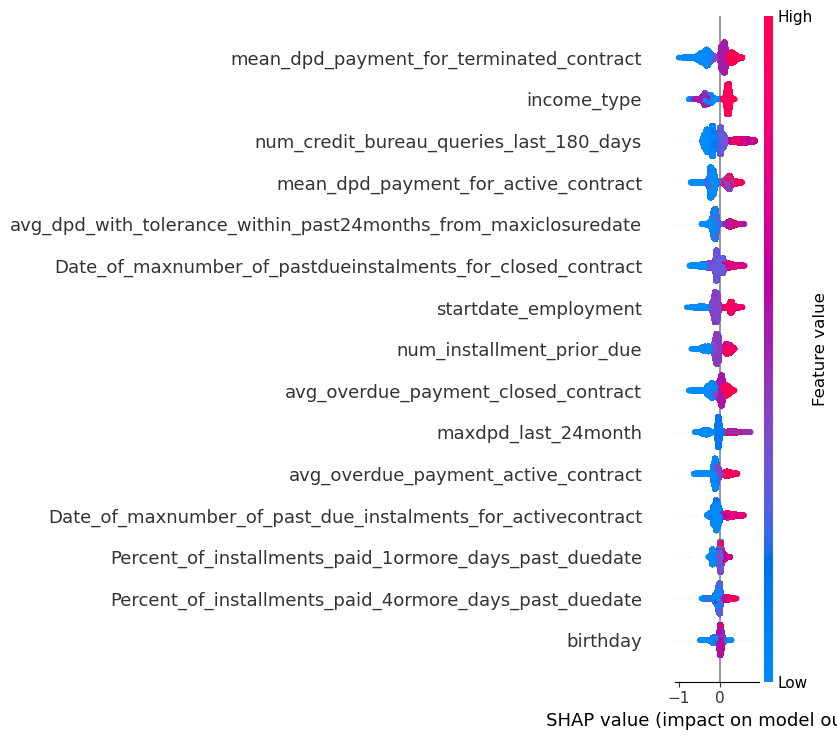

In [119]:
plt.figure(figsize=(40, 20))  # Width, height in inches

# Generate the SHAP summary plot
shap.summary_plot(shap_values, X)
plt.show()

light gbm without oversampling

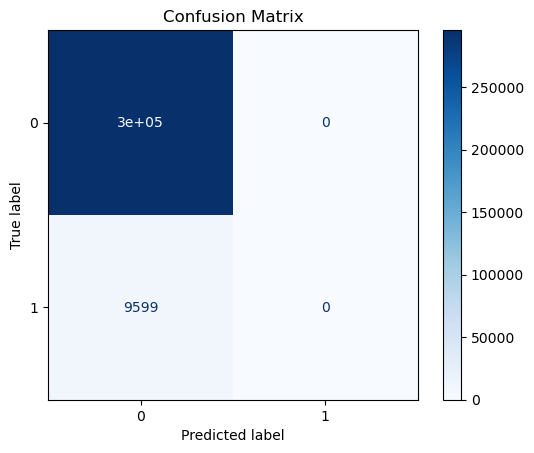

AUC Score for this fold: 0.7681482037403449
Accuracy for this fold: 0.9685620897907851
Precision for this fold: 0.0
Recall for this fold: 0.0
F1 Score for this fold: 0.0


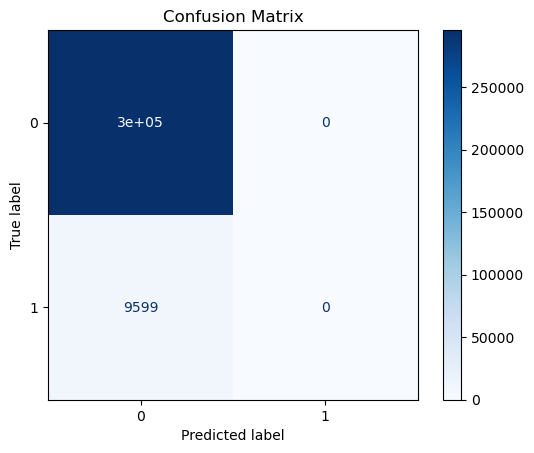

AUC Score for this fold: 0.7727057742248106
Accuracy for this fold: 0.9685620897907851
Precision for this fold: 0.0
Recall for this fold: 0.0
F1 Score for this fold: 0.0


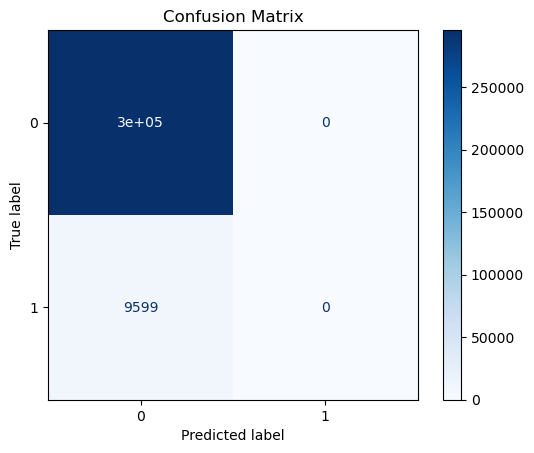

AUC Score for this fold: 0.7695647358949487
Accuracy for this fold: 0.9685620897907851
Precision for this fold: 0.0
Recall for this fold: 0.0
F1 Score for this fold: 0.0


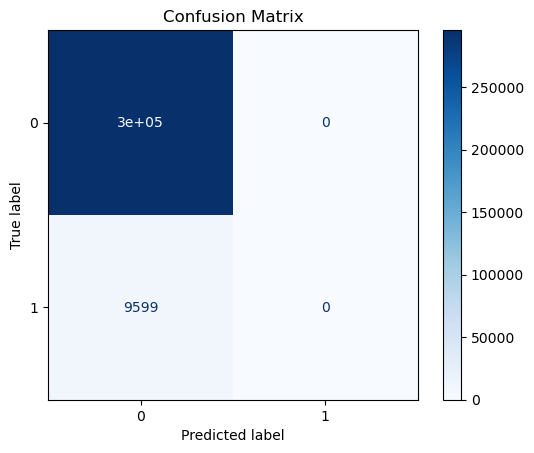

AUC Score for this fold: 0.7672397987681628
Accuracy for this fold: 0.9685620897907851
Precision for this fold: 0.0
Recall for this fold: 0.0
F1 Score for this fold: 0.0


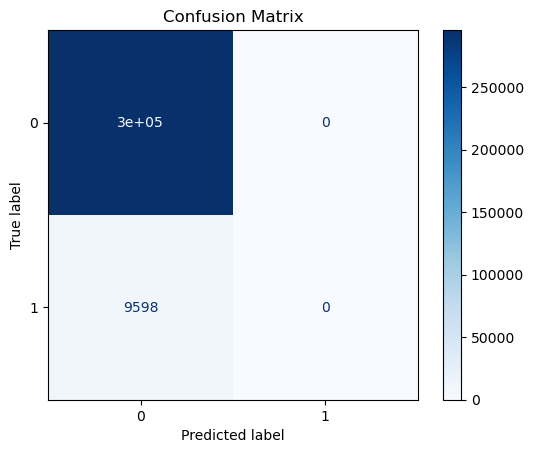

AUC Score for this fold: 0.7683461671346037
Accuracy for this fold: 0.9685652619616089
Precision for this fold: 0.0
Recall for this fold: 0.0
F1 Score for this fold: 0.0
Average CV AUC Score: 0.769200935952574
Average CV Accuracy Score: 0.9685627242249499
Average CV Precision Score: 0.0
Average CV Recall Score: 0.0
Average CV F1 Score: 0.0


In [99]:
from sklearn.metrics import (
    accuracy_score, roc_auc_score, confusion_matrix, 
    precision_score, recall_score, f1_score, ConfusionMatrixDisplay
)
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import RandomOverSampler
import matplotlib.pyplot as plt
import numpy as np

# 假设 df_smote_wOsex_walter 是包含数据的 DataFrame
y = df_smote_wOsex_walter['target']

X = df_smote_wOsex_walter.drop(columns=['target'])
params = {
    "boosting_type": "gbdt",
    "objective": "binary",
    "metric": "auc",
    "max_depth": 10,  
    "learning_rate": 0.09,
    "n_estimators": 400,  
    "colsample_bytree": 0.6,
    "colsample_bynode": 0.8,
    "verbose": -1,
    "random_state": 43,
    "reg_alpha": 0.1,
    "reg_lambda": 10,
    "extra_trees":True,
    'num_leaves':64, 
    "verbose": -1,
}
# 定义 CatBoost 分类器
lgb_model = lgb.LGBMClassifier(**params)

# 为交叉验证设置参数
n_splits = 5
kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# 用于存储每一折的评估指标
cv_scores = {
    'auc': [],
    'accuracy': [],
    'precision': [],
    'recall': [],
    'f1': []
}

# 执行交叉验证
for train_index, test_index in kf.split(X, y):
    X_train_fold, X_valid_fold = X.iloc[train_index], X.iloc[test_index]
    y_train_fold, y_valid_fold = y.iloc[train_index], y.iloc[test_index]


    X_train_ros, y_train_ros = X_train_fold, y_train_fold
    
    # 在过采样数据上拟合模型
    lgb_model.fit(X_train_ros, y_train_ros, eval_set=(X_valid_fold, y_valid_fold))
    
    # 预测概率并转换为类标签
    y_pred_proba = lgb_model.predict_proba(X_valid_fold)[:, 1]
    y_pred_labels = (y_pred_proba > 0.5).astype(int)
    
    # 计算评估指标
    auc = roc_auc_score(y_valid_fold, y_pred_proba)
    accuracy = accuracy_score(y_valid_fold, y_pred_labels)
    precision = precision_score(y_valid_fold, y_pred_labels)
    recall = recall_score(y_valid_fold, y_pred_labels)
    f1 = f1_score(y_valid_fold, y_pred_labels)
    
    # 保存指标结果
    cv_scores['auc'].append(auc)
    cv_scores['accuracy'].append(accuracy)
    cv_scores['precision'].append(precision)
    cv_scores['recall'].append(recall)
    cv_scores['f1'].append(f1)
    
    # 显示混淆矩阵
    cm = confusion_matrix(y_valid_fold, y_pred_labels)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.show()

    # 打印这一折的指标结果
    print(f"AUC Score for this fold: {auc}")
    print(f"Accuracy for this fold: {accuracy}")
    print(f"Precision for this fold: {precision}")
    print(f"Recall for this fold: {recall}")
    print(f"F1 Score for this fold: {f1}")

# 打印所有折的平均指标分数
print("Average CV AUC Score:", np.mean(cv_scores['auc']))
print("Average CV Accuracy Score:", np.mean(cv_scores['accuracy']))
print("Average CV Precision Score:", np.mean(cv_scores['precision']))
print("Average CV Recall Score:", np.mean(cv_scores['recall']))
print("Average CV F1 Score:", np.mean(cv_scores['f1']))


lightGBM all 442 features with oversampling

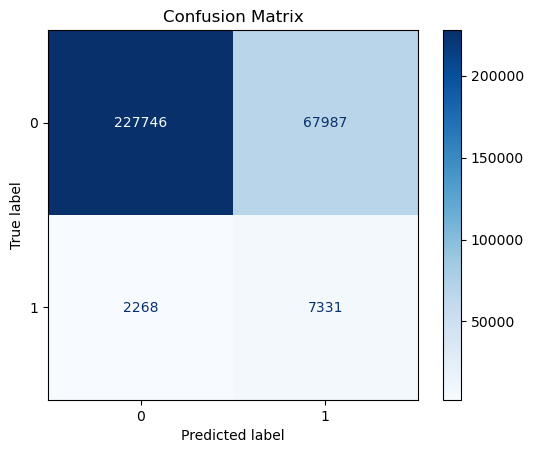

AUC Score for this fold: 0.8484655333659566
Accuracy for this fold: 0.7699062004637575
Precision for this fold: 0.09733397063119043
Recall for this fold: 0.7637253880612563
F1 Score for this fold: 0.17266271771258995


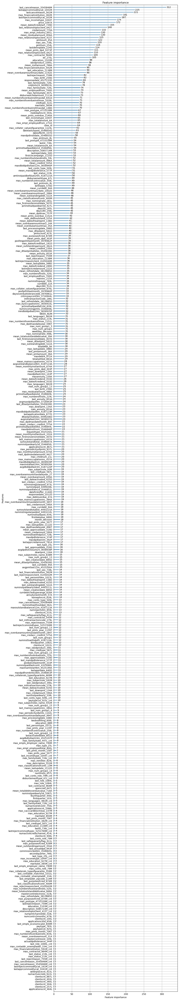

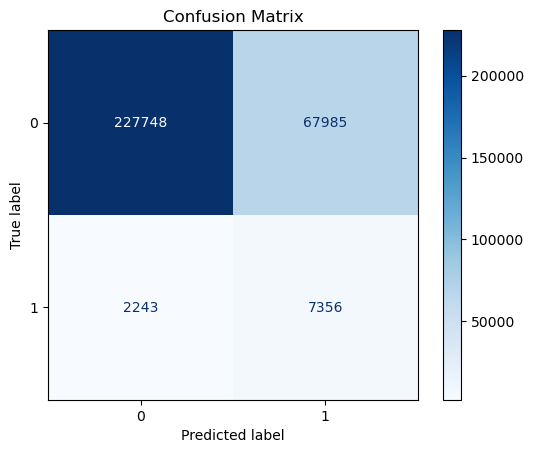

AUC Score for this fold: 0.8500981854432728
Accuracy for this fold: 0.7699946287975057
Precision for this fold: 0.09763608128376315
Recall for this fold: 0.7663298260235442
F1 Score for this fold: 0.17320461502236872


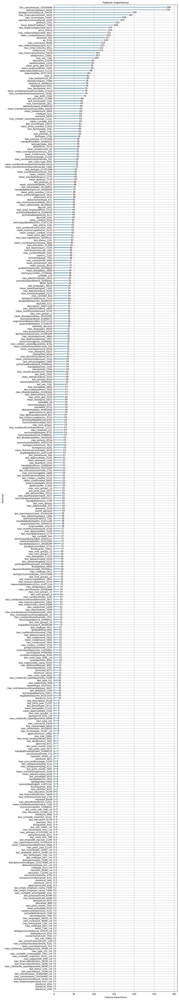

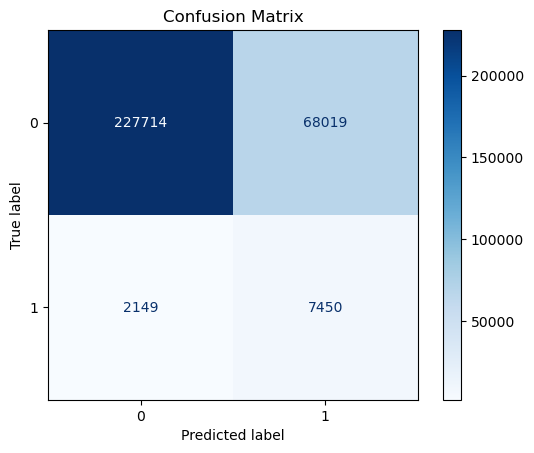

AUC Score for this fold: 0.8517359374926041
Accuracy for this fold: 0.770191136205835
Precision for this fold: 0.09871602909804025
Recall for this fold: 0.776122512761746
F1 Score for this fold: 0.17515399445149762


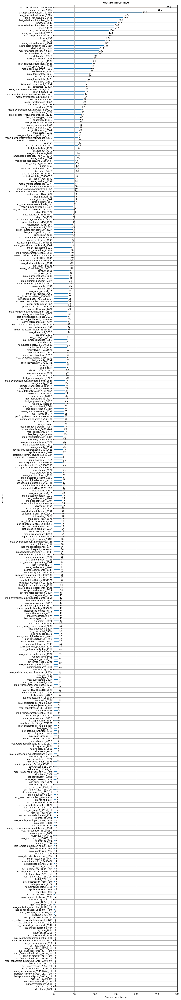

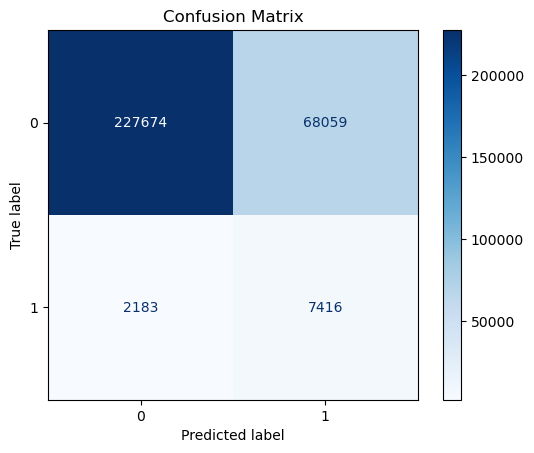

AUC Score for this fold: 0.8506261781219372
Accuracy for this fold: 0.7699487770688955
Precision for this fold: 0.09825770122557138
Recall for this fold: 0.7725804771330347
F1 Score for this fold: 0.17434233725932718


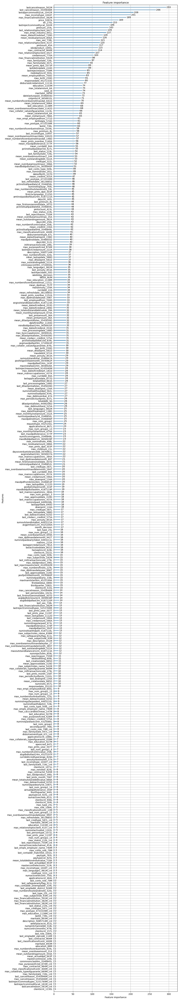

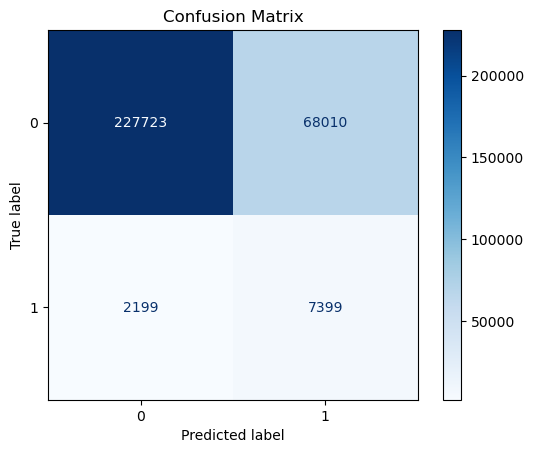

AUC Score for this fold: 0.8512612136852237
Accuracy for this fold: 0.7700561030488224
Precision for this fold: 0.09811826174594544
Recall for this fold: 0.7708897687018129
F1 Score for this fold: 0.17407978166503935


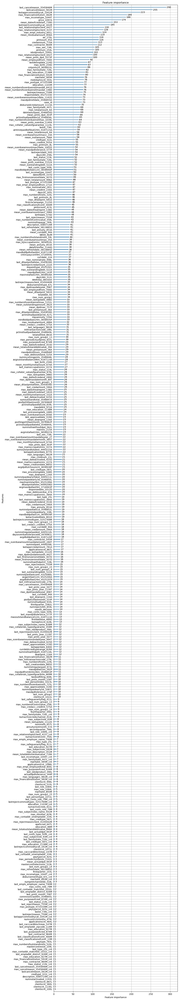

Average CV AUC Score: 0.8504374096217988
Average CV Accuracy Score: 0.7700193691169632
Average CV Precision Score: 0.09801240879690214
Average CV Recall Score: 0.7699295945362788
Average CV F1 Score: 0.17388868922216455


In [97]:
from sklearn.metrics import (
    accuracy_score, roc_auc_score, confusion_matrix, 
    precision_score, recall_score, f1_score, ConfusionMatrixDisplay
)
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import RandomOverSampler
import matplotlib.pyplot as plt
import numpy as np

# 假设 df_smote_wOsex_walter 是包含数据的 DataFrame
y = df_train['target']
X = df_train.drop(columns=['target'])
params = {
    "boosting_type": "gbdt",
    "objective": "binary",
    "metric": "auc",
    "max_depth": 8,  
    "learning_rate": 0.1,
    "n_estimators": 200,  
    "colsample_bytree": 0.6,
    "colsample_bynode": 0.8,
    "verbose": -1,
    "random_state": 43,
    "reg_alpha": 0.1,
    "reg_lambda": 10,
    "extra_trees":True,
    'num_leaves':60, 
    "verbose": -1,
}
# 定义 CatBoost 分类器
lgb_model = lgb.LGBMClassifier(**params)

# 为交叉验证设置参数
n_splits = 5
kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
ros = RandomOverSampler(random_state=42)  # 随机过采样器，用于处理数据不平衡

# 用于存储每一折的评估指标
cv_scores = {
    'auc': [],
    'accuracy': [],
    'precision': [],
    'recall': [],
    'f1': []
}

# 执行交叉验证
for train_index, test_index in kf.split(X, y):
    X_train_fold, X_valid_fold = X.iloc[train_index], X.iloc[test_index]
    y_train_fold, y_valid_fold = y.iloc[train_index], y.iloc[test_index]

    # 对训练数据应用 RandomOverSampler
    X_train_ros, y_train_ros = ros.fit_resample(X_train_fold, y_train_fold)
    
    # 在过采样数据上拟合模型
    lgb_model.fit(X_train_ros, y_train_ros, eval_set=(X_valid_fold, y_valid_fold))
    
    # 预测概率并转换为类标签
    y_pred_proba = lgb_model.predict_proba(X_valid_fold)[:, 1]
    y_pred_labels = (y_pred_proba > 0.5).astype(int)
    
    # 计算评估指标
    auc = roc_auc_score(y_valid_fold, y_pred_proba)
    accuracy = accuracy_score(y_valid_fold, y_pred_labels)
    precision = precision_score(y_valid_fold, y_pred_labels)
    recall = recall_score(y_valid_fold, y_pred_labels)
    f1 = f1_score(y_valid_fold, y_pred_labels)
    
    # 保存指标结果
    cv_scores['auc'].append(auc)
    cv_scores['accuracy'].append(accuracy)
    cv_scores['precision'].append(precision)
    cv_scores['recall'].append(recall)
    cv_scores['f1'].append(f1)
    
    # 显示混淆矩阵
    cm = confusion_matrix(y_valid_fold, y_pred_labels)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.show()

    # 打印这一折的指标结果
    print(f"AUC Score for this fold: {auc}")
    print(f"Accuracy for this fold: {accuracy}")
    print(f"Precision for this fold: {precision}")
    print(f"Recall for this fold: {recall}")
    print(f"F1 Score for this fold: {f1}")
    lgb.plot_importance(lgb_model, importance_type="split", figsize=(10, 80))
    plt.show()  
# 打印所有折的平均指标分数
print("Average CV AUC Score:", np.mean(cv_scores['auc']))
print("Average CV Accuracy Score:", np.mean(cv_scores['accuracy']))
print("Average CV Precision Score:", np.mean(cv_scores['precision']))
print("Average CV Recall Score:", np.mean(cv_scores['recall']))
print("Average CV F1 Score:", np.mean(cv_scores['f1']))


In [95]:
lgb_model

LGBMClassifier(colsample_bynode=0.8, colsample_bytree=0.6, extra_trees=True,
               max_depth=10, metric='auc', n_estimators=400, num_leaves=64,
               objective='binary', random_state=43, reg_alpha=0.1,
               reg_lambda=10, verbose=-1)

In [92]:
# 获取逻辑回归模型的系数

trained_model = lr_model
logistic_model = trained_model.named_steps['classifier']
logistic_coefs = logistic_model.coef_[0]
intercept = logistic_model.intercept_[0]

# 打印系数和截距
print("Coefficients:", logistic_coefs)
print("Intercept:", intercept)

# 设置评分卡参数
base_score = 600  # 暂定600
PDO = 20  # 暂定20，可以修改
factor = PDO / np.log(2)
offset = base_score - factor * np.log(20)  # 暂定20
X =     df_smote_wOsex_walter
X = X.rename(columns={'avgdpdtolclosure24_3658938P_woe': 'avg_dpd_with_tolerance_within_past24months_from_maxiclosuredate'
,'days180_256L_woe': 'num_credit_bureau_queries_last_180_days'
,'mean_pmts_overdue_1140A_woe': 'avg_overdue_payment_active_contract'
, 'mean_numberofoverdueinstlmaxdat_148D_woe': 'Date_of_maxnumber_of_pastdueinstalments_for_closed_contract'
, 'mean_pmts_dpd_303P_woe': 'mean_dpd_payment_for_terminated_contract'
, 'mean_pmts_dpd_1073P_woe': 'mean_dpd_payment_for_active_contract'
,'max_incometype_1044T_cnt_woe': 'income_type'
,'max_empl_employedfrom_271D_woe': 'startdate_employment'
,'mean_numberofoverdueinstlmaxdat_641D_woe': 'Date_of_maxnumber_of_past_due_instalments_for_activecontract'
,'max_birth_259D_woe': 'birthday'
,'numinstpaidearly_338L_woe': 'num_installment_prior_due'
, 'maxdpdlast24m_143P_woe': 'maxdpd_last_24month'
,'mean_pmts_overdue_1152A_woe': 'avg_overdue_payment_closed_contract'
,'pctinstlsallpaidlate1d_3546856L_woe': 'Percent_of_installments_paid_1ormore_days_past_duedate'
,'pctinstlsallpaidlate4d_3546849L_woe': 'Percent_of_installments_paid_4ormore_days_past_duedate'})
X_train, X_test, y_train, y_test = train_test_split(
        X , y, test_size=0.1, random_state=66)
# 计算特征得分
X_test1 = X_test.copy()
X_train = X_train.drop(columns = ['target'])
X_test = X_test.drop(columns = ['target'])
feature_names = X_train.columns
scores = pd.Series(logistic_coefs, index=feature_names) * factor

feature_names = X_train.columns  # X_test 中的特征名称
scorecard = pd.DataFrame({'Feature': feature_names, 'Score': logistic_coefs * factor})
scorecard['Score'] = scorecard['Score'].round(0)  # 分数四舍五入到整数

# 计算截距对应的分数
intercept_score = offset + intercept * factor

# 将截距分数添加到 DataFrame 中
scorecard.loc[len(scorecard)] = ['Intercept', intercept_score]

# 计算新样本的信用评分，确保不将截距用于点乘
# 分离出截距外的评分
feature_scores = scorecard[scorecard['Feature'] != 'Intercept']['Score']
#oversample_X_test = X_test.copy()
RandomOverSampler(random_state=42)
oversample_X_test = X_test.copy()
oversample_y_test = y_test.copy()
oversample_X_test, oversample_y_test = ros.fit_resample(oversample_X_test, oversample_y_test)

# 点乘 X_test 的特征和相应的分数
oversample_X_test['Score'] = np.dot(oversample_X_test[feature_names], feature_scores) + intercept_score

oversample_X_test['Score']

from sklearn.metrics import f1_score

thresholds = np.linspace(start=min(oversample_X_test['Score']), stop=max(oversample_X_test['Score']), num=100)
best_f1 = 0
best_threshold = 0


Coefficients: [0.1224164  0.0366546  0.08839178 0.22081563 0.04316877 0.02081877
 0.23592958 0.14540517 0.17144155 0.16036058 0.19525698 0.14603499
 0.20233959 0.25536387 0.09160695]
Intercept: -0.4298856342477444


In [98]:
scorecard

,Feature,Score
0,avg_overdue_payment_active_contract,4.000000
1,Date_of_maxnumber_of_past_due_instalments_for_...,1.000000
2,birthday,3.000000
3,startdate_employment,6.000000
4,Percent_of_installments_paid_4ormore_days_past...,1.000000
5,Percent_of_installments_paid_1ormore_days_past...,1.000000
6,mean_dpd_payment_for_terminated_contract,7.000000
7,Date_of_maxnumber_of_pastdueinstalments_for_cl...,4.000000
8,income_type,5.000000
9,maxdpd_last_24month,5.000000


In [93]:
feature_names

Index(['avg_overdue_payment_active_contract',
       'Date_of_maxnumber_of_past_due_instalments_for_activecontract',
       'birthday', 'startdate_employment',
       'Percent_of_installments_paid_4ormore_days_past_duedate',
       'Percent_of_installments_paid_1ormore_days_past_duedate',
       'mean_dpd_payment_for_terminated_contract',
       'Date_of_maxnumber_of_pastdueinstalments_for_closed_contract',
       'income_type', 'maxdpd_last_24month', 'num_installment_prior_due',
       'avg_dpd_with_tolerance_within_past24months_from_maxiclosuredate',
       'mean_dpd_payment_for_active_contract',
       'num_credit_bureau_queries_last_180_days',
       'avg_overdue_payment_closed_contract'],
      dtype='object')

最佳阈值: 495.08793014095005, 最佳F1得分: 0.721024622903059
最佳阈值对应的 AUC 值: 0.6787796399247927


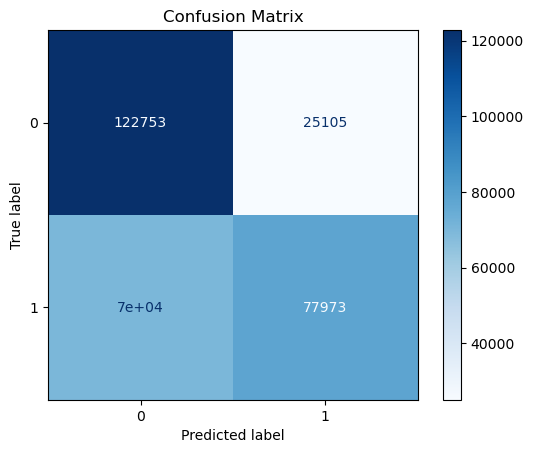

In [94]:
for threshold in thresholds:
    # 根据阈值预测新样本是否为好客户（'0'表示好，'1'表示坏）
    predictions = (oversample_X_test['Score'] > threshold).astype(int)
    current_accuracy = accuracy_score(oversample_y_test, predictions)
    
    # 如果准确度高于上限，则跳过当前迭代
    if current_accuracy > 0.75:
        continue
    
    # 计算F1分数
    current_f1 = f1_score(oversample_y_test, predictions, pos_label=1)
    
    # 如果当前F1分数更优，则更新最佳F1分数和阈值
    if current_f1 > best_f1:
        best_f1 = current_f1
        best_threshold = threshold
        best_predictions = predictions  # 保存最佳预测结果用于混淆矩阵和AUC的计算

# 最终选择的最佳阈值和对应的F1得分
print(f'最佳阈值: {best_threshold}, 最佳F1得分: {best_f1}')

# 计算最佳阈值对应的 AUC 值
best_auc = roc_auc_score(oversample_y_test, best_predictions)
print(f'最佳阈值对应的 AUC 值: {best_auc}')

# 绘制混淆矩阵
cm = confusion_matrix(oversample_y_test, best_predictions)

# 将 TP 和 TN 的位置互换，同时交换 FP 和 FN
cm_transposed = cm.copy()
cm_transposed[0, 0], cm_transposed[1, 1] = cm[1, 1], cm[0, 0]
cm_transposed[0, 1], cm_transposed[1, 0] = cm[1, 0], cm[0, 1]

# 使用 ConfusionMatrixDisplay 显示转置后的混淆矩阵
disp = ConfusionMatrixDisplay(confusion_matrix=cm_transposed)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

In [41]:
X

,mean_pmts_overdue_1140A_woe,mean_numberofoverdueinstlmaxdat_641D_woe,max_birth_259D_woe,max_empl_employedfrom_271D_woe,pctinstlsallpaidlate4d_3546849L_woe,pctinstlsallpaidlate1d_3546856L_woe,mean_pmts_dpd_303P_woe,mean_numberofoverdueinstlmaxdat_148D_woe,max_incometype_1044T_cnt_woe,maxdpdlast24m_143P_woe,numinstpaidearly_338L_woe,avgdpdtolclosure24_3658938P_woe,mean_pmts_dpd_1073P_woe,days180_256L_woe,mean_pmts_overdue_1152A_woe
0,0.058145,-0.295824,0.050180,0.477829,-0.073906,-0.075837,-0.001084,-0.203059,-0.133298,-0.17792,-0.083777,-0.065876,0.057902,0.039417,-0.001109
1,0.058145,-0.295824,-0.540805,-0.477942,-0.073906,-0.075837,-0.001084,-0.203059,-0.133298,-0.17792,-0.083777,-0.065876,0.057902,0.039417,-0.001109
2,0.058145,-0.295824,0.050180,-0.054047,-0.073906,-0.075837,-0.001084,-0.203059,0.158360,-0.17792,-0.083777,-0.065876,0.057902,0.039417,-0.001109
3,0.058145,-0.295824,0.488725,0.477829,-0.073906,-0.075837,-0.001084,-0.203059,0.158360,-0.17792,-0.083777,-0.065876,0.057902,0.039417,-0.001109
4,0.058145,-0.295824,0.488725,0.260100,-0.073906,-0.075837,-0.001084,-0.203059,0.158360,-0.17792,-0.083777,-0.065876,0.057902,0.039417,-0.001109
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1526654,-0.440972,-0.295824,-0.540805,-0.102202,-0.487460,-0.609562,-0.212746,-0.672960,-0.556503,-0.17792,-0.580711,-0.496113,-0.444969,-0.290333,-0.782143
1526655,-0.440972,-0.295824,-0.540805,-0.102202,-0.487460,-0.609562,-0.759893,-0.203059,-0.556503,-0.17792,-0.580711,-0.496113,-0.444969,-0.290333,-0.782143
1526656,0.071878,0.532317,0.050180,-0.102202,-0.121172,0.420679,-0.759893,-0.203059,0.222649,0.28276,-0.152947,0.372260,0.803228,-0.141359,-0.782143
1526657,-0.440972,-0.295824,-0.540805,-0.102202,-0.121172,-0.080544,-0.759893,-0.151197,-0.556503,-0.17792,-0.580711,-0.496113,-0.444969,-0.141359,-0.235204


In [47]:
from sklearn.model_selection import StratifiedKFold, cross_val_score, train_test_split,cross_val_predict
from imblearn.over_sampling import RandomOverSampler
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from sklearn.metrics import confusion_matrix


def cross_validate_model_oversample(X, y):
    df_list = [col for col in X.columns]
    # 定义过采样和模型训练的管道
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', SimpleImputer(strategy='median'), df_list),
        ])
    
    # Defining the imbalanced-learn pipeline with oversampling and logistic regression
    pipeline = ImbPipeline([
        ('preprocessor', preprocessor),
        ('oversample', RandomOverSampler(random_state=42)),
        ('classifier', LogisticRegression())
    ])
    
    # 定义分层K折交叉验证
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    model = pipeline.fit(X, y)
    # 计算交叉验证的分数
    scores = cross_val_score(pipeline, X, y, cv=cv, scoring='accuracy')
    predicted = cross_val_predict(pipeline, X, y, cv=cv)
    
    # 计算混淆矩阵
    cm = confusion_matrix(y, predicted)
    sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()
    
    return scores, model


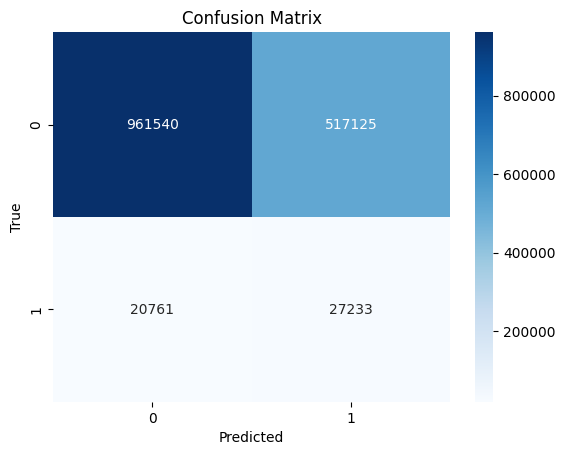

CV AUC scores raw_data 15 pre_bin with oversample: [0.64743296 0.64778667 0.65406836 0.65155961 0.63750815]
Average CV AUC score raw_data 15 pre_bin with oversample: 0.6476711497701826


In [49]:
# raw_data 15 pre_bin   
y = df_smote_woe['target']

df_smote_pre_bin = df_smote_pre.drop(columns=['target'])
X_train, X_test, y_train, y_test = train_test_split(
        df_smote_pre_bin, y, test_size=0.1, random_state=66)


#
scores= cross_validate_model_oversample(df_smote_pre_bin, y)
# print("CV AUC scores raw_data 15 pre_bin with oversample:", scores)
# print("Average CV AUC score raw_data 15 pre_bin with oversample:", scores.mean())

# 假设scores是这样的结构：(auc_scores_list, ...)
auc_scores = scores[0]  # 获取AUC分数的列表
average_auc_score = np.mean(auc_scores)  # 计算平均AUC分数
print("CV AUC scores raw_data 15 pre_bin with oversample:", auc_scores)
print("Average CV AUC score raw_data 15 pre_bin with oversample:", average_auc_score)


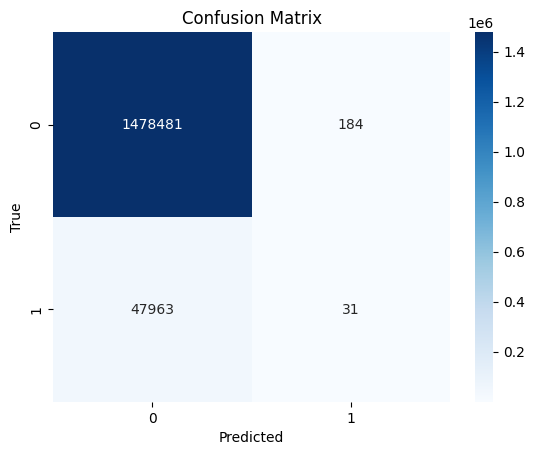

CV AUC scores raw_data 15 pre_bin with oversample: [0.96845729 0.96844746 0.96848676 0.96847366 0.96844736]
Average CV AUC score raw_data 15 pre_bin with oversample: 0.9684625053694713


In [50]:
df_smote_pre_bin = df_smote_pre.drop(columns=['target'])
X_train, X_test, y_train, y_test = train_test_split(
        df_smote_pre_bin, y, test_size=0.1, random_state=66)


#
scores= cross_validate_model(df_smote_pre_bin, y)
print("CV AUC scores raw_data 15 pre_bin with oversample:", scores)
print("Average CV AUC score raw_data 15 pre_bin with oversample:", scores.mean())

In [51]:
df_2 = df_smote_wsex_wOalter.drop(columns=['target'])
X_train, X_test, y_train, y_test = train_test_split(
        df_2, y, test_size=0.1, random_state=66)


#
scores= cross_validate_model(df_2, y)
print("CV AUC scores df_smote_wsex_wOalter bin NO oversample:", scores)
print("Average CV AUC score df_smote_wsex_wOalter bin NO oversample:", scores.mean())

NameError: name 'df_smote_wsex_wOalter' is not defined

In [52]:
df_2 = df_smote_wsex_wOalter.drop(columns=['target'])
X_train, X_test, y_train, y_test = train_test_split(
        df_2, y, test_size=0.1, random_state=66)


#
scores= cross_validate_model_oversample(df_2, y)
print("CV AUC scores df_smote_wsex_wOalter bin oversample:", scores)
print("Average CV AUC score df_smote_wsex_wOalter bin oversample:", scores.mean())

NameError: name 'df_smote_wsex_wOalter' is not defined

df_smote_wOsex_wOalter = df_smote_woe[select_smote_wOsex_wOalter]
df_smote_wsex_walter = df_smote_woe
df_smote_wsex_wOalter = df_smote_woe.drop(columns=['mean_employedfrom_700D_woe', 'max_incometype_1044T_cnt_woe'])
df_smote_wOsex_walter = df_smote_woe.drop(columns=['max_sex_738L_woe'])

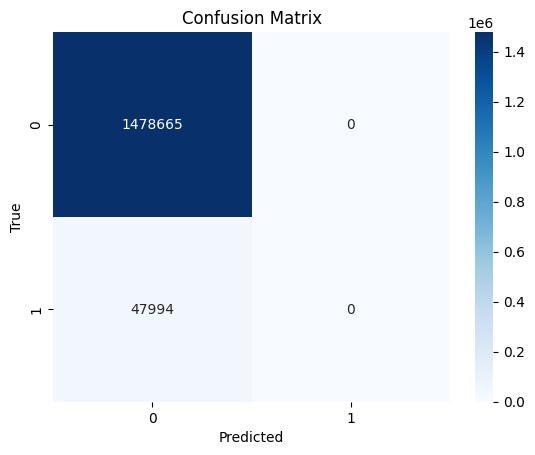

CV AUC scores df_smote_wOsex_wOalter bin NO oversample: [0.96856209 0.96856209 0.96856209 0.96856209 0.96856526]
Average CV AUC score df_smote_wOsex_wOalter bin NO oversample: 0.9685627242249499


In [53]:
df_2 = df_smote_wOsex_wOalter.drop(columns=['target'])
X_train, X_test, y_train, y_test = train_test_split(
        df_2, y, test_size=0.1, random_state=66)


#
scores= cross_validate_model(df_2, y)
print("CV AUC scores df_smote_wOsex_wOalter bin NO oversample:", scores)
print("Average CV AUC score df_smote_wOsex_wOalter bin NO oversample:", scores.mean())

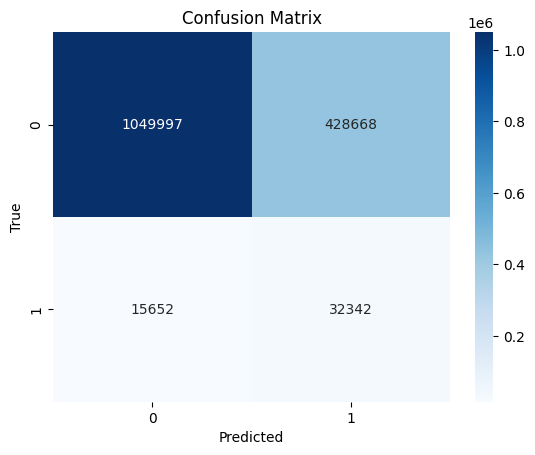

CV AUC scores df_smote_wOsex_wOalter bin oversample: [0.70849109 0.71007624 0.70862537 0.70849764 0.70910586]
Average CV AUC score df_smote_wOsex_wOalter bin oversample: 0.7089592372275788


In [55]:
df_2 = df_smote_wOsex_wOalter.drop(columns=['target'])
X_train, X_test, y_train, y_test = train_test_split(
        df_2, y, test_size=0.1, random_state=66)


#
scores= cross_validate_model_oversample(df_2, y)
scores_list = scores[0]  # Assuming the first element of the tuple is the list of scores.
average_score = np.mean(scores_list)
print("CV AUC scores df_smote_wOsex_wOalter bin oversample:",scores_list)
print("Average CV AUC score df_smote_wOsex_wOalter bin oversample:", average_score)

# print("CV AUC scores df_smote_wOsex_wOalter bin oversample:", scores)
# print("Average CV AUC score df_smote_wOsex_wOalter bin oversample:", scores.mean())

In [56]:
df_2 = df_smote_wsex_wOalter.drop(columns=['target'])
X_train, X_test, y_train, y_test = train_test_split(
        df_2, y, test_size=0.1, random_state=66)


#
scores= cross_validate_model(df_2, y)
print("CV AUC scores df_smote_wsex_wOalter bin NO oversample:", scores)
print("Average CV AUC score df_smote_wsex_wOalter bin NO oversample:", scores.mean())

NameError: name 'df_smote_wsex_wOalter' is not defined

In [57]:
df_2 = df_smote_wsex_wOalter.drop(columns=['target'])
X_train, X_test, y_train, y_test = train_test_split(
        df_2, y, test_size=0.1, random_state=66)


#
scores= cross_validate_model_oversample(df_2, y)
print("CV AUC scores df_smote_wsex_wOalter bin oversample:", scores)
print("Average CV AUC score df_smote_wsex_wOalter bin oversample:", scores.mean())

NameError: name 'df_smote_wsex_wOalter' is not defined

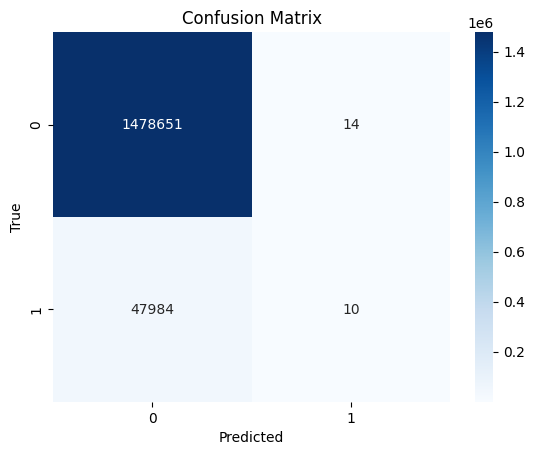

CV AUC scores df_smote_wOsex_walter bin NO oversample: [0.96855881 0.96855881 0.96856536 0.96855226 0.96856526]
Average CV AUC score df_smote_wOsex_walter bin NO oversample: 0.9685601041261721


In [60]:
df_2 = df_smote_wOsex_walter.drop(columns=['target'])
X_train, X_test, y_train, y_test = train_test_split(
        df_2, y, test_size=0.1, random_state=66)


#
scores= cross_validate_model(df_2, y)
# scores_list = scores[0]  # Assuming the first element of the tuple is the list of scores.
# average_score = np.mean(scores_list)
# print("CV AUC scores df_smote_wOsex_walter bin NO oversample:", scores_list)
# print("Average CV AUC score df_smote_wOsex_walter bin NO oversample:", average_score )

print("CV AUC scores df_smote_wOsex_walter bin NO oversample:", scores)
print("Average CV AUC score df_smote_wOsex_walter bin NO oversample:", scores.mean())

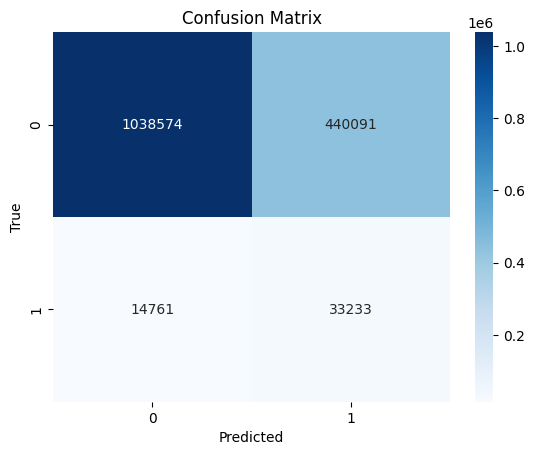

CV AUC scores df_smote_wOsex_walter bin oversample: [0.70081747 0.70278582 0.70193756 0.70283822 0.70192349]
Average CV AUC score df_smote_wOsex_walter bin oversample: 0.7020605124412026


In [59]:
df_2 = df_smote_wOsex_walter.drop(columns=['target'])
X_train, X_test, y_train, y_test = train_test_split(
        df_2, y, test_size=0.1, random_state=66)


#
scores, logistic_regression_model= cross_validate_model_oversample(df_2, y)
print("CV AUC scores df_smote_wOsex_walter bin oversample:", scores)
print("Average CV AUC score df_smote_wOsex_walter bin oversample:", scores.mean())

In [61]:
col_meow = X_train.columns
col_meow

Index(['mean_numberofoverdueinstlmaxdat_641D_woe', 'days180_256L_woe',
       'max_birth_259D_woe', 'mean_pmts_dpd_303P_woe',
       'max_empl_employedfrom_271D_woe', 'pctinstlsallpaidlate4d_3546849L_woe',
       'mean_pmts_dpd_1073P_woe', 'avgdpdtolclosure24_3658938P_woe',
       'mean_numberofoverdueinstlmaxdat_148D_woe', 'maxdpdlast24m_143P_woe',
       'pctinstlsallpaidlate1d_3546856L_woe', 'mean_pmts_overdue_1140A_woe',
       'max_incometype_1044T_cnt_woe', 'mean_pmts_overdue_1152A_woe',
       'numinstpaidearly_338L_woe'],
      dtype='object')

In [62]:
pipeline

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  Index(['mean_numberofoverdueinstlmaxdat_641D_woe', 'days180_256L_woe',
       'max_birth_259D_woe', 'mean_pmts_dpd_303P_woe',
       'max_empl_employedfrom_271D_woe', 'pctinstlsallpaidlate4d_3546849L_woe',
       'mean_pmts_dpd_1073P_woe', 'avg...',
       'mean_numberofoverdueinstlmaxdat_148D_woe', 'maxdpdlast24m_143P_woe',
       'pctinstlsallpaidlate1d_3546856L_woe', 'mean_pmts_overdue_1140A_woe',
       'max_incometype_1044T_cnt_woe', 'mean_pmts_overdue_1152A_woe',
       'numinstpaidearly_338L_woe'],
      dtype='object'))])),
                ('oversample', RandomOverSampler(random_state=42)),
                ('classifier', LogisticRegression(random_state=42))])

In [63]:
# 获取逻辑回归模型的系数
"""['max_incometype_1044T_cnt_woe', 'mean_pmts_dpd_303P_woe',
       'mean_pmts_overdue_1152A_woe', 'lastcancelreason_561M_cnt_woe',
       'max_birth_259D_woe', 'mean_employedfrom_700D_woe',
       'avgdpdtolclosure24_3658938P_woe', 'maxdpdlast24m_143P_woe',
       'mean_pmts_dpd_1073P_woe', 'pctinstlsallpaidlate1d_3546856L_woe',
       'maxdbddpdtollast12m_3658940P_woe', 'lastrejectreason_759M_cnt_woe',
       'max_numberofoverdueinstlmax_1039L_woe', 'lastrejectdate_50D_woe']"""
logistic_model = pipeline.named_steps['classifier']
logistic_coefs = logistic_model.coef_[0]
intercept = logistic_model.intercept_[0]

# 打印系数和截距
print("Coefficients:", logistic_coefs)
print("Intercept:", intercept)

# 设置评分卡参数
base_score = 600  # 暂定600
PDO = 20  # 暂定20，可以修改
factor = PDO / np.log(2)
offset = base_score - factor * np.log(20)  # 暂定20

# 计算特征得分
feature_names = X_train.columns
scores = pd.Series(logistic_coefs, index=feature_names) * factor

Coefficients: [0.09223816 0.8410801  0.26253611 0.44603212 0.908302   0.10987744
 0.4542333  0.32804774 0.40572232 0.40733834 0.02154746 0.25773019
 0.60699871 0.14440608 0.59335686]
Intercept: -0.00778678562125614


In [64]:
feature_names = X_train.columns  # X_test 中的特征名称
scorecard = pd.DataFrame({'Feature': feature_names, 'Score': logistic_coefs * factor})
scorecard['Score'] = scorecard['Score'].round(0)  # 分数四舍五入到整数

# 计算截距对应的分数
intercept_score = offset + intercept * factor

# 将截距分数添加到 DataFrame 中
scorecard.loc[len(scorecard)] = ['Intercept', intercept_score]

# 计算新样本的信用评分，确保不将截距用于点乘
# 分离出截距外的评分
feature_scores = scorecard[scorecard['Feature'] != 'Intercept']['Score']

# 点乘 X_test 的特征和相应的分数
X_test['Score'] = np.dot(X_test[feature_names], feature_scores) + intercept_score


In [65]:
X_test['Score']

692809     502.579566
1002937    480.978358
235540     507.598404
989213     483.160272
239964     514.525639
              ...    
271496     489.390379
918060     484.481179
1412120    445.621186
1385490    474.796045
1328061    567.636283
Name: Score, Length: 152666, dtype: float64

In [66]:
from sklearn.metrics import f1_score

thresholds = np.linspace(start=min(X_test['Score']), stop=max(X_test['Score']), num=100)
best_f1 = 0
best_threshold = 0

for threshold in thresholds:
    # 根据阈值预测新样本是否为好客户（'0'表示好，'1'表示坏）
    X_test['Predicted'] = X_test['Score'].apply(lambda x: 0 if x >= threshold else 1)
    f1 = f1_score(y_test, X_test['Predicted'], pos_label=1)  # 确保违约类别标记为1
    if f1 > best_f1:
        best_f1 = f1
        best_threshold = threshold

print(f'最佳阈值: {best_threshold}, 最佳F1得分: {best_f1}')


最佳阈值: 625.3870384943823, 最佳F1得分: 0.06106443644307278


In [67]:
thresholds = np.linspace(start=min(X_test['Score']), stop=max(X_test['Score']), num=100)
thresholds

array([435.85195957, 437.78599098, 439.7200224 , 441.65405382,
       443.58808524, 445.52211665, 447.45614807, 449.39017949,
       451.32421091, 453.25824233, 455.19227374, 457.12630516,
       459.06033658, 460.994368  , 462.92839941, 464.86243083,
       466.79646225, 468.73049367, 470.66452508, 472.5985565 ,
       474.53258792, 476.46661934, 478.40065075, 480.33468217,
       482.26871359, 484.20274501, 486.13677642, 488.07080784,
       490.00483926, 491.93887068, 493.8729021 , 495.80693351,
       497.74096493, 499.67499635, 501.60902777, 503.54305918,
       505.4770906 , 507.41112202, 509.34515344, 511.27918485,
       513.21321627, 515.14724769, 517.08127911, 519.01531052,
       520.94934194, 522.88337336, 524.81740478, 526.7514362 ,
       528.68546761, 530.61949903, 532.55353045, 534.48756187,
       536.42159328, 538.3556247 , 540.28965612, 542.22368754,
       544.15771895, 546.09175037, 548.02578179, 549.95981321,
       551.89384462, 553.82787604, 555.76190746, 557.69

In [68]:
# 打印评分卡
print(scorecard)

                                     Feature       Score
0   mean_numberofoverdueinstlmaxdat_641D_woe    3.000000
1                           days180_256L_woe   24.000000
2                         max_birth_259D_woe    8.000000
3                     mean_pmts_dpd_303P_woe   13.000000
4             max_empl_employedfrom_271D_woe   26.000000
5        pctinstlsallpaidlate4d_3546849L_woe    3.000000
6                    mean_pmts_dpd_1073P_woe   13.000000
7            avgdpdtolclosure24_3658938P_woe    9.000000
8   mean_numberofoverdueinstlmaxdat_148D_woe   12.000000
9                     maxdpdlast24m_143P_woe   12.000000
10       pctinstlsallpaidlate1d_3546856L_woe    1.000000
11               mean_pmts_overdue_1140A_woe    7.000000
12              max_incometype_1044T_cnt_woe   18.000000
13               mean_pmts_overdue_1152A_woe    4.000000
14                 numinstpaidearly_338L_woe   17.000000
15                                 Intercept  513.336759


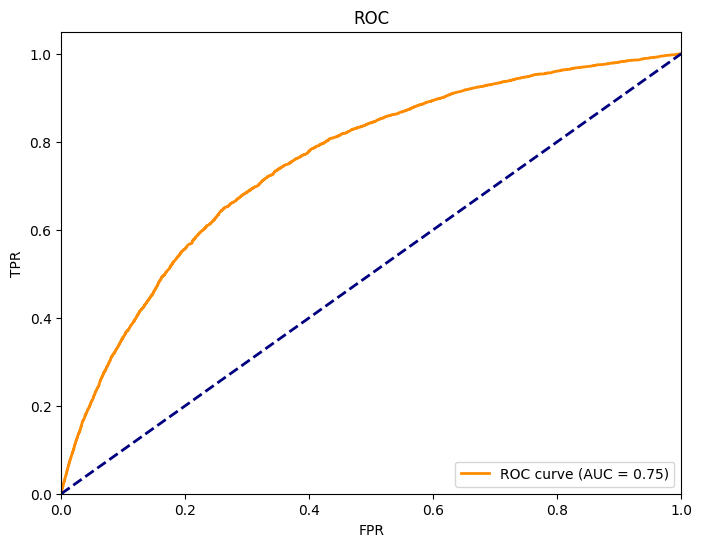

In [69]:
# 计算 ROC 曲线和 AUC
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
fpr, tpr, thresholds = roc_curve(y_test, X_test['Score'], pos_label=1)  # pos_label=0 指定好客户标签为0
roc_auc = auc(fpr, tpr)

# 绘制 ROC 曲线
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC')
plt.legend(loc="lower right")
plt.show()

In [70]:
# 计算 K-S 统计量
ks = max(tpr - fpr)
print(f'K-S 统计量: {ks:.3f}')
print(f'ROC AUC: {roc_auc:.3f}')

K-S 统计量: 0.388
ROC AUC: 0.753


In [76]:
X_test
y_test

692809     0
1002937    0
235540     0
989213     0
239964     0
          ..
271496     0
918060     0
1412120    0
1385490    0
1328061    0
Name: target, Length: 152666, dtype: int8

In [75]:
from sklearn.model_selection import StratifiedKFold, cross_val_score, train_test_split, cross_val_predict
from imblearn.over_sampling import RandomOverSampler
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from sklearn.metrics import confusion_matrix

def cross_validate_model(X, y):
    df_list = [col for col in X.columns]
    # 定义过采样和模型训练的管道
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', SimpleImputer(strategy='median'), df_list),
        ])
    logistic_params = {
    "random_state": 42,
    "max_iter": 20,
    "solver": 'liblinear' 
}
    # Defining the imbalanced-learn pipeline with oversampling and logistic regression
    pipeline = ImbPipeline([
        ('preprocessor', preprocessor),
        
        ('classifier', LogisticRegression(**logistic_params))
    ])
    
    # 定义分层K折交叉验证
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    
    # 计算交叉验证的分数
    scores = cross_val_score(pipeline, X, y, cv=cv, scoring='accuracy')
    predicted = cross_val_predict(pipeline, X, y, cv=cv)

    # 计算混淆矩阵
    cm = confusion_matrix(y, predicted)
    sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()
    
    return scores



In [73]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.metrics import roc_auc_score
import numpy as np

def cross_validate_random_forest(X, y, rf_params, n_splits=5, random_state=42):
    # Initialize StratifiedKFold
    cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    cv_scores = []
    fitted_models = []
    df_list = [col for col in X.columns]
    
    # Loop through each fold
    for idx_train, idx_valid in cv.split(X, y):
        X_train, X_valid = X.iloc[idx_train], X.iloc[idx_valid]
        y_train, y_valid = y.iloc[idx_train], y.iloc[idx_valid]

        # Create RandomForest model
        model = RandomForestClassifier(**rf_params)
        
        # Fit model
        model.fit(X_train, y_train)
        
        # Predict on validation set
        y_pred_valid = model.predict_proba(X_valid)[:, 1]  # Assuming binary classification
        
        # Compute AUC score
        auc_score = roc_auc_score(y_valid, y_pred_valid)
        cv_scores.append(auc_score)
        
        # Store the fitted model
        fitted_models.append(model)
    
    return cv_scores, fitted_models

# Example usage:
# Assuming df_features and df_target are your feature and target datasets
# rf_params as defined above


In [79]:
rf_params = {
    "n_estimators": 500,
    "max_depth": 10,
    "min_samples_split": 2,
    "min_samples_leaf": 1,
    #"max_features": 'auto',  # 相当于 colsample_bytree
    "bootstrap": True,  # 使用放回抽样
    "random_state": 42,
    "n_jobs": -1  # 使用所有可用的CPU核心
}

In [80]:
df_2 = df_smote_wOsex_walter.drop(columns=['target'])
X_train, X_test, y_train, y_test = train_test_split(
        df_2, y, test_size=0.1, random_state=66)



scores, models = cross_validate_random_forest(df_2, y, rf_params)
print("Cross-Validation AUC Scores df_smote_wOsex_walter :", scores)
print("Average AUC Score df_smote_wOsex_walter :", np.mean(scores))

Cross-Validation AUC Scores df_smote_wOsex_walter : [0.767995257948618, 0.7737106050398361, 0.7720018241452382, 0.7692498500075421, 0.7711517943575797]
Average AUC Score df_smote_wOsex_walter : 0.7708218662997628


In [81]:
from sklearn.metrics import roc_auc_score, classification_report
def ensemble_predictions(models, X_test):
    """
    Aggregate predictions from multiple models and compute the ensemble prediction.
    
    Parameters:
    - models: List of trained RandomForest models.
    - X_test: Test feature set.
    
    Returns:
    - ensemble_pred_proba: The average predicted probabilities from all models.
    """
    # Aggregate predictions from each model
    predictions = [model.predict_proba(X_test)[:, 1] for model in models]
    ensemble_pred_proba = np.mean(predictions, axis=0)
    return ensemble_pred_proba

# Compute ensemble predictions and evaluate them
if models:
    ensemble_pred_proba = ensemble_predictions(models, X_test)
    ensemble_auc_score = roc_auc_score(y_test, ensemble_pred_proba)
    print("Ensemble AUC rf Score:", ensemble_auc_score)
else:
    print("No models are available for evaluation.")


Ensemble AUC rf Score: 0.7769564712716561


Confusion Matrix:
[[147858      0]
 [  4808      0]]


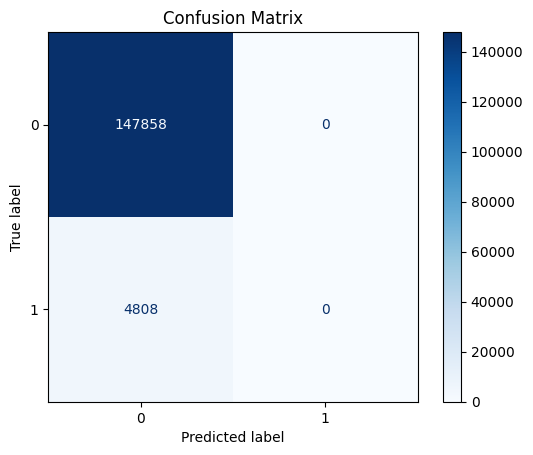

Classification Report:
               precision    recall  f1-score   support

           0       0.97      1.00      0.98    147858
           1       0.00      0.00      0.00      4808

    accuracy                           0.97    152666
   macro avg       0.48      0.50      0.49    152666
weighted avg       0.94      0.97      0.95    152666


In [82]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report

def ensemble_predictions(models, X_test):
    # Collect predictions from each model
    predictions = [model.predict_proba(X_test)[:, 1] for model in models]
    # Average the predictions
    mean_predictions = np.mean(predictions, axis=0)
    # Convert probabilities to class labels based on a threshold of 0.5
    return (mean_predictions > 0.5).astype(int)

def evaluate_model_with_confusion_matrix(models, X_test, y_test):

    if not models:
        print("No models are available for evaluation.")
        return

    # Predict class labels for the test set using ensemble
    y_pred = ensemble_predictions(models, X_test)

    # Generate the confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    print("Confusion Matrix:")
    print(cm)

    # Display the confusion matrix using matplotlib (optional)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.show()

    # Print a classification report for additional metrics
    print("Classification Report:\n", classification_report(y_test, y_pred))

# Assuming 'models' contains a list of trained models
evaluate_model_with_confusion_matrix(models, X_test, y_test)


In [83]:
X_test

,mean_numberofoverdueinstlmaxdat_641D_woe,days180_256L_woe,max_birth_259D_woe,mean_pmts_dpd_303P_woe,max_empl_employedfrom_271D_woe,pctinstlsallpaidlate4d_3546849L_woe,mean_pmts_dpd_1073P_woe,avgdpdtolclosure24_3658938P_woe,mean_numberofoverdueinstlmaxdat_148D_woe,maxdpdlast24m_143P_woe,pctinstlsallpaidlate1d_3546856L_woe,mean_pmts_overdue_1140A_woe,max_incometype_1044T_cnt_woe,mean_pmts_overdue_1152A_woe,numinstpaidearly_338L_woe
692809,-0.295824,0.039417,0.050180,-0.001084,-0.102202,-0.487460,0.057902,-0.496113,-0.203059,-0.177920,-0.609562,0.058145,0.222649,-0.001109,-0.152947
1002937,-0.295824,0.401524,0.050180,-0.759893,-0.102202,-0.487460,-0.444969,-0.496113,-0.203059,-0.177920,-0.609562,-0.440972,0.222649,-0.782143,-0.580711
235540,0.814906,-0.290333,0.050180,-0.001084,-0.477942,-0.073906,0.803228,-0.065876,-0.203059,-0.370821,-0.075837,0.797150,0.222649,-0.001109,-0.083777
989213,-0.295824,0.401524,0.050180,-0.759893,-0.102202,-0.487460,-0.444969,-0.496113,-0.151197,-0.177920,-0.080544,-0.440972,0.158360,-0.235204,-0.580711
239964,0.814906,0.078832,-0.191411,-0.001084,-0.477942,-0.073906,0.803228,-0.065876,-0.203059,-0.370821,-0.075837,0.797150,0.222649,-0.001109,-0.083777
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271496,-0.295824,0.078832,0.050180,-0.001084,-0.477942,-0.073906,-0.444969,-0.065876,-0.203059,-0.177920,-0.075837,-0.440972,0.158360,-0.001109,-0.083777
918060,-0.147546,-0.290333,-0.540805,0.670125,-0.102202,0.376929,-0.444969,-0.496113,0.069631,-0.177920,0.420679,-0.440972,-0.556503,0.632170,-0.152947
1412120,-0.295824,-0.290333,-0.540805,-0.759893,-0.102202,-0.487460,-0.444969,-0.496113,-0.203059,-0.177920,-0.609562,-0.440972,-0.556503,-0.782143,-0.580711
1385490,-0.295824,-0.290333,-0.540805,-0.001084,-0.102202,-0.121172,-0.444969,0.372260,-0.203059,-0.177920,-0.609562,-0.440972,-0.556503,-0.001109,-0.152947


lgb and exp


In [135]:
weeks = df_train["WEEK_NUM"]
X = df_train
y = df_train['target']
X = X.drop(columns=["target", "case_id", "WEEK_NUM"])


In [129]:
X

,month_decision,weekday_decision,credamount_770A,applicationcnt_361L,applications30d_658L,applicationscnt_1086L,applicationscnt_464L,applicationscnt_867L,clientscnt_1022L,clientscnt_100L,...,max_cacccardblochreas_147M,last_cacccardblochreas_147M,max_conts_type_509L,last_conts_type_509L,max_conts_role_79M,max_empls_economicalst_849M,max_empls_employer_name_740M,last_conts_role_79M,last_empls_economicalst_849M,last_empls_employer_name_740M
0,1,4,30000.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,4,19999.800781,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,5,78000.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,PRIMARY_MOBILE,EMPLOYMENT_PHONE,NaN,NaN,NaN,NaN,NaN,NaN
3,1,4,40000.000000,0.0,1.0,0.0,2.0,1.0,0.0,0.0,...,NaN,NaN,PRIMARY_MOBILE,PRIMARY_EMAIL,NaN,NaN,NaN,NaN,NaN,NaN
4,1,5,44000.000000,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,NaN,NaN,PRIMARY_MOBILE,HOME_PHONE,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1526654,10,1,30000.000000,0.0,0.0,0.0,0.0,10.0,0.0,0.0,...,a55475b1,a55475b1,PRIMARY_MOBILE,NaN,a55475b1,a55475b1,a55475b1,a55475b1,a55475b1,a55475b1
1526655,10,1,100000.000000,0.0,0.0,5.0,0.0,5.0,0.0,0.0,...,a55475b1,a55475b1,PRIMARY_MOBILE,NaN,a55475b1,a55475b1,a55475b1,a55475b1,a55475b1,a55475b1
1526656,10,1,60000.000000,0.0,0.0,0.0,0.0,3.0,0.0,0.0,...,a55475b1,a55475b1,PRIMARY_MOBILE,PHONE,a55475b1,a55475b1,a55475b1,a55475b1,a55475b1,a55475b1
1526657,10,1,6000.000000,0.0,0.0,36.0,0.0,9.0,1.0,0.0,...,a55475b1,a55475b1,PRIMARY_MOBILE,NaN,a55475b1,a55475b1,a55475b1,a55475b1,a55475b1,a55475b1


In [130]:
cv = StratifiedGroupKFold(n_splits=5, shuffle=False)
#CV AUC scores:  [0.8371927975406236, 0.830791286059915, 0.8336734561908583, 0.8387841657287671, 0.8336706030116027]
#Maximum CV AUC score:  0.8387841657287671
params = {
    "boosting_type": "gbdt",
    "objective": "binary",
    "metric": "auc",
    "max_depth": 10,  
    "learning_rate": 0.05,
    "n_estimators": 300,  
    "colsample_bytree": 0.8,
    "colsample_bynode": 0.8,
    "verbose": -1,
    "random_state": 42,
    "reg_alpha": 0.1,
    "reg_lambda": 10,
    "extra_trees":True,
    'num_leaves':64, 
    "verbose": -1,
}

fitted_models = []
cv_scores = []


for idx_train, idx_valid in cv.split(X, y, groups=weeks):#   Because it takes a long time to divide the data set, 
    X_train, y_train = X.iloc[idx_train], y.iloc[idx_train]# each time the data set is divided, two models are trained to each other twice, which saves time.
    X_valid, y_valid = X.iloc[idx_valid], y.iloc[idx_valid]
    model = lgb.LGBMClassifier(**params)
    model.fit(
        X_train, y_train,
        eval_set = [(X_valid, y_valid)],
        callbacks = [lgb.log_evaluation(200), lgb.early_stopping(50)] )
    fitted_models.append(model)
    y_pred_valid = model.predict_proba(X_valid)[:,1]
    auc_score = roc_auc_score(y_valid, y_pred_valid)
    cv_scores.append(auc_score)

    
    
print("CV AUC scores: ", cv_scores)
print("Maximum CV AUC score: ", max(cv_scores))

Training until validation scores don't improve for 50 rounds
[200]	valid_0's auc: 0.846084
Did not meet early stopping. Best iteration is:
[300]	valid_0's auc: 0.849226
Training until validation scores don't improve for 50 rounds
[200]	valid_0's auc: 0.846931
Did not meet early stopping. Best iteration is:
[300]	valid_0's auc: 0.8497
Training until validation scores don't improve for 50 rounds
[200]	valid_0's auc: 0.851555
Did not meet early stopping. Best iteration is:
[300]	valid_0's auc: 0.854376
Training until validation scores don't improve for 50 rounds
[200]	valid_0's auc: 0.851139
Did not meet early stopping. Best iteration is:
[300]	valid_0's auc: 0.85404
Training until validation scores don't improve for 50 rounds
[200]	valid_0's auc: 0.847203
Did not meet early stopping. Best iteration is:
[300]	valid_0's auc: 0.850585
CV AUC scores:  [0.8492257526528729, 0.8496997708287967, 0.8543760967743024, 0.8540398921729143, 0.850584597459638]
Maximum CV AUC score:  0.8543760967743024


In [136]:
# 首先定义一个字典来映射旧特征名称到新特征名称
feature_name_mapping = {
    'mean_dateofcredstart_739D': 'start_date_of_closed_credit_contract.',
    'max_incometype_1044T': 'income_type',
    'price_1097A': 'credit_price',
    'isbidproduct_1095L': 'flag_if_product_is_cross-sell',
    'mean_residualamount_856A': 'avg_residual_amount_for_active_contract.',
    'max_sex_738L': 'gender',
    'pmtnum_254L': 'total_number_loan_payments_made_by_the_client.',
    'pmtssum_45A': 'sum_of_tax_deductions_for_the_client',
    'lastapprcommoditycat_1041M': 'Commodity_category_last_loan_applications_made_by_the_applicant',
    'last_relationshiptoclient_642T': 'relationship_to_the_client'
    # ... 以此类推，对所有特征名称进行映射
}


cv = StratifiedGroupKFold(n_splits=5, shuffle=False)
#CV AUC scores:  [0.8371927975406236, 0.830791286059915, 0.8336734561908583, 0.8387841657287671, 0.8336706030116027]
#Maximum CV AUC score:  0.8387841657287671
params = {
    "boosting_type": "gbdt",
    "objective": "binary",
    "metric": "auc",
    "max_depth": 10,  
    "learning_rate": 0.05,
    "n_estimators": 300,  
    "colsample_bytree": 0.8,
    "colsample_bynode": 0.8,
    "verbose": -1,
    "random_state": 42,
    "reg_alpha": 0.1,
    "reg_lambda": 10,
    "extra_trees":True,
    'num_leaves':64, 
    "verbose": -1,
}

# 开始交叉验证和模型拟合的循环
fitted_models = []
cv_scores = []

for idx_train, idx_valid in cv.split(X, y, groups=weeks):
    # 分割训练集和验证集
    X_train, y_train = X.iloc[idx_train], y.iloc[idx_train]
    X_valid, y_valid = X.iloc[idx_valid], y.iloc[idx_valid]
    
    # 更新训练集和验证集的列名
    X_train.rename(columns=feature_name_mapping, inplace=True)
    X_valid.rename(columns=feature_name_mapping, inplace=True)

    # 实例化模型并训练
    model = lgb.LGBMClassifier(**params)
    model.fit(
        X_train, y_train,
        eval_set=[(X_valid, y_valid)],
        callbacks=[lgb.log_evaluation(200), lgb.early_stopping(50)]
    )
    
    # 保存训练好的模型
    fitted_models.append(model)
    
    # 在验证集上进行预测并计算AUC分数
    y_pred_valid = model.predict_proba(X_valid)[:, 1]
    auc_score = roc_auc_score(y_valid, y_pred_valid)
    cv_scores.append(auc_score)

# 输出交叉验证的AUC分数
print("CV AUC scores: ", cv_scores)
print("Maximum CV AUC score: ", max(cv_scores))


Training until validation scores don't improve for 50 rounds
[200]	valid_0's auc: 0.846084
Did not meet early stopping. Best iteration is:
[300]	valid_0's auc: 0.849226
Training until validation scores don't improve for 50 rounds
[200]	valid_0's auc: 0.846931
Did not meet early stopping. Best iteration is:
[300]	valid_0's auc: 0.8497
Training until validation scores don't improve for 50 rounds
[200]	valid_0's auc: 0.851555
Did not meet early stopping. Best iteration is:
[300]	valid_0's auc: 0.854376
Training until validation scores don't improve for 50 rounds
[200]	valid_0's auc: 0.851139
Did not meet early stopping. Best iteration is:
[300]	valid_0's auc: 0.85404
Training until validation scores don't improve for 50 rounds
[200]	valid_0's auc: 0.847203
Did not meet early stopping. Best iteration is:
[300]	valid_0's auc: 0.850585
CV AUC scores:  [0.8492257526528729, 0.8496997708287967, 0.8543760967743024, 0.8540398921729143, 0.850584597459638]
Maximum CV AUC score:  0.8543760967743024


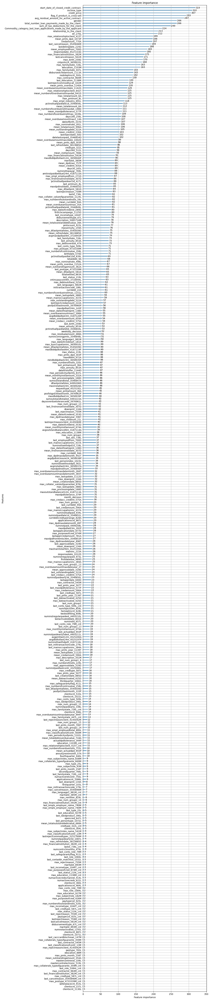

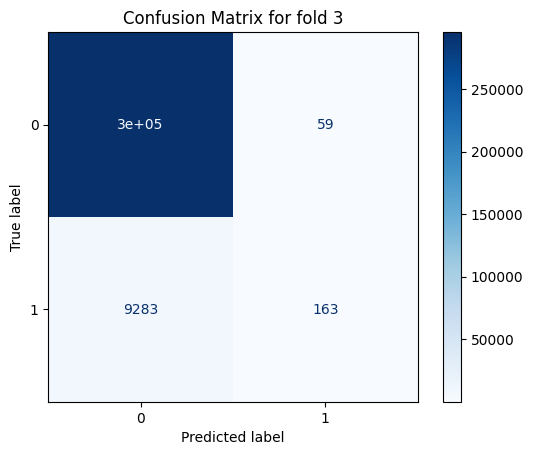

In [137]:
model3 = fitted_models[2]

# Ensure you have the validation set used during the training of this model
# You might need to store `X_valid` and `y_valid` during each fold iteration
# For the purpose of this example, let's assume X_valid and y_valid are known for the third fold
# You must capture X_valid and y_valid during your cross-validation loop for this to work correctly

# Plot feature importances
lgb.plot_importance(model3, importance_type="split", figsize=(10, 80))
plt.show()

# Generate predictions - ensure to use the correct corresponding X_valid from the third fold
y_pred_labels = model3.predict(X_valid)  # Use predict() for class labels directly

# Generate confusion matrix
cm = confusion_matrix(y_valid, y_pred_labels)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix for fold 3')
plt.show()

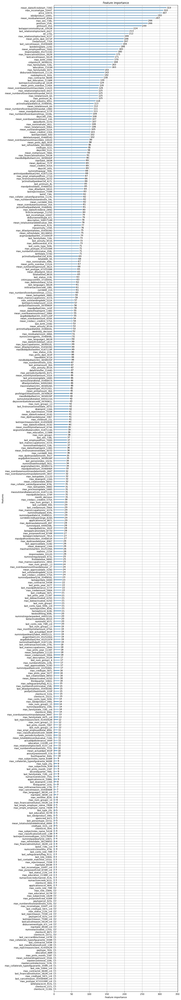

In [87]:
lgb.plot_importance(fitted_models[2], importance_type="split", figsize=(10,80))
plt.show()

In [88]:
#light gbm light
X = df_smote_wOsex_walter
y = df_smote_wOsex_walter['target']
X = X.drop(columns=['target'])
fitted_models = []
cv_scores = []
for idx_train, idx_valid in cv.split(X, y, groups=weeks):#   Because it takes a long time to divide the data set, 
    X_train, y_train = X.iloc[idx_train], y.iloc[idx_train]# each time the data set is divided, two models are trained to each other twice, which saves time.
    X_valid, y_valid = X.iloc[idx_valid], y.iloc[idx_valid]
    model = lgb.LGBMClassifier(**params)
    model.fit(
        X_train, y_train,
        eval_set = [(X_valid, y_valid)],
        callbacks = [lgb.log_evaluation(200), lgb.early_stopping(100)] )
    fitted_models.append(model)
    y_pred_valid = model.predict_proba(X_valid)[:,1]
    auc_score = roc_auc_score(y_valid, y_pred_valid)
    cv_scores.append(auc_score)
        
print("CV AUC scores: ", cv_scores)
print("Maximum CV AUC score: ", max(cv_scores))

Training until validation scores don't improve for 100 rounds
[200]	valid_0's auc: 0.767837
Did not meet early stopping. Best iteration is:
[298]	valid_0's auc: 0.767973
Training until validation scores don't improve for 100 rounds
[200]	valid_0's auc: 0.77077
Did not meet early stopping. Best iteration is:
[291]	valid_0's auc: 0.770969
Training until validation scores don't improve for 100 rounds
[200]	valid_0's auc: 0.771874
Did not meet early stopping. Best iteration is:
[267]	valid_0's auc: 0.77197
Training until validation scores don't improve for 100 rounds
[200]	valid_0's auc: 0.771232
Did not meet early stopping. Best iteration is:
[299]	valid_0's auc: 0.771486
Training until validation scores don't improve for 100 rounds
[200]	valid_0's auc: 0.766109
Did not meet early stopping. Best iteration is:
[290]	valid_0's auc: 0.766383
CV AUC scores:  [0.7679730020950417, 0.770969317664412, 0.7719698711725362, 0.7714856206206544, 0.7663834154848854]
Maximum CV AUC score:  0.77196987117

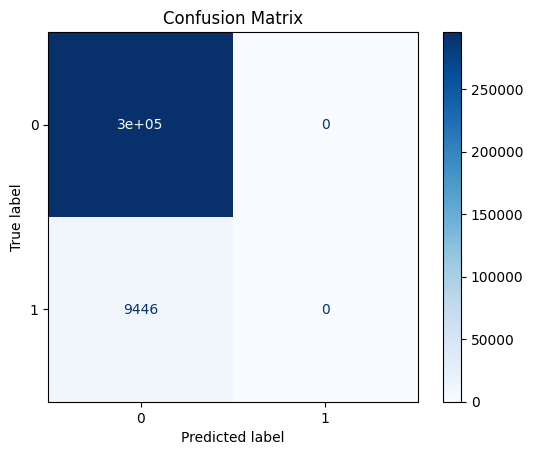

In [89]:
y_pred_labels = fitted_models[2].predict(X_valid)  # Use predict() for class labels directly

# Generate confusion matrix
cm = confusion_matrix(y_valid, y_pred_labels)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

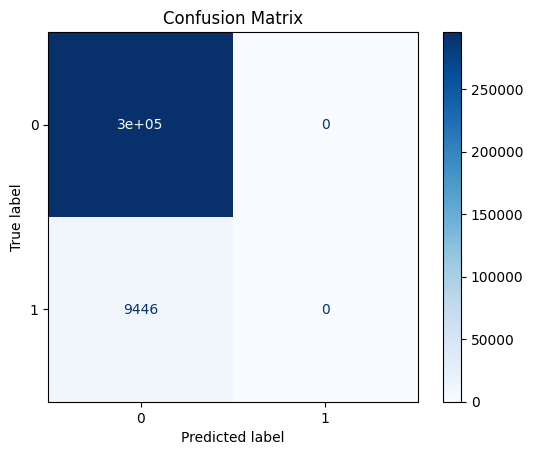

In [90]:
y_pred_labels = fitted_models[3].predict(X_valid)  # Use predict() for class labels directly

# Generate confusion matrix
cm = confusion_matrix(y_valid, y_pred_labels)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

In [117]:
X = df_smote_wOsex_walter
y = df_smote_wOsex_walter['target']
X = X.drop(columns=['target'])


In [118]:
column_name_mapping = {'avgdpdtolclosure24_3658938P_woe': 'avg_dpd_with_tolerance_within_past24months_from_maxiclosuredate'
,'days180_256L_woe': 'num_credit_bureau_queries_last_180_days'
,'mean_pmts_overdue_1140A_woe': 'avg_overdue_payment_active_contract'
, 'mean_numberofoverdueinstlmaxdat_148D_woe': 'Date_of_maxnumber_of_pastdueinstalments_for_closed_contract'
, 'mean_pmts_dpd_303P_woe': 'mean_dpd_payment_for_terminated_contract'
, 'mean_pmts_dpd_1073P_woe': 'mean_dpd_payment_for_active_contract'
,'max_incometype_1044T_cnt_woe': 'income_type'
,'max_empl_employedfrom_271D_woe': 'startdate_employment'
,'mean_numberofoverdueinstlmaxdat_641D_woe': 'Date_of_maxnumber_of_past_due_instalments_for_activecontract'
,'max_birth_259D_woe': 'birthday'
,'numinstpaidearly_338L_woe': 'num_installment_prior_due'
, 'maxdpdlast24m_143P_woe': 'maxdpd_last_24month'
,'mean_pmts_overdue_1152A_woe': 'avg_overdue_payment_closed_contract'
,'pctinstlsallpaidlate1d_3546856L_woe': 'Percent_of_installments_paid_1ormore_days_past_duedate'
,'pctinstlsallpaidlate4d_3546849L_woe': 'Percent_of_installments_paid_4ormore_days_past_duedate'}

X.rename(columns=column_name_mapping, inplace=True)

X

,Date_of_maxnumber_of_past_due_instalments_for_activecontract,num_credit_bureau_queries_last_180_days,birthday,mean_dpd_payment_for_terminated_contract,startdate_employment,Percent_of_installments_paid_4ormore_days_past_duedate,mean_dpd_payment_for_active_contract,avg_dpd_with_tolerance_within_past24months_from_maxiclosuredate,Date_of_maxnumber_of_pastdueinstalments_for_closed_contract,maxdpd_last_24month,Percent_of_installments_paid_1ormore_days_past_duedate,avg_overdue_payment_active_contract,income_type,avg_overdue_payment_closed_contract,num_installment_prior_due
0,-0.295824,0.039417,0.050180,-0.001084,0.477829,-0.073906,0.057902,-0.065876,-0.203059,-0.17792,-0.075837,0.058145,-0.133298,-0.001109,-0.083777
1,-0.295824,0.039417,-0.540805,-0.001084,-0.477942,-0.073906,0.057902,-0.065876,-0.203059,-0.17792,-0.075837,0.058145,-0.133298,-0.001109,-0.083777
2,-0.295824,0.039417,0.050180,-0.001084,-0.054047,-0.073906,0.057902,-0.065876,-0.203059,-0.17792,-0.075837,0.058145,0.158360,-0.001109,-0.083777
3,-0.295824,0.039417,0.488725,-0.001084,0.477829,-0.073906,0.057902,-0.065876,-0.203059,-0.17792,-0.075837,0.058145,0.158360,-0.001109,-0.083777
4,-0.295824,0.039417,0.488725,-0.001084,0.260100,-0.073906,0.057902,-0.065876,-0.203059,-0.17792,-0.075837,0.058145,0.158360,-0.001109,-0.083777
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1526654,-0.295824,-0.290333,-0.540805,-0.212746,-0.102202,-0.487460,-0.444969,-0.496113,-0.672960,-0.17792,-0.609562,-0.440972,-0.556503,-0.782143,-0.580711
1526655,-0.295824,-0.290333,-0.540805,-0.759893,-0.102202,-0.487460,-0.444969,-0.496113,-0.203059,-0.17792,-0.609562,-0.440972,-0.556503,-0.782143,-0.580711
1526656,0.532317,-0.141359,0.050180,-0.759893,-0.102202,-0.121172,0.803228,0.372260,-0.203059,0.28276,0.420679,0.071878,0.222649,-0.782143,-0.152947
1526657,-0.295824,-0.141359,-0.540805,-0.759893,-0.102202,-0.121172,-0.444969,-0.496113,-0.151197,-0.17792,-0.080544,-0.440972,-0.556503,-0.235204,-0.580711


In [119]:


# LightGBM parameters, ensure they are defined or define them here
params = {
    "boosting_type": "gbdt",
    "objective": "binary",
    "metric": "auc",
    "learning_rate": 0.05,
    "max_depth": 10,
    "n_estimators":5000,
    "random_state": 42,
    # add more parameters as needed
}

fitted_models = []
cv_scores = []

# Setup the cross-validation with StratifiedKFold
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
ros = RandomOverSampler(random_state=42)

for idx_train, idx_valid in cv.split(X, y, groups=weeks):
    X_train, y_train = X.iloc[idx_train], y.iloc[idx_train]
    X_valid, y_valid = X.iloc[idx_valid], y.iloc[idx_valid]

    # Apply oversampling only to the training data
    X_train_res, y_train_res = ros.fit_resample(X_train, y_train)

    # Create and fit the LightGBM model
    model = lgb.LGBMClassifier(**params)
    model.fit(
        X_train_res, y_train_res,
        eval_set=[(X_valid, y_valid)],
        callbacks=[lgb.log_evaluation(200), lgb.early_stopping(100)],
    )
    fitted_models.append(model)
    
    # Predict and evaluate
    y_pred_valid = model.predict_proba(X_valid)[:, 1]
    auc_score = roc_auc_score(y_valid, y_pred_valid)
    cv_scores.append(auc_score)

print("CV AUC scores: ", cv_scores)
print("Maximum CV AUC score: ", max(cv_scores))

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 1182932, number of negative: 1182932
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.036545 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 84
[LightGBM] [Info] Number of data points in the train set: 2365864, number of used features: 15
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 100 rounds
[200]	valid_0's auc: 0.773089
Early stopp

In [120]:
X = df_smote_wOsex_walter
y = df_smote_wOsex_walter['target']
X = X.drop(columns=['target'])
model = lgb.LGBMClassifier(**params)
lgb_clf = model.fit(X, y)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 47994, number of negative: 1478665
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 84
[LightGBM] [Info] Number of data points in the train set: 1526659, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.031437 -> initscore=-3.427819
[LightGBM] [Info] Start training from score -3.427819


In [93]:
X_test = X_test.drop(columns=['Predicted', 'Score'])

KeyError: "['Predicted', 'Score'] not found in axis"

In [121]:
#xai
import shap
# 显示特征重要性
# 计算 SHAP 值
lgb_clf
explainer = shap.TreeExplainer(lgb_clf)
shap_values = explainer.shap_values(X_test)  # 假设 X_test 是模型测试集的特征数据

# 可视化第一个预测的 SHAP 值
shap.initjs()  # 初始化 JS 可视化环境



In [122]:
shap_values

array([[-0.01951204,  0.02695238, -0.07628661, ...,  0.21726857,
         0.12999735, -0.04765964],
       [-0.00653236,  0.58795435, -0.12737227, ...,  0.28170663,
        -0.18653591, -0.32741877],
       [ 0.17336271, -0.17758285,  0.03550352, ...,  0.37841353,
         0.12670898,  0.04958685],
       ...,
       [-0.00893254, -0.19027586,  0.05084385, ..., -0.13758833,
        -0.19936641, -0.2548367 ],
       [ 0.00563255, -0.16847797, -0.00890806, ..., -0.18288537,
         0.07065818, -0.0511731 ],
       [-0.10601053, -0.17313118,  0.0359158 , ..., -0.36657143,
         0.214525  ,  0.22244352]])

In [123]:
smote_bins['avgdpdtolclosure24_3658938P']

,variable,bin,count,count_distr,good,bad,badprob,woe,bin_iv,total_iv,breaks,is_special_values
0,avgdpdtolclosure24_3658938P,missing,467175,0.306011,453397,13778,0.029492,-0.065876,0.001288,0.31098,missing,True
1,avgdpdtolclosure24_3658938P,"[-inf,1.0)",763665,0.500220,748865,14800,0.019380,-0.496113,0.098267,0.31098,1.0,False
2,avgdpdtolclosure24_3658938P,"[1.0,3.0)",167237,0.109544,159715,7522,0.044978,0.372260,0.018135,0.31098,3.0,False
3,avgdpdtolclosure24_3658938P,"[3.0,inf)",128582,0.084224,116688,11894,0.092501,1.144349,0.193290,0.31098,inf,False


In [124]:
shap_values[1, :]


array([-0.00653236,  0.58795435, -0.12737227, -0.16939616, -0.0831137 ,
        0.04654481, -0.17950678, -0.09172474,  0.11413898,  0.00890043,
       -0.07978325, -0.088393  ,  0.28170663, -0.18653591, -0.32741877])

In [125]:
X_test.columns

Index(['mean_numberofoverdueinstlmaxdat_641D_woe', 'days180_256L_woe',
       'max_birth_259D_woe', 'mean_pmts_dpd_303P_woe',
       'max_empl_employedfrom_271D_woe', 'pctinstlsallpaidlate4d_3546849L_woe',
       'mean_pmts_dpd_1073P_woe', 'avgdpdtolclosure24_3658938P_woe',
       'mean_numberofoverdueinstlmaxdat_148D_woe', 'maxdpdlast24m_143P_woe',
       'pctinstlsallpaidlate1d_3546856L_woe', 'mean_pmts_overdue_1140A_woe',
       'max_incometype_1044T_cnt_woe', 'mean_pmts_overdue_1152A_woe',
       'numinstpaidearly_338L_woe'],
      dtype='object')

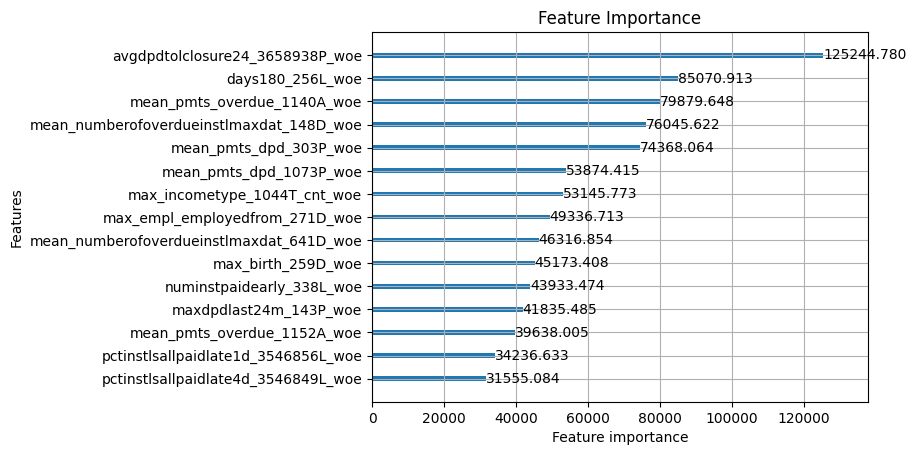

In [127]:
shap.force_plot(explainer.expected_value, shap_values[1, :], X_test.iloc[0, :], link="logit")
lgb.plot_importance(lgb_clf, max_num_features=30, importance_type='gain')
plt.title('Feature Importance')
plt.show()

In [100]:
merge_test = pd.merge(X_test, y_test, left_index=True, right_index=True)
filtered_merge_test = merge_test[merge_test['target'] == 1]

In [101]:
merge_test

,mean_numberofoverdueinstlmaxdat_641D_woe,days180_256L_woe,max_birth_259D_woe,mean_pmts_dpd_303P_woe,max_empl_employedfrom_271D_woe,pctinstlsallpaidlate4d_3546849L_woe,mean_pmts_dpd_1073P_woe,avgdpdtolclosure24_3658938P_woe,mean_numberofoverdueinstlmaxdat_148D_woe,maxdpdlast24m_143P_woe,pctinstlsallpaidlate1d_3546856L_woe,mean_pmts_overdue_1140A_woe,max_incometype_1044T_cnt_woe,mean_pmts_overdue_1152A_woe,numinstpaidearly_338L_woe,target
692809,-0.295824,0.039417,0.050180,-0.001084,-0.102202,-0.487460,0.057902,-0.496113,-0.203059,-0.177920,-0.609562,0.058145,0.222649,-0.001109,-0.152947,0
1002937,-0.295824,0.401524,0.050180,-0.759893,-0.102202,-0.487460,-0.444969,-0.496113,-0.203059,-0.177920,-0.609562,-0.440972,0.222649,-0.782143,-0.580711,0
235540,0.814906,-0.290333,0.050180,-0.001084,-0.477942,-0.073906,0.803228,-0.065876,-0.203059,-0.370821,-0.075837,0.797150,0.222649,-0.001109,-0.083777,0
989213,-0.295824,0.401524,0.050180,-0.759893,-0.102202,-0.487460,-0.444969,-0.496113,-0.151197,-0.177920,-0.080544,-0.440972,0.158360,-0.235204,-0.580711,0
239964,0.814906,0.078832,-0.191411,-0.001084,-0.477942,-0.073906,0.803228,-0.065876,-0.203059,-0.370821,-0.075837,0.797150,0.222649,-0.001109,-0.083777,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271496,-0.295824,0.078832,0.050180,-0.001084,-0.477942,-0.073906,-0.444969,-0.065876,-0.203059,-0.177920,-0.075837,-0.440972,0.158360,-0.001109,-0.083777,0
918060,-0.147546,-0.290333,-0.540805,0.670125,-0.102202,0.376929,-0.444969,-0.496113,0.069631,-0.177920,0.420679,-0.440972,-0.556503,0.632170,-0.152947,0
1412120,-0.295824,-0.290333,-0.540805,-0.759893,-0.102202,-0.487460,-0.444969,-0.496113,-0.203059,-0.177920,-0.609562,-0.440972,-0.556503,-0.782143,-0.580711,0
1385490,-0.295824,-0.290333,-0.540805,-0.001084,-0.102202,-0.121172,-0.444969,0.372260,-0.203059,-0.177920,-0.609562,-0.440972,-0.556503,-0.001109,-0.152947,0


In [102]:
import dice_ml
from dice_ml.utils import helpers  # Make sure you've installed dice_ml and it includes helpers



In [230]:
# Assuming lgb_clf is your trained LightGBM classifier model
# List of continuous features
continuous_features = [
    'max_incometype_1044T_cnt_woe', 'mean_pmts_dpd_303P_woe', 'mean_pmts_overdue_1152A_woe',
    'lastcancelreason_561M_cnt_woe', 'max_birth_259D_woe', 'avgdpdtolclosure24_3658938P_woe',
    'maxdpdlast24m_143P_woe', 'mean_pmts_dpd_1073P_woe', 'pctinstlsallpaidlate1d_3546856L_woe',
    'maxdbddpdtollast12m_3658940P_woe', 'lastrejectreason_759M_cnt_woe', 'max_numberofoverdueinstlmax_1039L_woe',
    'mean_employedfrom_700D_woe', 'lastrejectdate_50D_woe'
]

# Validate features in DataFrame
missing_cols = [col for col in continuous_features if col not in merge_test.columns]
if missing_cols:
    print("Missing columns in DataFrame:", missing_cols)
else:
    print("All specified features are present in the DataFrame.")

# Setup DiCE Data and Model
d = dice_ml.Data(dataframe=merge_test, continuous_features=continuous_features, outcome_name='target')
m = dice_ml.Model(model=lgb_clf, backend="sklearn")

# Create DiCE explainer
explainer = dice_ml.Dice(d, m)

# Select a particular instance to explain
user_select_idx = 12
desired_class = 1
# Generate counterfactual explanations
e1 = explainer.generate_counterfactuals(X_test[user_select_idx:user_select_idx+1], 
                                        total_CFs=10, 
                                        desired_class=desired_class)  # Ensure desired_class matches your model's expected input

# Visualize the counterfactual explanations
e1.visualize_as_dataframe(show_only_changes=False)  # If you want to see only changes, set to True

All specified features are present in the DataFrame.


  0%|          | 0/1 [00:00<?, ?it/s]

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

100%|██████████| 1/1 [00:07<00:00,  7.17s/it]

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

,max_incometype_1044T_cnt_woe,mean_pmts_dpd_303P_woe,mean_pmts_overdue_1152A_woe,lastcancelreason_561M_cnt_woe,max_birth_259D_woe,mean_employedfrom_700D_woe,avgdpdtolclosure24_3658938P_woe,maxdpdlast24m_143P_woe,mean_pmts_dpd_1073P_woe,pctinstlsallpaidlate1d_3546856L_woe,maxdbddpdtollast12m_3658940P_woe,lastrejectreason_759M_cnt_woe,max_numberofoverdueinstlmax_1039L_woe,lastrejectdate_50D_woe,target
0,0.222649,0.670125,0.63217,0.089704,0.488725,0.175677,-0.496113,1.047332,-0.444969,-0.080544,0.061209,0.308867,-0.454595,0.18238,0



Diverse Counterfactual set (new outcome: 1)


,max_incometype_1044T_cnt_woe,mean_pmts_dpd_303P_woe,mean_pmts_overdue_1152A_woe,lastcancelreason_561M_cnt_woe,max_birth_259D_woe,mean_employedfrom_700D_woe,avgdpdtolclosure24_3658938P_woe,maxdpdlast24m_143P_woe,mean_pmts_dpd_1073P_woe,pctinstlsallpaidlate1d_3546856L_woe,maxdbddpdtollast12m_3658940P_woe,lastrejectreason_759M_cnt_woe,max_numberofoverdueinstlmax_1039L_woe,lastrejectdate_50D_woe,target
0,0.222649,0.670125,0.632170,0.089704,0.488725,0.175677,-0.496113,1.047332,0.551321,-0.080544,0.061209,0.308867,-0.454595,0.18238,1
1,0.222649,0.670125,0.632170,0.089704,0.488725,0.175677,-0.496113,1.047332,0.505422,-0.080544,0.061209,0.308867,-0.454595,0.18238,1
2,0.222649,0.670125,0.632170,0.089704,0.488725,0.175677,-0.496113,1.047332,0.794568,-0.080544,0.061209,0.308867,-0.454595,0.18238,1
3,0.222649,0.670125,0.632170,0.089704,0.488725,0.175677,-0.496113,1.047332,0.564728,-0.080544,0.061209,0.308867,-0.454595,0.18238,1
4,0.222649,0.670125,0.632170,0.089704,0.488725,0.175677,-0.496113,1.047332,0.510189,-0.080544,0.061209,0.308867,-0.454595,0.18238,1
5,0.222649,0.670125,0.632170,0.089704,0.488725,0.175677,-0.496113,1.047332,0.555934,-0.080544,0.061209,0.308867,-0.454595,0.18238,1
6,0.222649,0.670125,0.632170,0.089704,0.488725,0.175677,-0.496113,1.045398,0.570678,-0.080544,0.061209,0.308867,-0.454595,0.18238,1
7,0.222649,0.670125,0.070365,0.089704,0.488725,0.175677,-0.496113,1.047332,0.497279,-0.080544,0.061209,0.308867,-0.454595,0.18238,1
8,0.222649,0.670125,0.632170,0.089704,0.488725,0.175677,-0.496113,1.047332,0.471342,-0.080544,0.061209,0.308867,-0.454595,0.18238,1
9,0.222649,0.670125,0.632170,0.089704,0.488725,0.175677,-0.496113,1.047332,0.564119,-0.080544,0.061209,0.308867,-0.454595,0.18238,1


(         max_incometype_1044T_cnt_woe  mean_pmts_dpd_303P_woe  \
 1495640                      0.222649                0.670125   
 
          mean_pmts_overdue_1152A_woe  lastcancelreason_561M_cnt_woe  \
 1495640                      0.63217                       0.089704   
 
          max_birth_259D_woe  mean_employedfrom_700D_woe  \
 1495640            0.488725                    0.175677   
 
          avgdpdtolclosure24_3658938P_woe  maxdpdlast24m_143P_woe  \
 1495640                        -0.496113                1.047332   
 
          mean_pmts_dpd_1073P_woe  pctinstlsallpaidlate1d_3546856L_woe  \
 1495640                -0.444969                            -0.080544   
 
          maxdbddpdtollast12m_3658940P_woe  lastrejectreason_759M_cnt_woe  \
 1495640                          0.061209                       0.308867   
 
          max_numberofoverdueinstlmax_1039L_woe  lastrejectdate_50D_woe  
 1495640                              -0.454595                 0.18238  ,)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


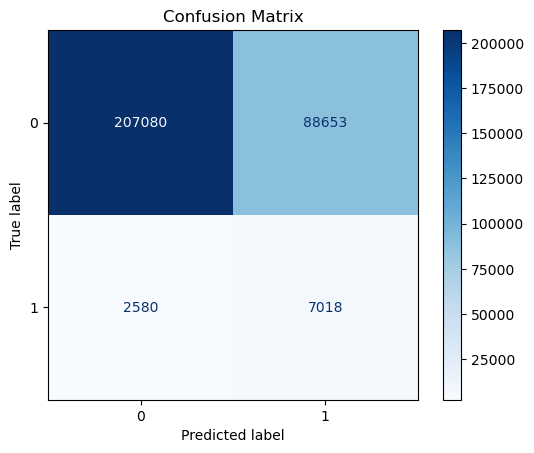

In [186]:
y_pred_labels = fitted_models[2].predict(X_valid)  # Use predict() for class labels directly

# Generate confusion matrix
cm = confusion_matrix(y_valid, y_pred_labels)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

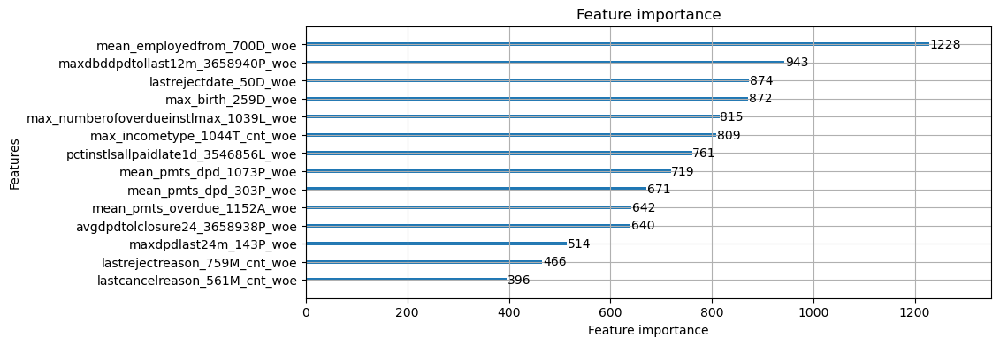

In [159]:
lgb.plot_importance(fitted_models[2], importance_type="split", figsize=(10,4))
plt.show()

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


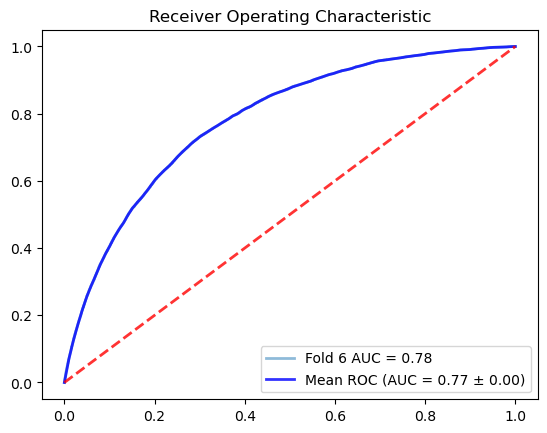

CV AUC scores:  [0.7692721764538448, 0.7715316067254401, 0.7714838341400583, 0.7708493604570098, 0.7701614851674293, 0.7826543146312362]
Maximum CV AUC score:  0.7826543146312362


In [150]:
import numpy as np
import lightgbm as lgb
from sklearn.metrics import roc_auc_score, roc_curve, auc
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import RandomOverSampler
import matplotlib.pyplot as plt
tprs = []
mean_fpr = np.linspace(0, 1, 100)
fig, ax = plt.subplots()

y_pred_proba = fitted_models[2].predict_proba(X_valid)[:, 1]
fpr, tpr, thresholds = roc_curve(y_valid, y_pred_proba)
roc_auc = auc(fpr, tpr)
cv_scores.append(roc_auc)

# Interpolate the TPR (true positive rate) for the current fold
interp_tpr = np.interp(mean_fpr, fpr, tpr)
interp_tpr[0] = 0.0  # Set the first point in the interpolated TPR to zero
tprs.append(interp_tpr)

# Plot the ROC curve for the current fold
ax.plot(fpr, tpr, label=f'Fold {len(cv_scores)} AUC = {roc_auc:.2f}', lw=2, alpha=0.5)

# Compute the mean AUC and mean interpolated TPR
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0  # Set the last point in the interpolated TPR to one
mean_auc = np.mean(cv_scores)
std_auc = np.std(cv_scores)

# Plot the mean ROC curve
ax.plot(mean_fpr, mean_tpr, color='b',
        label=f'Mean ROC (AUC = {mean_auc:.2f} ± {std_auc:.2f})',
        lw=2, alpha=0.8)

# Plot the chance line
ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', alpha=.8)

# Customize the plot
ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05], title="Receiver Operating Characteristic")
ax.legend(loc="lower right")
plt.show()

# Output the cross-validation AUC scores
print("CV AUC scores: ", cv_scores)
print("Maximum CV AUC score: ", max(cv_scores))




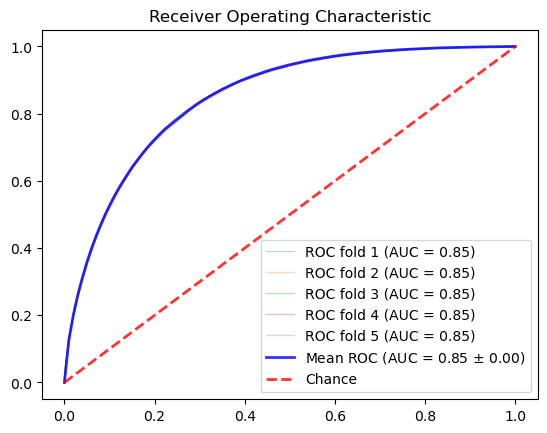

Mean AUC Score: 0.8470532830477996


In [127]:
import numpy as np
import lightgbm as lgb
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import RandomOverSampler
weeks = df_train["WEEK_NUM"]
X = df_train
y = df_train['target']
X = X.drop(columns=["target", "case_id", "WEEK_NUM"])
def run_lgbm_cv_with_oversampling(X, y, n_splits=5, num_boost_round=100):
    """
    Train a LightGBM model with cross-validation and plot ROC curves.
    Includes oversampling for handling class imbalance.

    Parameters:
    - X: Features DataFrame.
    - y: Target variable Series.
    - n_splits: Number of folds for cross-validation.
    - num_boost_round: Number of boosting rounds.

    Returns:
    - Prints out the mean AUC score and plots ROC curves for each fold.
    """
    kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    fig, ax = plt.subplots()
    mean_fpr = np.linspace(0, 1, 100)
    tprs = []
    aucs = []
    ros = RandomOverSampler(random_state=42)

    for i, (train_index, test_index) in enumerate(kf.split(X, y)):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Apply oversampling to the training data
        X_train_res, y_train_res = ros.fit_resample(X_train, y_train)

        # Create dataset for LightGBM
        train_data = lgb.Dataset(X_train_res, label=y_train_res)
        validation_data = lgb.Dataset(X_test, label=y_test, reference=train_data)

        # Define parameters for LightGBM
        params = {
            'objective': 'binary',
            'metric': 'auc',
            'boosting_type': 'gbdt',
            'learning_rate': 0.1,
            'verbose': 0
        }

        # Train the model
        bst = lgb.train(params, train_data, num_boost_round, valid_sets=[validation_data])

        # Predict test set
        y_pred_proba = bst.predict(X_test)

        # Compute ROC curve and area the curve
        fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
        roc_auc = auc(fpr, tpr)
        aucs.append(roc_auc)
        ax.plot(fpr, tpr, lw=1, alpha=0.3, label=f'ROC fold {i+1} (AUC = {roc_auc:.2f})')

        # Interpolate all ROC curves at this points
        interp_tpr = np.interp(mean_fpr, fpr, tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)

    # Plot the average ROC curve
    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = np.mean(aucs)
    std_auc = np.std(aucs)
    ax.plot(mean_fpr, mean_tpr, color='blue',
            label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
            lw=2, alpha=0.8)
    ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=0.8)
    ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05], title="Receiver Operating Characteristic")
    ax.legend(loc="lower right")
    plt.show()

    return mean_auc

# Example usage
mean_auc_score = run_lgbm_cv_with_oversampling(X, y)
print("Mean AUC Score:", mean_auc_score)


,max_incometype_1044T_cnt_woe,mean_pmts_dpd_303P_woe,mean_pmts_overdue_1152A_woe,lastcancelreason_561M_cnt_woe,max_birth_259D_woe,mean_employedfrom_700D_woe,avgdpdtolclosure24_3658938P_woe,maxdpdlast24m_143P_woe,mean_pmts_dpd_1073P_woe,pctinstlsallpaidlate1d_3546856L_woe,maxdbddpdtollast12m_3658940P_woe,lastrejectreason_759M_cnt_woe,max_numberofoverdueinstlmax_1039L_woe,lastrejectdate_50D_woe,Score,Predicted
692809,0.222649,-0.001084,-0.001109,-0.257678,0.050180,0.515950,-0.496113,-0.177920,0.057902,-0.609562,-0.456451,-0.360158,0.058145,-0.410967,507.388097,1
1002937,0.222649,-0.759893,-0.782143,0.581545,0.050180,-0.200550,-0.496113,-0.177920,-0.444969,-0.609562,-0.456451,0.308867,-0.454595,0.727378,491.570984,1
235540,0.222649,-0.001084,-0.001109,-0.257678,0.050180,-0.200550,-0.065876,-0.370821,0.803228,-0.075837,-0.031277,-0.360158,0.261013,-0.410967,518.017552,1
989213,0.158360,-0.759893,-0.235204,-0.257678,0.050180,0.175677,-0.496113,-0.177920,-0.444969,-0.080544,-0.456451,0.308867,-0.454595,0.476607,498.852732,1
239964,0.222649,-0.001084,-0.001109,-0.257678,-0.191411,-0.200550,-0.065876,-0.370821,0.803228,-0.075837,-0.031277,-0.360158,0.943349,-0.410967,518.246109,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271496,0.158360,-0.001084,-0.001109,-0.257678,0.050180,-0.574062,-0.065876,-0.177920,-0.444969,-0.075837,-0.031277,-0.360158,-0.454595,-0.176262,491.142092,1
918060,-0.556503,0.670125,0.632170,-0.257678,-0.540805,-0.127824,-0.496113,-0.177920,-0.444969,0.420679,-0.456451,-0.360158,0.943349,-0.176262,493.138348,1
1412120,-0.556503,-0.759893,-0.782143,0.089704,-0.540805,-0.574062,-0.496113,-0.177920,-0.444969,-0.609562,-0.456451,-0.360158,-0.454595,0.476607,456.449349,1
1385490,-0.556503,-0.001084,-0.001109,0.581545,-0.540805,-0.127824,0.372260,-0.177920,-0.444969,-0.609562,-0.031277,0.675452,-0.454595,0.182380,489.763357,1
